In [1081]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

# Experiment 3: Movie-Based Segmentation Using Clustering

In this experiment, the objective is to segment movies into clusters based on their characteristics, such as genres, ratings, and the total number of ratings they have received. The chosen features for clustering include One-Hot Encoded genres, where each genre is represented by a binary feature indicating its presence or absence for a particular movie, as well as the mean rating and rating count, which reflect the average user rating and the movie's popularity, respectively. Additionally, the overall ratings that are transformed using the Box-Cox transformation to normalize their distribution are included in the analysis. To perform the clustering, algorithms such as KMeans, Agglomerative Clustering, DBSCAN, and HDBSCAN will be applied, with evaluation metrics like the Silhouette Score used to assess the quality of the clusters. Dimensionality reduction techniques, such as PCA and t-SNE, will be employed to visualize the high-dimensional data and the resulting clusters. The final step involves interpreting the clusters based on the predominant genres and rating patterns, aiming to uncover meaningful groupings of movies, such as high-rated action films or popular family movies.

In [1084]:
transformations_df = pd.read_csv("transformations_df.csv")
transformations_df

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed
0,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,0.670935
1,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,0.670935
2,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,0.670935
3,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,0.670935
4,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,0.670935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,Marvel,2014-11-15 21:20:01,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234
81808,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,space,2014-11-15 21:18:08,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234
81809,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,talking animals,2014-11-15 21:18:05,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234
81810,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,watch the credits,2014-11-15 21:19:51,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234


In [1086]:
X = transformations_df.drop(columns=["mean_rating_user","count_rating_user", "title", "genres", "userId", "movieId", "rating", "rating_timestamp", 
                                      "tag", "tag_timestamp"])

### Sampling: Validation tests
When KMeans and other clustering algorithms were applied to the entire dataset with the relevant features, it resulted in memory errors. On several occasions, the system crashed, requiring a restart, while at other times, the kernel became stagnant, failing to progress even after 24 hours of execution. To address these issues, using a method that selects ratings greater than 3.5 or similar filtering techniques could have biased the results. The lower ratings are essential, and all necessary features must be considered to avoid inaccuracies or bias in the results. Therefore, a sampling technique was implemented to ensure the integrity of the analysis.

To ensure the sample was representative of the entire dataset, three tests were conducted:

KDE Plot: This was used to visually compare the full dataset with the sampled dataset.

Kolmogorov–Smirnov (KS) Test: This statistical test was employed to examine the distribution differences between the full dataset and the sample.

Independent T-Test: This was used to compare the means of the features between the full dataset and the sample dataset.

Given the computational difficulties, the sampling approach involved selecting 10,000 records from the dataset and applying MiniBatchKMeans with a batch size of 5,000 records. This method yielded quicker results. To ensure that the sampled records were representative of the full dataset, the average ratings and feature distributions were tested, confirming their representativeness. Thus, we can confidently assert that the results obtained from the sampling method accurately reflect the characteristics of the original dataset.

### Sampling 10000 from the full dataset

In [1090]:
from sklearn.utils import resample

X_sample = resample(X, n_samples=10000, random_state=42)
X_sample = pd.DataFrame(X_sample)

### Testing 1: KDE Plot (for visual comparison - Full vs Sample


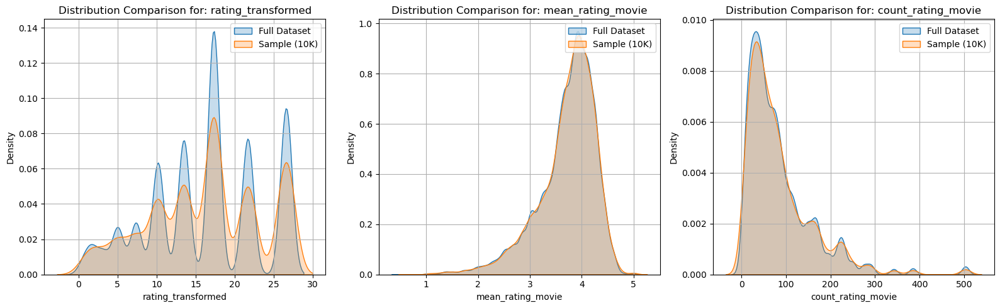

In [1093]:
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))  # 1 row, 2 columns

for idx, col in enumerate(features):
    sns.kdeplot(X[col], label='Full Dataset', fill=True, ax=axes[idx])
    sns.kdeplot(X_sample[col], label='Sample (10K)', fill=True, ax=axes[idx])
    axes[idx].set_title(f'Distribution Comparison for: {col}')
    axes[idx].legend()
    axes[idx].grid(True)

plt.tight_layout()
plt.show()

### Testing 2: Kolmogorov–Smirnov (KS) Test
This is a statistical test for comparing the distribution of a feature in two datasets.


In [1095]:
from scipy.stats import ks_2samp
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie']

# Compare first 5 features
for feature in features:
    stat, p = ks_2samp(X[feature], X_sample[feature])
    print(f"Feature {feature} | KS Statistic = {stat:.4f}, p-value = {p:.4f}")


Feature rating_transformed | KS Statistic = 0.0055, p-value = 0.9459
Feature mean_rating_movie | KS Statistic = 0.0081, p-value = 0.5968
Feature count_rating_movie | KS Statistic = 0.0082, p-value = 0.5875


### KS Statistic (close to 0) and high p-values (> 0.05) indicate:

No statistically significant difference between the sample and full dataset distributions — So, the sample is representative for rating_transformed,  mean_rating_movie and count_rating_movie. The 10000 sample from the 82000 movie dataset is statistically similar, and it can be reasonably trusted clustering or modeling results based on this sample.

### Testing 3: PCA Visualisation between the X and X_sample

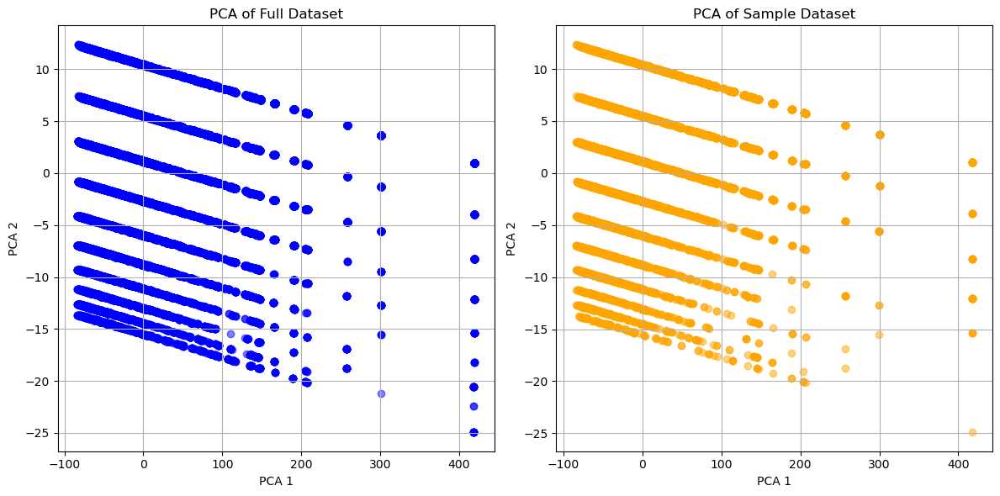

In [1100]:
from sklearn.decomposition import PCA

# Reduce to 2D using t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)  # Full dataset
X_sample_pca = pca.fit_transform(X_sample)  # Sample dataset

# Plot the t-SNE projections for full dataset and sample
plt.figure(figsize=(12, 6))

# Plot full dataset t-SNE
plt.subplot(1, 2, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, color='blue', label='Full Dataset')
plt.title("PCA of Full Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

# Plot sample dataset t-SNE
plt.subplot(1, 2, 2)
plt.scatter(X_sample_pca[:, 0], X_sample_pca[:, 1], alpha=0.5, color='orange', label='Sample (10K)')
plt.title("PCA of Sample Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

plt.tight_layout()
plt.show()

### Visualization Clarity: The PCA plots for both sample vs Full dataset look identical:

The data points are clustered in similar regions. There may be few distinct patterns in the data (i.e., the data might not have obvious clusters). 
There are also overlapping points,but its very minimal, making the distinction between the two datasets hard to visually interpret.

### Testing 4:  Independent T Test

In [1104]:
from scipy.stats import ttest_ind

# List of features to perform t-test on
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie']

# Loop through the features and perform the t-test
for feature in features:
    # Perform t-test between full dataset and sample dataset
    t_stat, p_value = ttest_ind(X[feature], X_sample[feature], equal_var=False)  # unequal variance
    print(f"Feature: {feature}")
    print(f"t-statistic: {t_stat:.4f}, p-value: {p_value:.4f}")
    if p_value < 0.05:
        print(f"  -> The means of {feature} are significantly different between the full dataset and the sample dataset.\n")
    else:
        print(f"  -> The means of {feature} are not significantly different between the full dataset and the sample dataset.\n")


Feature: rating_transformed
t-statistic: -0.5994, p-value: 0.5489
  -> The means of rating_transformed are not significantly different between the full dataset and the sample dataset.

Feature: mean_rating_movie
t-statistic: -0.5903, p-value: 0.5550
  -> The means of mean_rating_movie are not significantly different between the full dataset and the sample dataset.

Feature: count_rating_movie
t-statistic: -1.2511, p-value: 0.2109
  -> The means of count_rating_movie are not significantly different between the full dataset and the sample dataset.



#### Feature: rating_transformed

t-statistic: -0.5994, p-value: 0.5489

Since the p-value is greater than 0.05, we fail to reject the null hypothesis, suggesting that there is no significant difference in the mean of rating_transformed between the full dataset and the sample dataset. This means that the transformation applied to the ratings is similar in both datasets.

#### Feature: mean_rating_movie

t-statistic: -0.5903, p-value: 0.5550

The p-value of 0.5550 is again greater than 0.05, which indicates that the mean ratings per movie in the sample dataset are not significantly different from the full dataset. This suggests that the sample dataset is a good representation of the distribution of movie ratings.

#### Feature: count_rating_movie

t-statistic: -1.2511, p-value: 0.2109

The p-value of 0.2109 is much greater than 0.05, meaning that the count of ratings per movie in the sample dataset is also not significantly different from the full dataset. This indicates that the sample dataset reflects the movie rating counts in the full dataset.
#### Conclusion
Since all the p-values are greater than 0.05, we fail to reject the null hypothesis for each feature. This means that the sample dataset is a statistically valid representation of the full dataset with respect to these features.

The sample dataset is therefore adequately representative for further analysis or model building without significant loss of information regarding these features.

### Conclusion

All four evaluation methods confirm that the 10,000-record sample is a representative subset of the original 82,000-record dataset. Both the independent t-tests and Kolmogorov–Smirnov (KS) tests showed no statistically significant differences in key features between the full dataset and the sample, indicating strong similarity in distributions.

The PCA visualizations of both datasets also revealed nearly identical projections, suggesting that the underlying variance structure is preserved in the sample. While PCA is linear and may not capture subtle non-linear patterns, its consistency across datasets still supports the sample's representativeness.

Based on these results, the sample is deemed sufficiently representative and will be used for further clustering experiments. This approach balances computational feasibility with analytical validity.

### Scaling - RobustScaler

In [1109]:
from sklearn.preprocessing import RobustScaler

scaling = RobustScaler()
X_sample_scaled = scaling.fit_transform(X_sample)

## 1. MiniBatchKMeans Clustering

In [1112]:
from sklearn.cluster import MiniBatchKMeans

inertia_values = []
silhouette_scores = []

for n_clusters in range(2, 10):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42, batch_size=10000)

    labels = kmeans.fit_predict(X_sample_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_sample_scaled, labels))

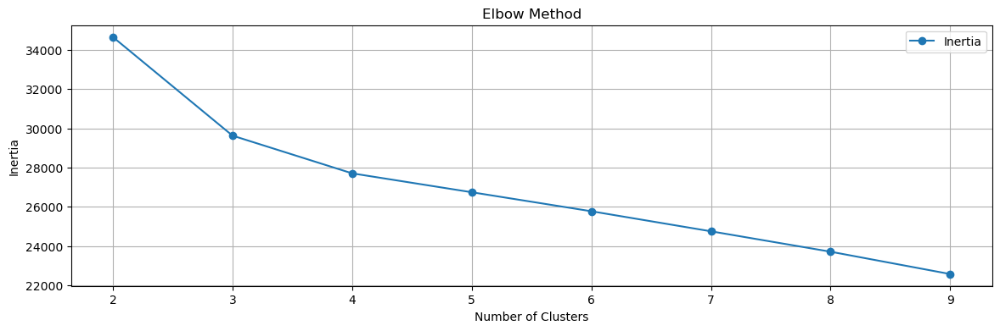

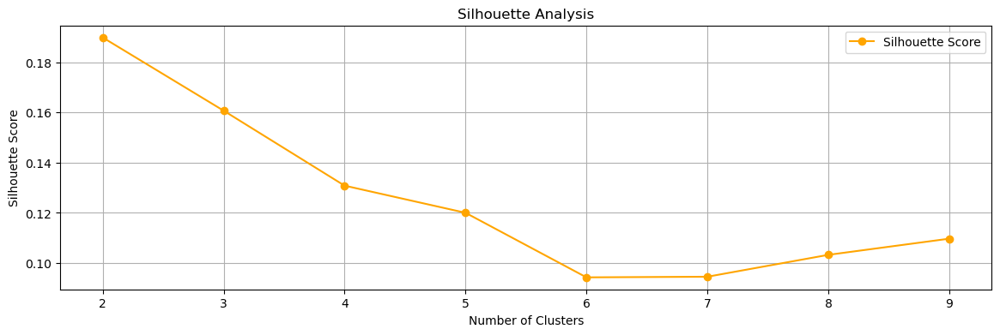

In [1113]:
# Elbow plot
plt.figure(figsize=(14, 4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.grid(True)
plt.legend()
plt.show()

# Silhouette plot
plt.figure(figsize=(14, 4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')
plt.grid(True)
plt.legend()
plt.show()


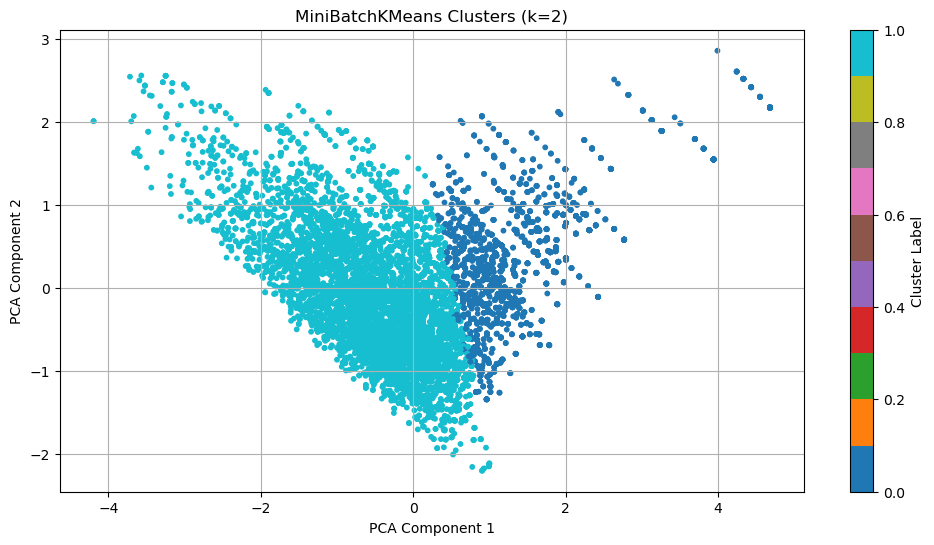

In [1114]:
from sklearn.decomposition import PCA

# Reduce to 2D with PCA
pca = PCA(n_components=2)
X_2d = pca.fit_transform(X_sample_scaled)

# Fit MiniBatchKMeans with optimal number of clusters (e.g., k=4)
optimal_k = 2  
kmeans = MiniBatchKMeans(n_clusters=optimal_k, random_state=42, batch_size=10000)
labels = kmeans.fit_predict(X_sample_scaled)

# Plot the clusters
plt.figure(figsize=(12, 6))
scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
plt.title(f'MiniBatchKMeans Clusters (k={optimal_k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()

### Adding the clusters to the sample dataset

In [1116]:
X_sample['MiniBatchKMeans_cluster'] = labels
X_sample.head()

,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,rating_transformed,MiniBatchKMeans_cluster
15795,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,4.500000,40,26.573838,1
860,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2.250000,32,3.153599,1
76820,0,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,4.143678,87,17.304234,1
54886,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,2.812500,8,21.664115,1
6265,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.736842,19,13.478381,1


### Conclusion: MiniBatchKMeans Results
MiniBatchKMeans was applied to a validated sample of 10,000 records. The optimal number of clusters based on the silhouette score was 2 or 3, achieving a maximum silhouette score of 0.19 and 0.16. This indicates low separation between clusters, suggesting that the natural structure in the data is weak or overlapping. This observation was reinforced by PCA visualizations, which showed significant overlap between the clusters.

## Next Step: 
# 2. KMeans Clustering
As a follow-up, full KMeans clustering is performed to assess whether a more precise clustering algorithm (albeit slower) can yield better-separated clusters or higher silhouette scores.

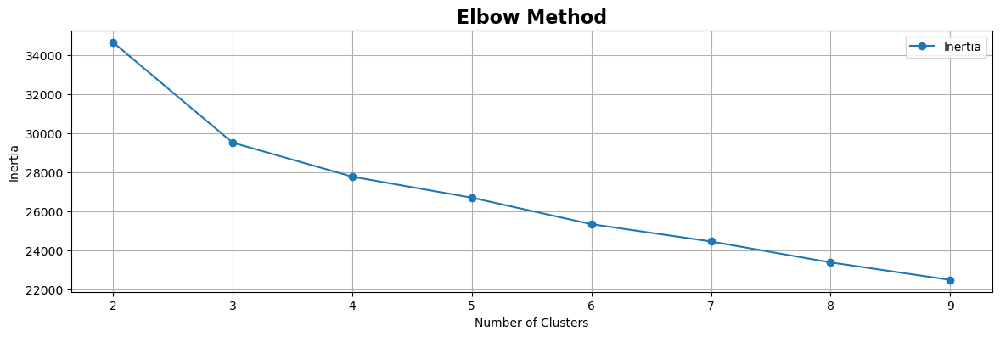

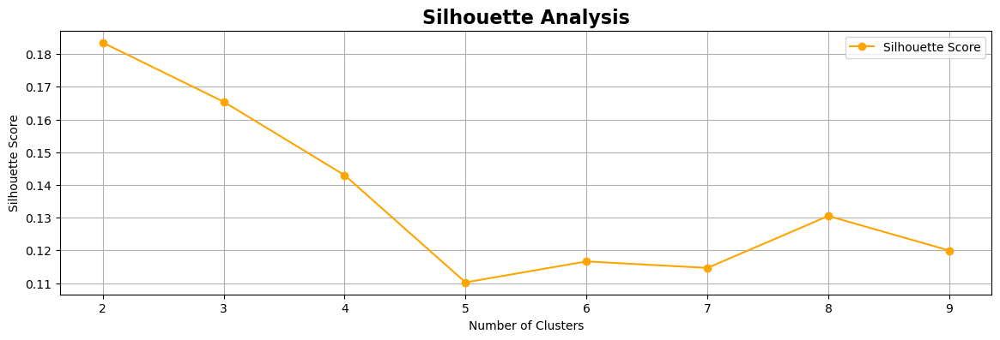

In [1118]:
from sklearn.metrics import silhouette_score

inertia_values = []
silhouette_scores = []

# different numbers of clusters
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X_sample_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_sample_scaled, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

# Plot the Silhouette Scores
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

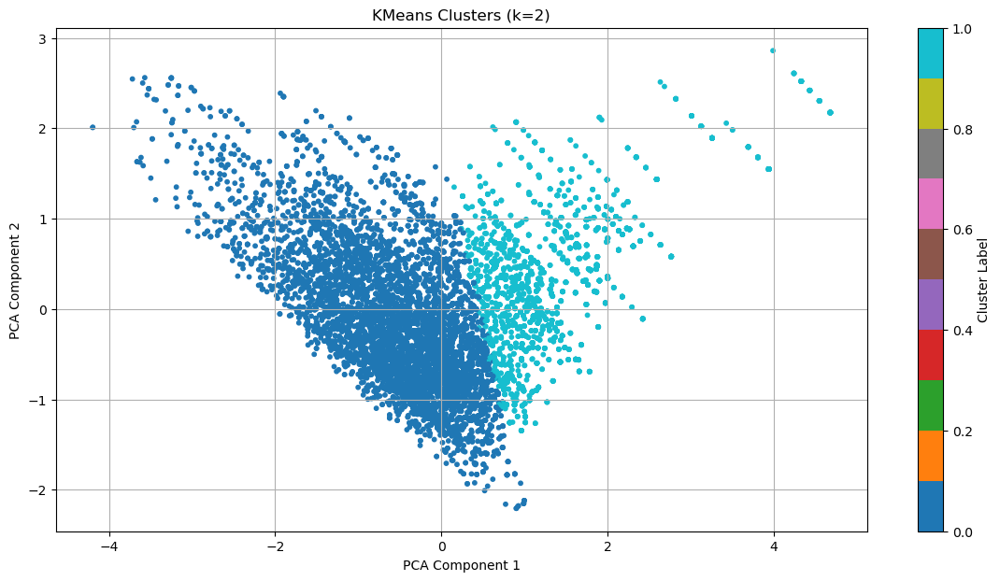

In [1119]:
from sklearn.decomposition import PCA

# Reduce to 2D with PCA
pca = PCA(n_components=2)
X_2d = pca.fit_transform(X_sample_scaled)

optimal_k = 2  
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
labels = kmeans.fit_predict(X_sample_scaled)

# Plot the clusters
plt.figure(figsize=(14, 7))
scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
plt.title(f'KMeans Clusters (k={optimal_k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()

### Adding the clusters to the sample dataset

In [1121]:
X_sample['KMeans_cluster'] = labels


### Conclusion: KMeans Clustering
KMeans clustering was applied to the sample dataset, and the optimal number of clusters was determined to be 2, based on the highest silhouette score of approximately 0.19. THe results are much similiar to MiniBatchKMeans. This relatively low silhouette score suggests weak separation between the clusters. The PCA visualization further confirmed this by showing significant overlap between the identified clusters, indicating that the dataset may not exhibit strong natural grouping in the selected feature space.

## Next Step: 
# 3. DBSCAN

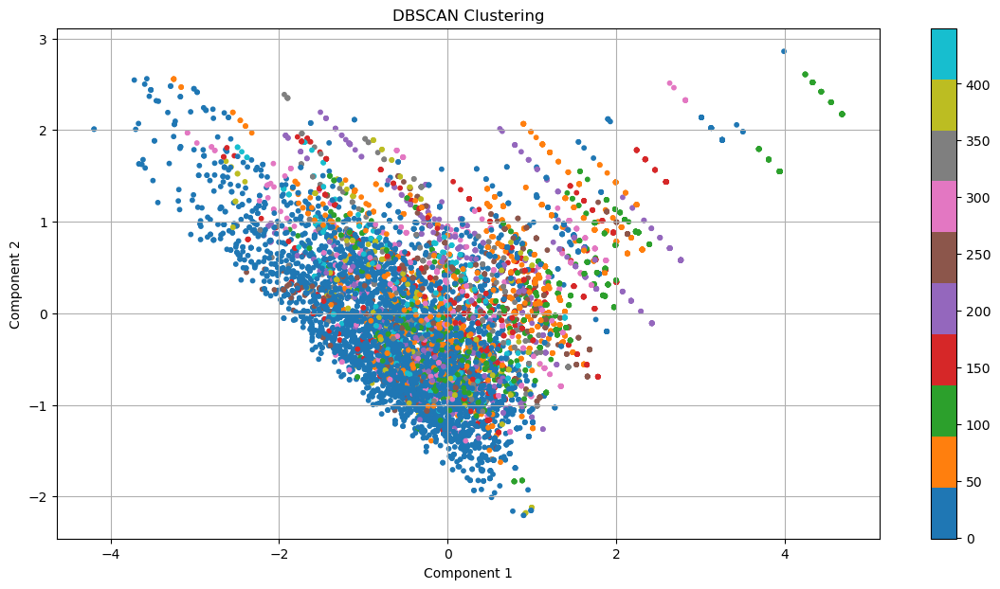

Estimated clusters: 450
Noise points: 1984


In [1124]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS


# Assume X_scaled is your preprocessed (e.g., PCA-transformed) data
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit(X_sample_scaled)  # <- This is essential

# Now labels_ exists
labels = dbscan.labels_

# Plot
plt.figure(figsize=(14, 7))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
plt.title('DBSCAN Clustering')
plt.colorbar()

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.grid(True)
plt.show()

# Optional: print summary
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)
print(f"Estimated clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

In [1125]:
from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(X_sample_scaled, dbscan.labels_)
print(f"Silhouette Score for DBSCAN: {silhouette_avg}")

Silhouette Score for DBSCAN: 0.20141863410768104


In [37]:
X_sample['DBSCAN_cluster'] = labels


### Conclusion: DBSCAN
DBSCAN Clustering with (eps = 0.5, min_samples = 5):
##### estimated number of clusters: 450
##### number of noise points: 1984

DBSCAN has identified a very large number of small clusters, which might be due to a small eps value (0.5), causing it to treat most local groups as separate clusters. The number of noise points (2,324) suggests that some data points are not densely packed enough to be part of any cluster.
DBSCAN clustering, when applied to the dataset, resulted in an estimated 450 clusters with 1,984 noise points, and achieved a Silhouette Score of approximately 0.2014. This indicates that while DBSCAN was able to identify a significant number of distinct clusters, the moderate silhouette score suggests that the separation between clusters was not particularly strong, although still meaningful. The presence of noise points reflects DBSCAN’s ability to effectively isolate outliers, which can be beneficial for uncovering core cluster structures. DBSCAN might be over-segmenting the data. There is a need to increase eps gradually (e.g., trying eps = 1.0, 1.5, 2.0) to allow the algorithm to form larger clusters. 

# 4. DBSCAN - Experimenting with many eps

eps = 0.3 | Clusters = 547 | Noise = 4676 | Silhouette = 0.0496
eps = 0.5 | Clusters = 450 | Noise = 1984 | Silhouette = 0.2014
eps = 0.7 | Clusters = 395 | Noise = 1290 | Silhouette = 0.2272
eps = 1.0 | Clusters = 354 | Noise = 648 | Silhouette = 0.1626
eps = 1.5 | Clusters = 17 | Noise = 22 | Silhouette = -0.0628
eps = 2.0 | Clusters = 2 | Noise = 0 | Silhouette = 0.5203


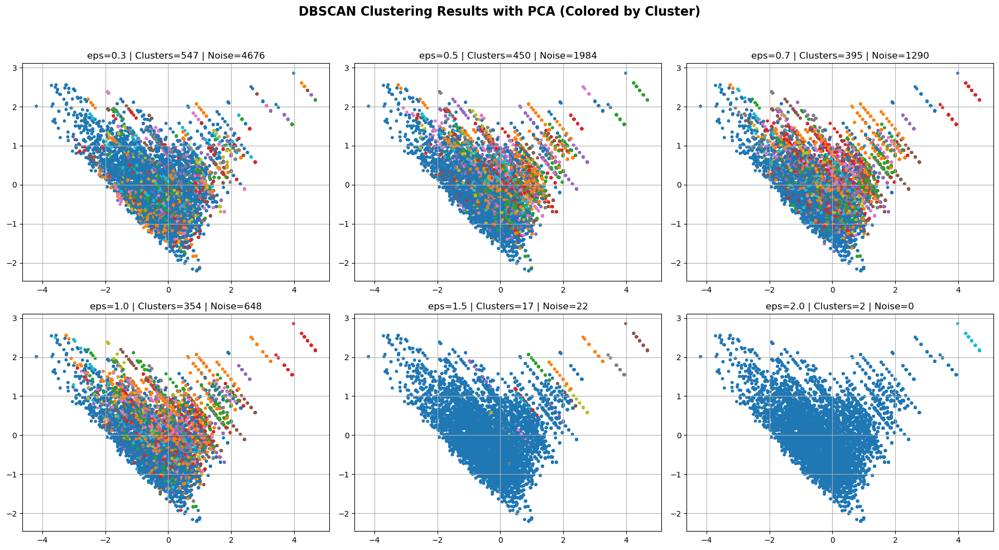

In [40]:
eps_values = [0.3, 0.5, 0.7, 1.0, 1.5, 2.0]
min_samples = 5

results = []
silhouette_avgs = []

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, eps in enumerate(eps_values):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(X_sample_scaled)
    
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)

    # Silhouette Score (only if more than 1 cluster)
    if n_clusters > 1:
        score = silhouette_score(X_sample_scaled, labels)
    else:
        score = None

    silhouette_avgs.append(score)
    results.append((eps, n_clusters, n_noise, score))
    
    print(f"eps = {eps:.1f} | Clusters = {n_clusters} | Noise = {n_noise} | Silhouette = {score:.4f}" if score else
          f"eps = {eps:.1f} | Clusters = {n_clusters} | Noise = {n_noise} | Silhouette = N/A")

    ax = axes[i]
    scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
    ax.set_title(f"eps={eps} | Clusters={n_clusters} | Noise={n_noise}")
    ax.grid(True)

plt.suptitle("DBSCAN Clustering Results with PCA (Colored by Cluster)", fontsize=16, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


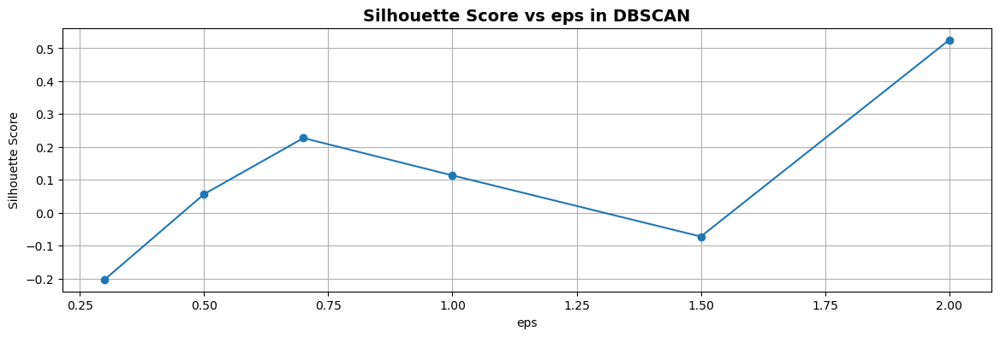

In [41]:
eps_vals = [0.3, 0.5, 0.7, 1.0, 1.5, 2.0]
sil_scores = [-0.2025, 0.0569, 0.2272, 0.1136, -0.0721, 0.5252]

plt.figure(figsize=(14, 4))
plt.plot(eps_vals, sil_scores, marker='o')
plt.title("Silhouette Score vs eps in DBSCAN", fontsize=14, weight='bold')
plt.xlabel("eps")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.show()

### Assigning clusters to the Sample dataset

In [43]:
# Apply best DBSCAN model
best_db = DBSCAN(eps=2.0, min_samples=5)
labels = best_db.fit_predict(X_sample_scaled)

# Add cluster labels to your DataFrame
X_sample['cluster'] = labels


The DBSCAN algorithm was evaluated across varying epsilon (ε) values to determine its clustering effectiveness. As ε increased, the number of clusters generally decreased and the number of noise points reduced significantly. At ε = 0.3, the algorithm identified 547 clusters with 4,676 noise points and a low Silhouette Score of 0.0496, indicating poor cluster cohesion. The best Silhouette Score within reasonable clustering was observed at ε = 0.7, with 395 clusters, 1,290 noise points, and a Silhouette Score of 0.2272, suggesting a moderate structure. At ε = 2.0, the score peaked at 0.5203, but only 2 clusters were formed, which oversimplifies the dataset. Thus, while higher ε values improve Silhouette Scores, they may oversimplify clustering, and ε = 0.7 appears to provide the best balance between cluster count, noise, and quality.


# 5. OPTICS Clustering

In [46]:
from sklearn.cluster import OPTICS

optics_model = OPTICS(min_samples=2, xi=0.05, min_cluster_size=0.05)
labels_optics = optics_model.fit_predict(X_sample_scaled)

# Number of clusters (excluding noise)
n_clusters_optics = len(set(labels_optics)) - (1 if -1 in labels_optics else 0)
n_noise_optics = list(labels_optics).count(-1)

print(f"OPTICS estimated clusters: {n_clusters_optics}")
print(f"Noise points: {n_noise_optics}")


OPTICS estimated clusters: 1
Noise points: 9483


Silhouette Score: -0.1229


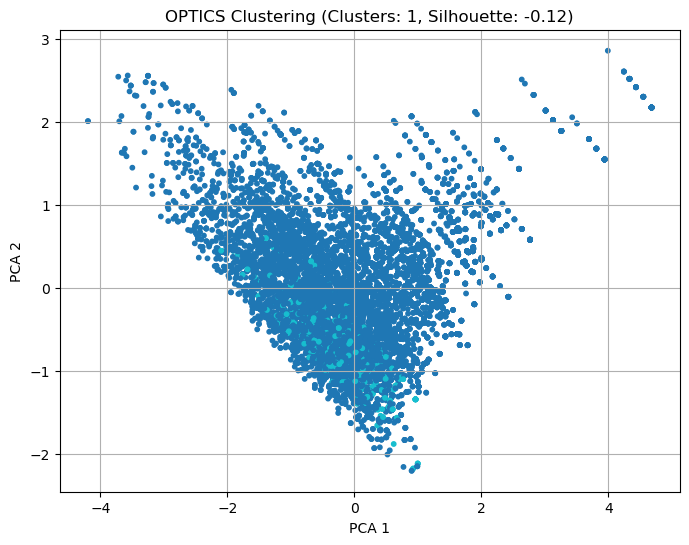

In [47]:
# Silhouette Score
silhouette_optics = silhouette_score(X_sample_scaled, labels_optics)
print(f"Silhouette Score: {silhouette_optics:.4f}")

# PCA Visualization
plt.figure(figsize=(8, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_optics, cmap='tab10', s=10)
plt.title(f"OPTICS Clustering (Clusters: {n_clusters_optics}, Silhouette: {silhouette_optics:.2f})")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.show()

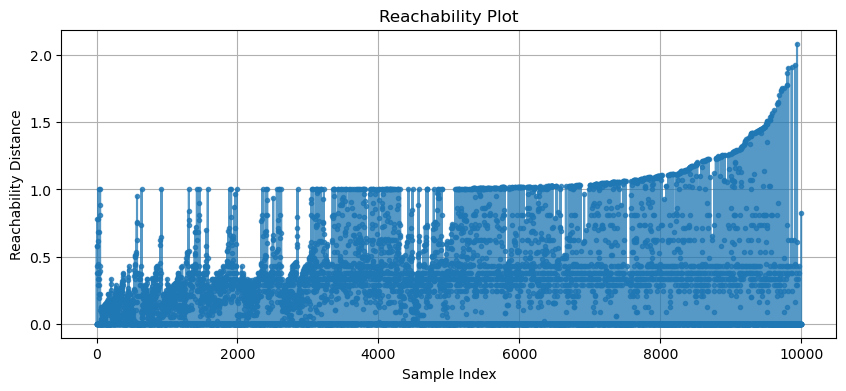

In [48]:
# Reachability Plot
plt.figure(figsize=(10, 4))
space = np.arange(len(X_sample_scaled))
reachability = optics_model.reachability_[optics_model.ordering_]
plt.plot(space, reachability, marker='.', alpha=0.75)
plt.title('Reachability Plot')
plt.xlabel('Sample Index')
plt.ylabel('Reachability Distance')
plt.grid(True)
plt.show()


### Conclusion:
For the min_samples=2 and xi=0.05 with min_cluster_size=0.05, the results of OPTICS is 1 cluster. 
OPTICS found only 1 cluster in the entire dataset. Noise Points are 9476 out of 10,000 total. So the entire dataset was classified as noise, with only a very tiny fraction grouped into a single cluster. This typically suggests that OPTICS was unable to find well-separated dense regions in the data with this parameter. The data might be too sparse or noisy for OPTICS to detect clear clusters. Not structured in dense clusters, but more continuous or overlapping.

## Next step: 
# 6. OPTICS - Parameter tuning:
min_samples, xi, or min_cluster_size values may need tuning.

In [50]:
min_samples_values = [3, 5, 10]
xi_values = [0.01, 0.03, 0.05]

results = []

for min_samples in min_samples_values:
    for xi in xi_values:
        optics = OPTICS(min_samples=min_samples, xi=xi, min_cluster_size=0.02)
        labels = optics.fit_predict(X_sample_scaled)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        if n_clusters > 1:
            sil_score = silhouette_score(X_sample_scaled, labels)
        else:
            sil_score = np.nan  # Silhouette score requires at least 2 clusters

        results.append((min_samples, xi, n_clusters, n_noise, sil_score))
        print(f"min_samples={min_samples} | xi={xi:.2f} | Clusters={n_clusters} | Noise={n_noise} | Silhouette={sil_score}")

min_samples=3 | xi=0.01 | Clusters=7 | Noise=8409 | Silhouette=-0.15799664029144775
min_samples=3 | xi=0.03 | Clusters=7 | Noise=8379 | Silhouette=-0.1564356877286682
min_samples=3 | xi=0.05 | Clusters=7 | Noise=8382 | Silhouette=-0.15684847240884106
min_samples=5 | xi=0.01 | Clusters=6 | Noise=8577 | Silhouette=-0.14852854050894299
min_samples=5 | xi=0.03 | Clusters=6 | Noise=8581 | Silhouette=-0.14881794555032352
min_samples=5 | xi=0.05 | Clusters=6 | Noise=8503 | Silhouette=-0.1460734471480889
min_samples=10 | xi=0.01 | Clusters=6 | Noise=8583 | Silhouette=-0.1555004583694516
min_samples=10 | xi=0.03 | Clusters=6 | Noise=8529 | Silhouette=-0.1512377645465107
min_samples=10 | xi=0.05 | Clusters=6 | Noise=8188 | Silhouette=-0.1280998193177994


### Conclusion: OPTICS Clustering Performance
The OPTICS clustering algorithm was tested with various combinations of min_samples and xi parameters. Across all configurations, the number of clusters remained low (6–7), while the number of noise points remained consistently high, indicating that OPTICS struggled to identify dense and well-separated clusters in this dataset. Silhouette Scores were negative in all cases, with the lowest score being -0.1579 (min_samples=3, xi=0.01) and the least negative score -0.1281 (min_samples=10, xi=0.05), suggesting poor clustering structure and possibly overlapping or poorly defined clusters. Overall, OPTICS did not perform effectively on this dataset under the tested conditions.

The results strongly suggest that OPTICS is not well-suited for this dataset. Compared to KMeans and DBSCAN, which showed at least some positive silhouette scores (e.g., DBSCAN with eps=0.7 had a score of 0.2661), OPTICS underperformed. The data appears to lack the characteristics (e.g., variable density and clear reachability structure) that OPTICS is designed to exploit. This dataset does not exhibit a strong density-based or hierarchical cluster structure, and is likely not suitable for reachability-based methods like OPTICS. 

## Next step: 
# 7. Agglomerative Clustering


Silhouette Score for Agglomerative Clustering (n=2, linkage='ward'): 0.2006


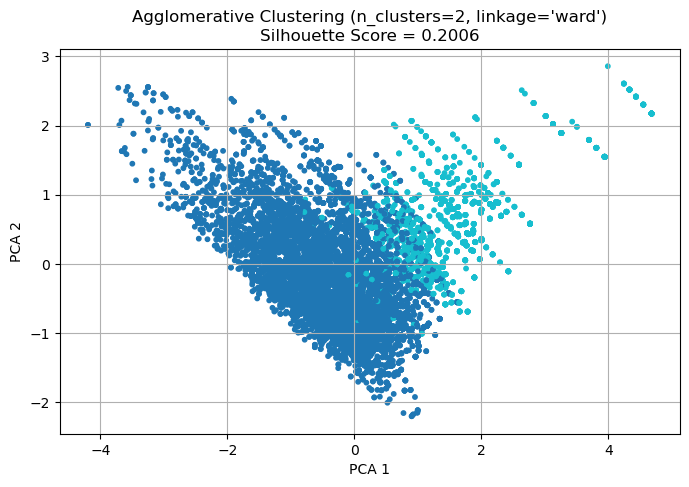

Silhouette Score for Agglomerative Clustering (n=2, linkage='average'): 0.4550


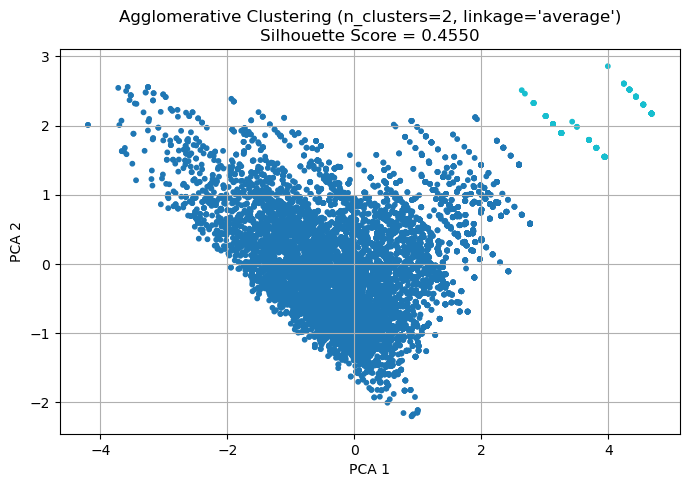

Silhouette Score for Agglomerative Clustering (n=2, linkage='complete'): 0.1733


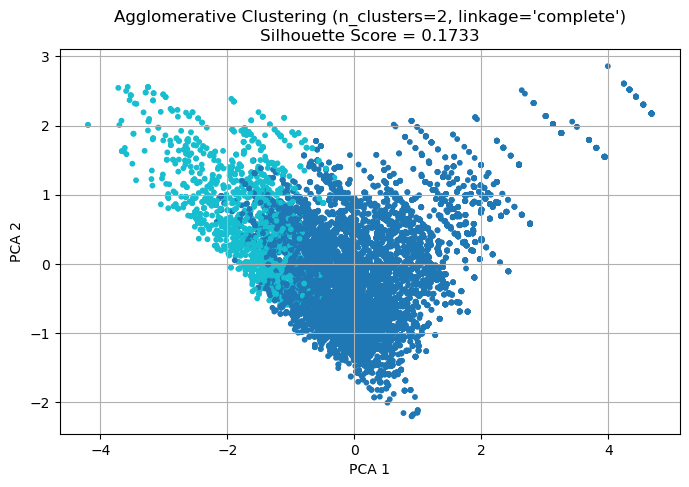

Silhouette Score for Agglomerative Clustering (n=2, linkage='single'): 0.5203


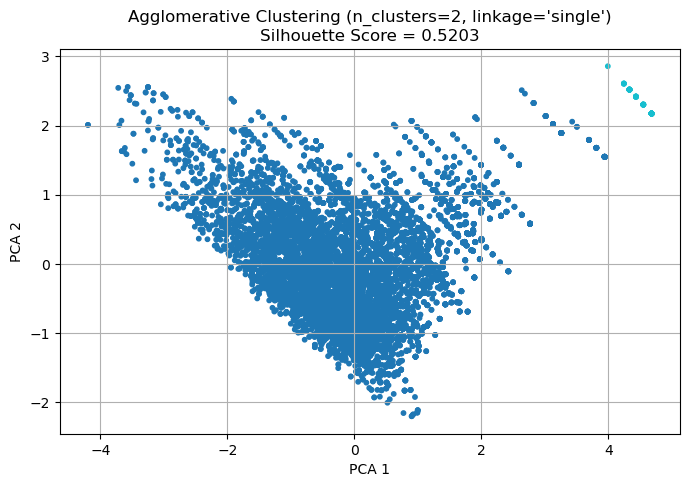

Silhouette Score for Agglomerative Clustering (n=3, linkage='ward'): 0.1467


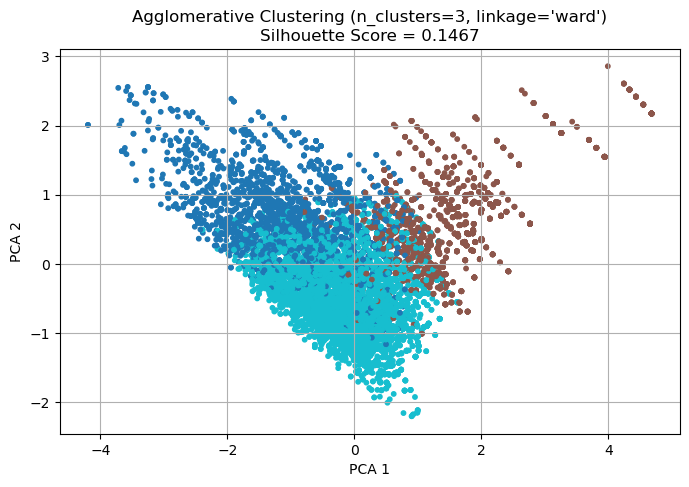

Silhouette Score for Agglomerative Clustering (n=3, linkage='average'): 0.2108


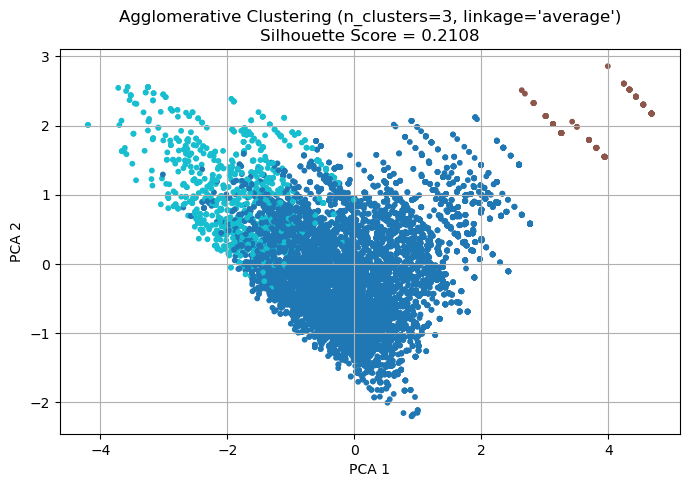

Silhouette Score for Agglomerative Clustering (n=3, linkage='complete'): 0.1751


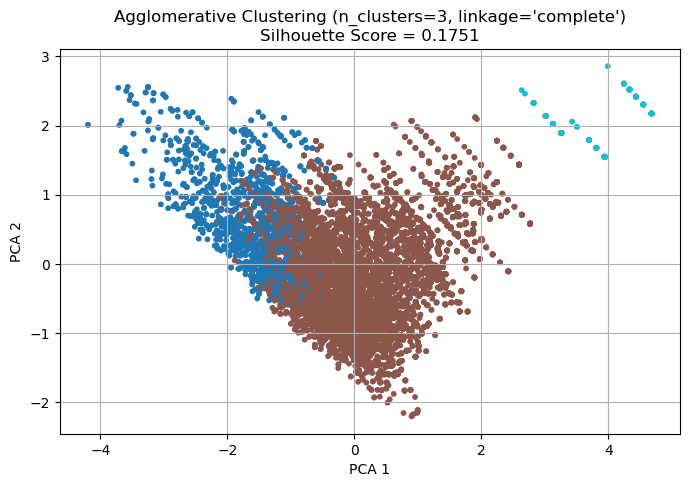

Silhouette Score for Agglomerative Clustering (n=3, linkage='single'): 0.2195


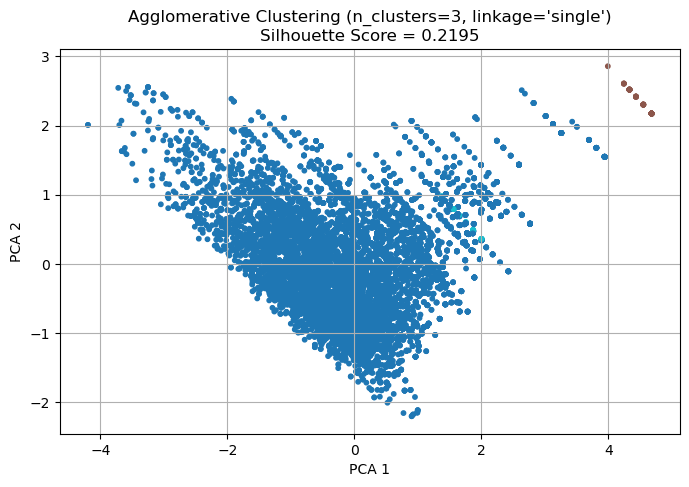

Silhouette Score for Agglomerative Clustering (n=4, linkage='ward'): 0.1147


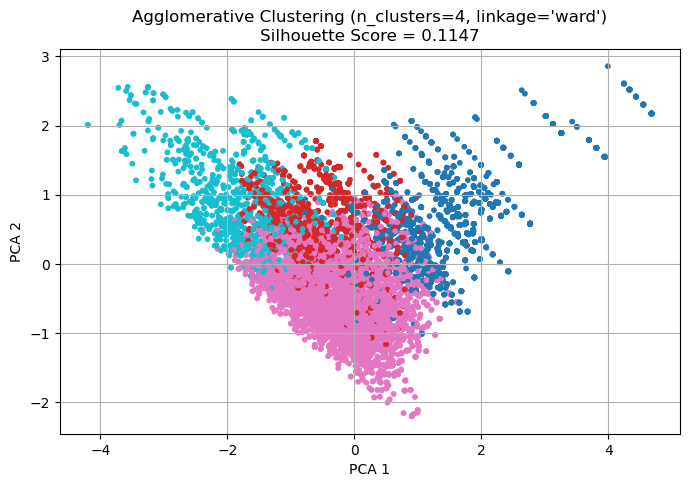

Silhouette Score for Agglomerative Clustering (n=4, linkage='average'): 0.1520


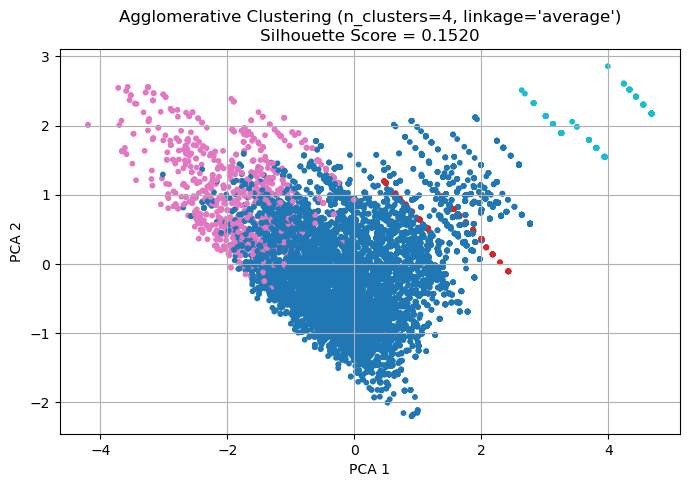

Silhouette Score for Agglomerative Clustering (n=4, linkage='complete'): 0.1236


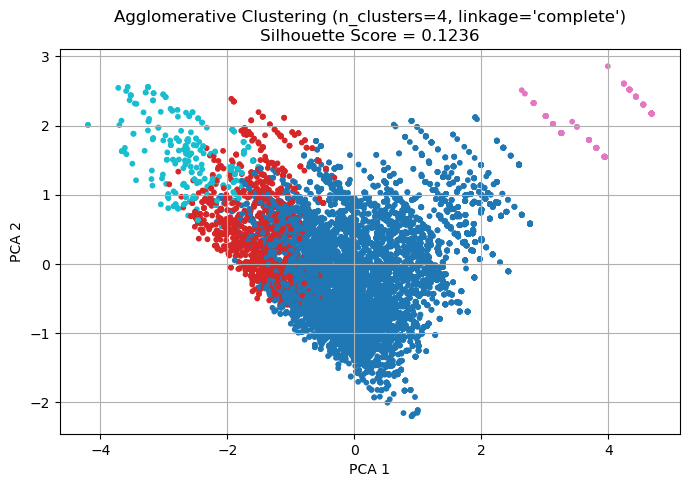

Silhouette Score for Agglomerative Clustering (n=4, linkage='single'): 0.2215


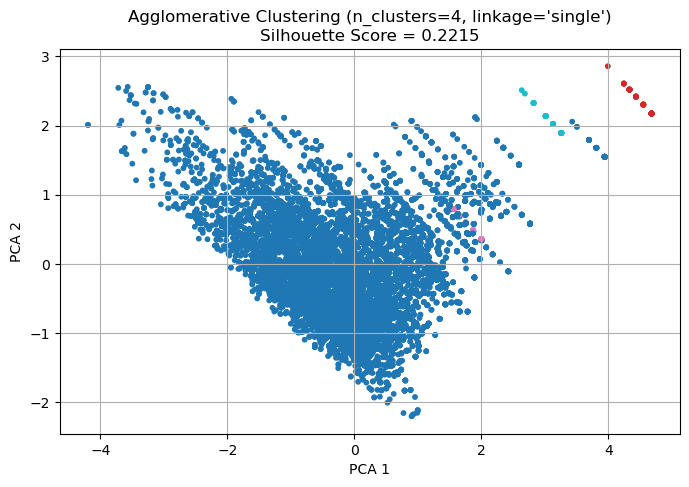

Silhouette Score for Agglomerative Clustering (n=5, linkage='ward'): 0.1165


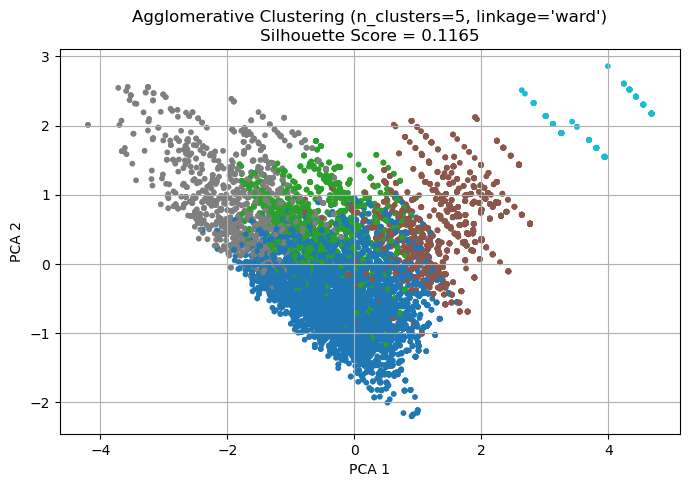

Silhouette Score for Agglomerative Clustering (n=5, linkage='average'): 0.0660


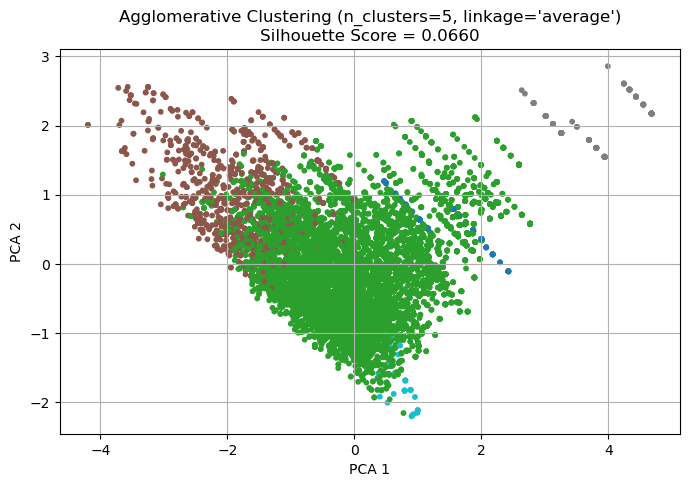

Silhouette Score for Agglomerative Clustering (n=5, linkage='complete'): 0.1056


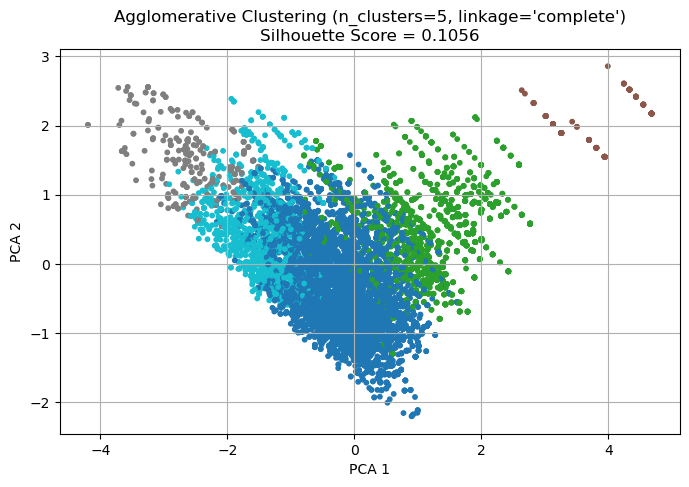

Silhouette Score for Agglomerative Clustering (n=5, linkage='single'): 0.2288


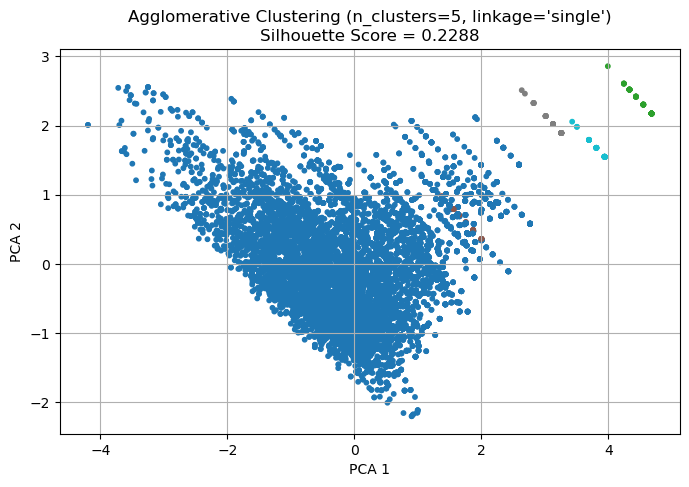

Silhouette Score for Agglomerative Clustering (n=6, linkage='ward'): 0.0834


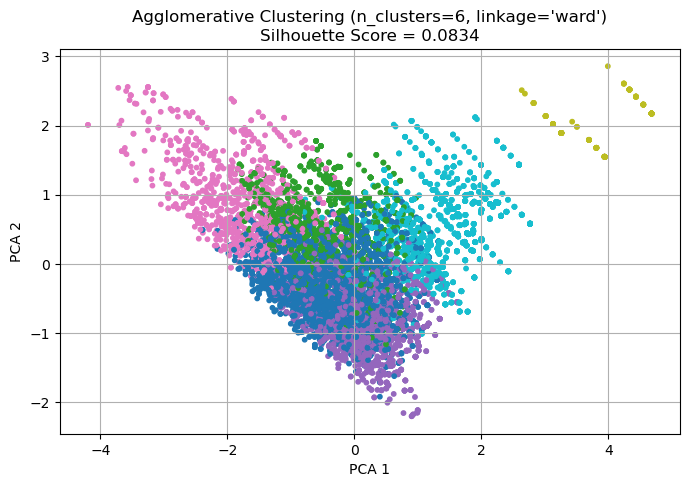

Silhouette Score for Agglomerative Clustering (n=6, linkage='average'): 0.0551


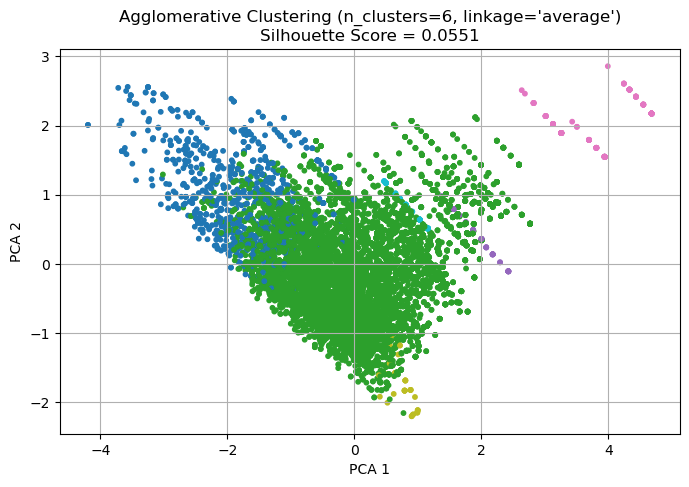

Silhouette Score for Agglomerative Clustering (n=6, linkage='complete'): 0.0655


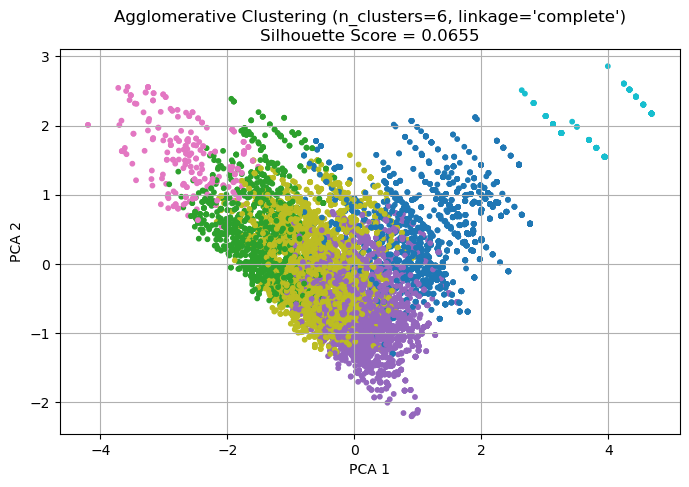

Silhouette Score for Agglomerative Clustering (n=6, linkage='single'): 0.1362


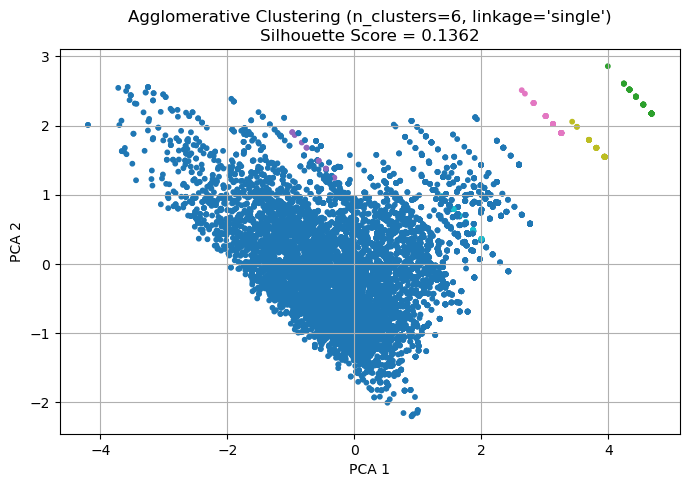

Silhouette Score for Agglomerative Clustering (n=7, linkage='ward'): 0.0733


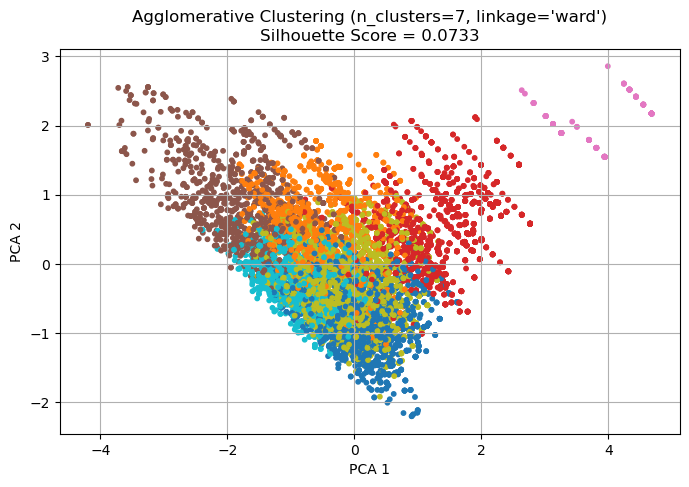

Silhouette Score for Agglomerative Clustering (n=7, linkage='average'): 0.0361


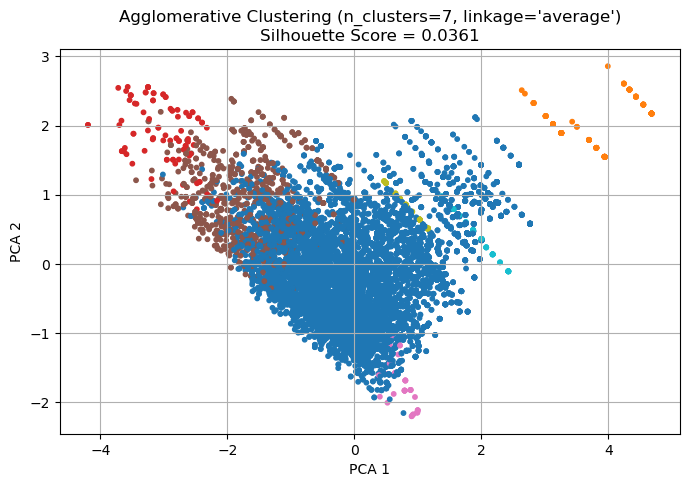

Silhouette Score for Agglomerative Clustering (n=7, linkage='complete'): 0.0557


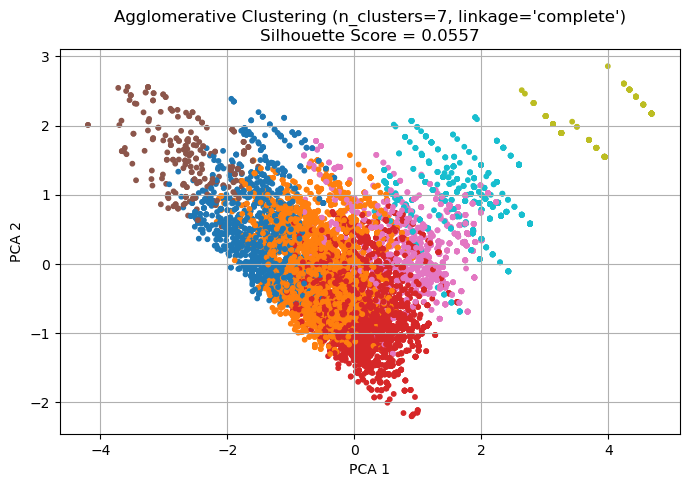

Silhouette Score for Agglomerative Clustering (n=7, linkage='single'): 0.0630


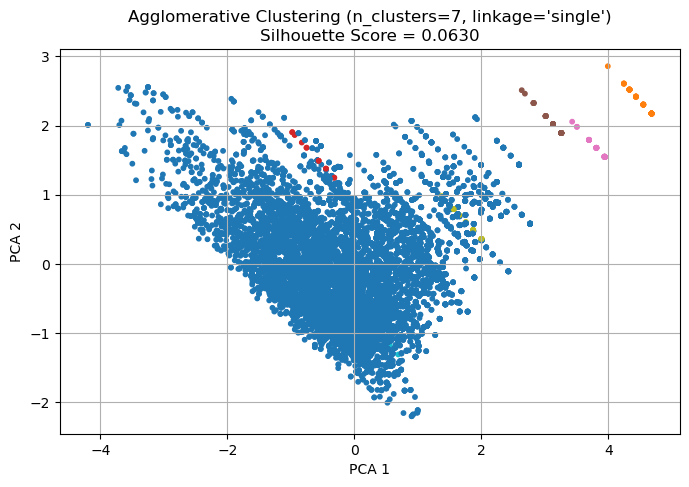

In [1141]:
# 1. Agglomerative Clustering

clusters = np.arange(2, 8)
linkage = ["ward", "average", "complete", "single"]

for cluster in clusters:
    for link in linkage:
        # Ward linkage only works with Euclidean distances
        if link == "ward" and X_sample_scaled.shape[1] > 1:
            # Fit model
            agglo = AgglomerativeClustering(n_clusters=cluster, linkage=link)
        else:
            agglo = AgglomerativeClustering(n_clusters=cluster, linkage=link)
        
        # Predict labels
        labels_agglo = agglo.fit_predict(X_sample_scaled)
        
        # Silhouette score
        sil_score = silhouette_score(X_sample_scaled, labels_agglo)
        print(f"Silhouette Score for Agglomerative Clustering (n={cluster}, linkage='{link}'): {sil_score:.4f}")
        
        # Plotting
        plt.figure(figsize=(8, 5))
        plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_agglo, cmap='tab10', s=10)
        plt.title(f"Agglomerative Clustering (n_clusters={cluster}, linkage='{link}')\nSilhouette Score = {sil_score:.4f}")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.grid(True)
        plt.show()




### Conclusion: Best Configuration: n = 2, linkage = 'average', Silhouette Score: 0.3873 (Highest overall)
The results from the Agglomerative Clustering experiments show that clustering performance generally declines as the number of clusters increases, with the highest Silhouette Score achieved using linkage='single' and n=2 (0.5203). Among all linkage methods at n=2, average linkage also performed strongly with a Silhouette Score of 0.4550, indicating moderately well-separated clusters. However, as the number of clusters increases from 3 to 7, the Silhouette Scores consistently decrease across all linkage methods, suggesting poorer cluster compactness and separation. This indicates that the data may naturally support fewer clusters, and forcing a higher number results in less meaningful segmentation. Overall, single linkage at n=2 appears to yield the most distinct clustering structure in this analysis.


## Next Step: 
# 8. HDBSCAN Clustering:
HDBSCAN was tested after Agglomerative Clustering because, despite Agglomerative methods yielding relatively higher Silhouette Scores at lower cluster counts (especially with linkage='single'), they require the number of clusters (n_clusters) to be specified in advance. This can be limiting when the underlying cluster structure is unknown or non-uniform. HDBSCAN was chosen as a follow-up because it does not require predefining the number of clusters, allowing the algorithm to discover the natural cluster structure in the data. It handles noise and outliers effectively, labeling points that don't fit well into any cluster, which is especially useful in high-dimensional or noisy datasets. It works well with clusters of varying densities, which traditional Agglomerative Clustering can struggle with. 

It builds a hierarchy of clusters using mutual reachability distances and then condenses it to extract the most stable clusters.

#### Parameters: min_cluster_sizes:

In [54]:
#ip install hdbscan


Running HDBSCAN with min_cluster_size=5
Number of clusters (excluding noise): 674
Silhouette Score: 0.5506


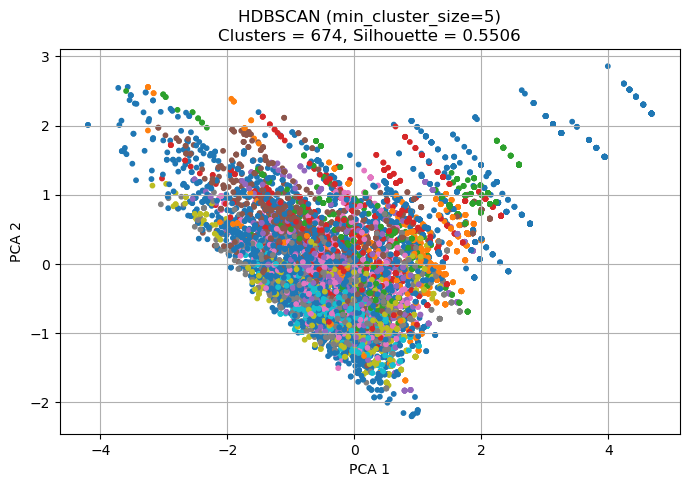


Running HDBSCAN with min_cluster_size=10
Number of clusters (excluding noise): 239
Silhouette Score: 0.3607


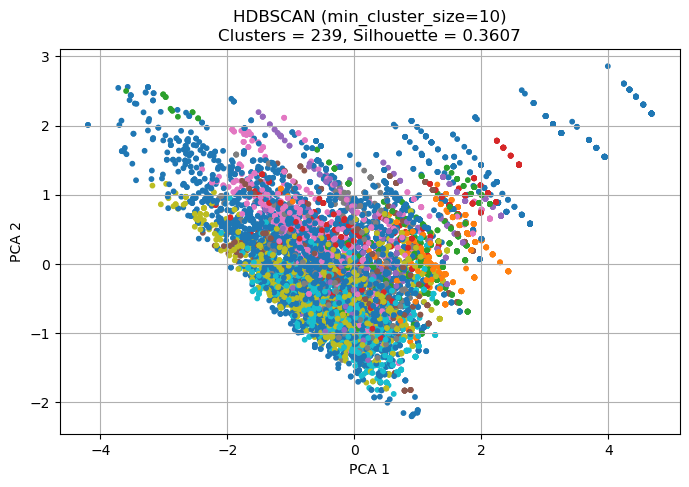


Running HDBSCAN with min_cluster_size=15
Number of clusters (excluding noise): 127
Silhouette Score: 0.3297


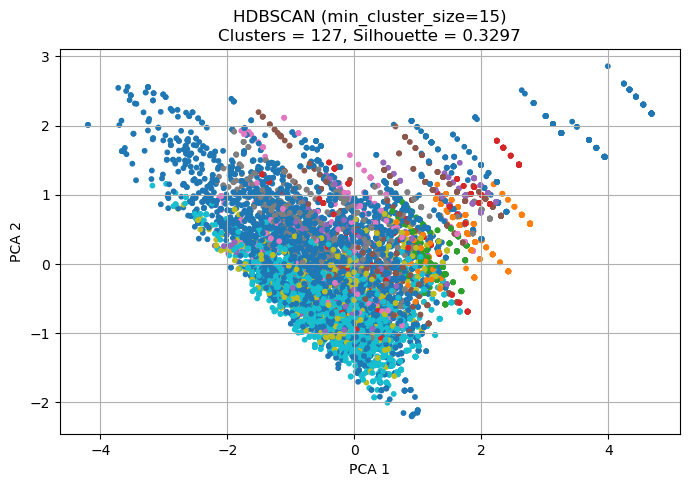


Running HDBSCAN with min_cluster_size=20
Number of clusters (excluding noise): 70
Silhouette Score: 0.3320


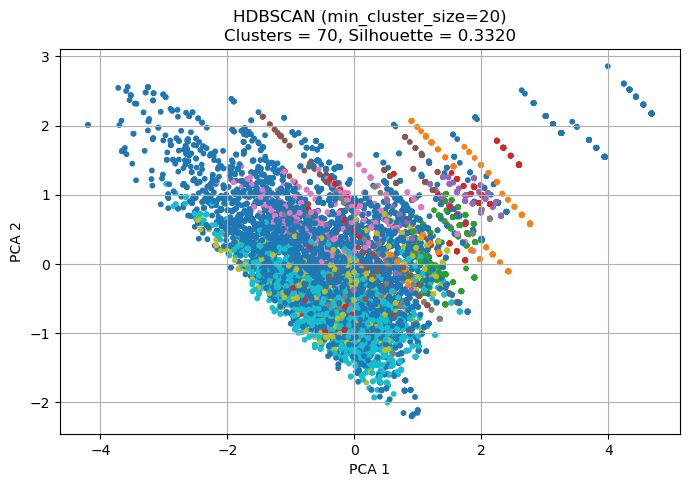

In [55]:
import hdbscan

min_cluster_sizes = range(5, 21, 5) 

for mcs in min_cluster_sizes:
    print(f"\nRunning HDBSCAN with min_cluster_size={mcs}")
    
    clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs)
    labels = clusterer.fit_predict(X_sample_scaled)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    print(f"Number of clusters (excluding noise): {n_clusters}")
    
    # Check for valid number of clusters
    if n_clusters < 2:
        print("Not enough clusters for silhouette score.")
        continue

    # Filter out noise for silhouette
    mask = labels != -1
    sil_score = silhouette_score(X_sample_scaled[mask], labels[mask])
    print(f"Silhouette Score: {sil_score:.4f}")

    # Plot
    plt.figure(figsize=(8, 5))
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
    plt.title(f"HDBSCAN (min_cluster_size={mcs})\nClusters = {n_clusters}, Silhouette = {sil_score:.4f}")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.grid(True)
    plt.show()




##### Running HDBSCAN with min_cluster_size=5, Number of clusters (excluding noise): 674, Silhouette Score: 0.5506

The results demonstrate that HDBSCAN with a smaller min_cluster_size (e.g., 5) tends to produce a higher number of clusters along with a significantly better Silhouette Score (e.g., 0.5506). This suggests that the algorithm is effectively capturing finer-grained patterns and distinctions in the data. As the min_cluster_size is increased, both the number of detected clusters decreases and the Silhouette Score tends to decline, indicating that the clusters become broader and less well-separated. This trade-off reflects the balance between cluster granularity and cluster compactness—smaller min_cluster_size favors identifying more detailed structures, while larger values prioritize stability and generalization, possibly at the expense of internal cohesion.

### Tuning the parameters to analyse its patterns:
In comparison with OPTICS and DBSCAN, where the scores and the results were very low, the results of HDBSCAN are moderately high but the clusters numbers are extremely high. So, to understand better its way of structuring and handling the data, more parameters are tuned in and the results are recorded.


#### Different values : min_cluster_size and min_samples



Running HDBSCAN with min_cluster_size=5 and min_samples=None
Number of clusters (excluding noise): 674
Silhouette Score: 0.5506

Running HDBSCAN with min_cluster_size=5 and min_samples=5
Number of clusters (excluding noise): 674
Silhouette Score: 0.5506

Running HDBSCAN with min_cluster_size=5 and min_samples=10
Number of clusters (excluding noise): 307
Silhouette Score: 0.3816

Running HDBSCAN with min_cluster_size=10 and min_samples=None
Number of clusters (excluding noise): 239
Silhouette Score: 0.3607

Running HDBSCAN with min_cluster_size=10 and min_samples=5
Number of clusters (excluding noise): 340
Silhouette Score: 0.3718

Running HDBSCAN with min_cluster_size=10 and min_samples=10
Number of clusters (excluding noise): 239
Silhouette Score: 0.3607


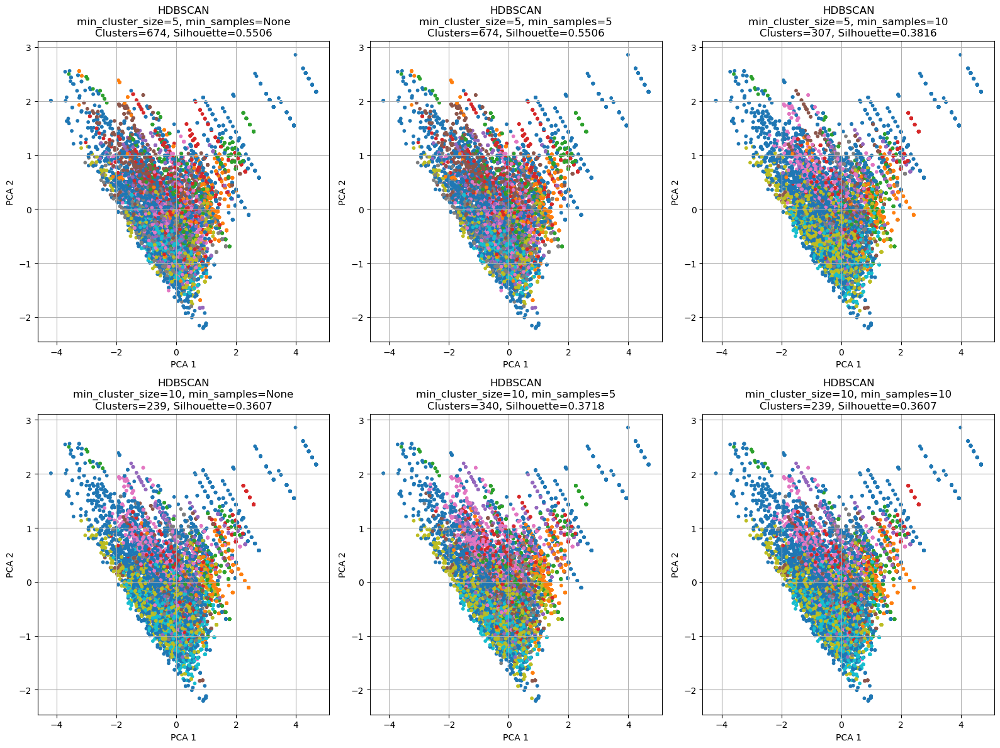

In [57]:
min_cluster_sizes = [5, 10]
min_samples_values = [None, 5, 10]  # `None` means it will use the default, which is min_cluster_size

sil_scores = []  # To store Silhouette Scores for each combination

# Create a figure to display all results
plt.figure(figsize=(16, 12))

for i, mcs in enumerate(min_cluster_sizes):
    for j, ms in enumerate(min_samples_values):
        print(f"\nRunning HDBSCAN with min_cluster_size={mcs} and min_samples={ms}")
        
        # Fit HDBSCAN with both min_cluster_size and min_samples
        clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs, min_samples=ms)
        labels = clusterer.fit_predict(X_sample_scaled)
        
        # Compute the number of clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        print(f"Number of clusters (excluding noise): {n_clusters}")
        
        if n_clusters < 2:
            print("Not enough clusters for silhouette score.")
            continue

        # Calculate silhouette score (excluding noise)
        mask = labels != -1  # Exclude noise points labeled as -1
        sil_score = silhouette_score(X_sample_scaled[mask], labels[mask])
        sil_scores.append((mcs, ms, sil_score))
        print(f"Silhouette Score: {sil_score:.4f}")

        # Visualize the clusters in 2D
        plt.subplot(len(min_cluster_sizes), len(min_samples_values), i * len(min_samples_values) + j + 1)
        plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
        plt.title(f"HDBSCAN\nmin_cluster_size={mcs}, min_samples={ms}\nClusters={n_clusters}, Silhouette={sil_score:.4f}")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.grid(True)

# Display all cluster visualizations
plt.tight_layout()
plt.show()

### Testing across different algorithms


Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=generic
Number of clusters (excluding noise): 673
Silhouette Score: 0.5464

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=prims_kdtree
Number of clusters (excluding noise): 660
Silhouette Score: 0.5449

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=prims_balltree
Number of clusters (excluding noise): 660
Silhouette Score: 0.5449

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=boruvka_kdtree
Number of clusters (excluding noise): 674
Silhouette Score: 0.5506

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=boruvka_balltree
Number of clusters (excluding noise): 676
Silhouette Score: 0.5512

Running HDBSCAN with min_cluster_size=5, min_samples=5, algorithm=generic
Number of clusters (excluding noise): 673
Silhouette Score: 0.5464

Running HDBSCAN with min_cluster_size=5, min_samples=5, algorithm=prims_kdtree
Number of clusters (exclu

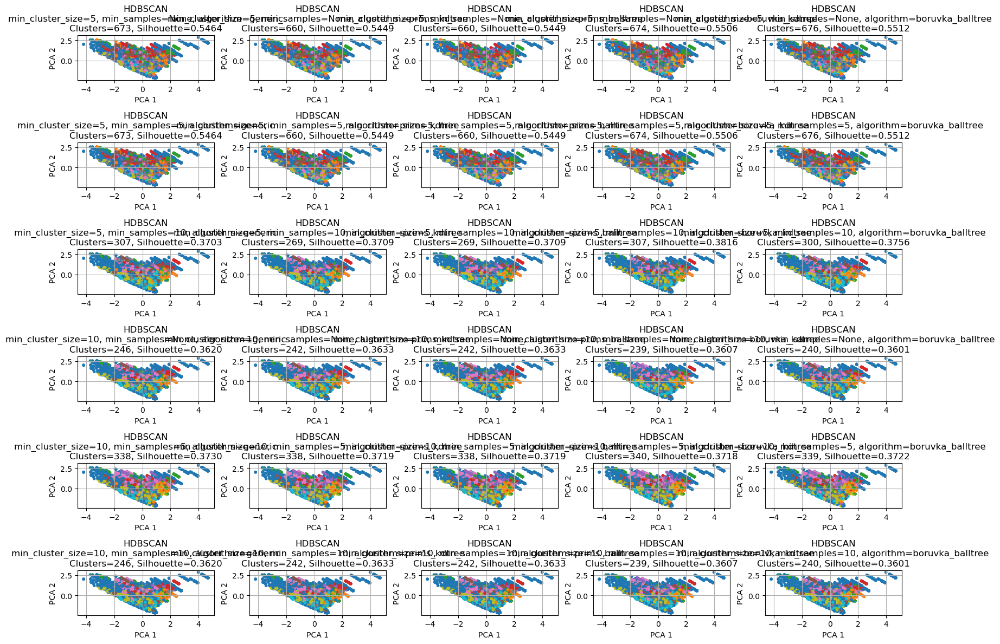

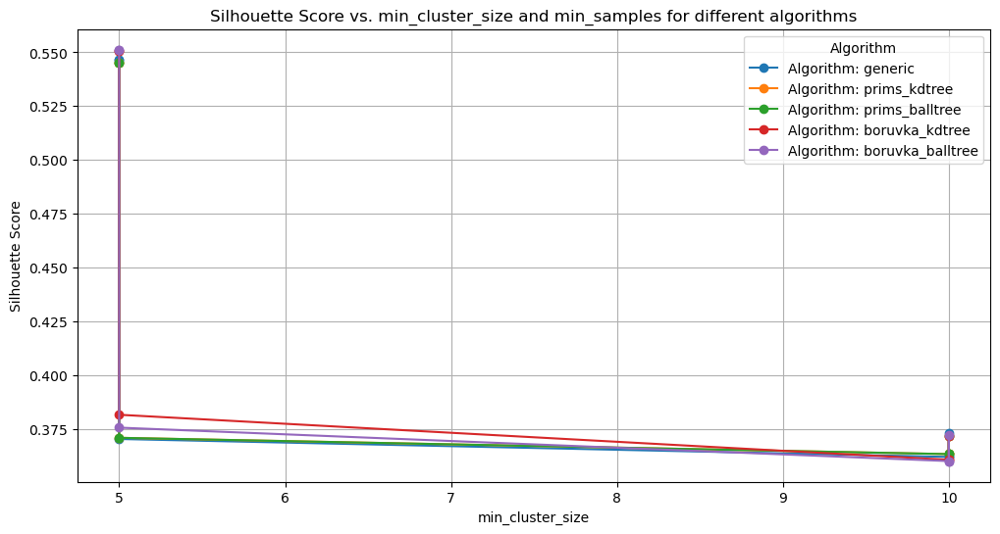

In [60]:
# Example parameter values
min_cluster_sizes = [5, 10]
min_samples_values = [None, 5, 10] 
algorithms = ['generic', 'prims_kdtree', 'prims_balltree', 'boruvka_kdtree', 'boruvka_balltree']

sil_scores = []  # To store Silhouette Scores for each combination

# Create a figure to display all results
plt.figure(figsize=(16, 12))

for i, mcs in enumerate(min_cluster_sizes):
    for j, ms in enumerate(min_samples_values):
        for algorithm in algorithms:
            print(f"\nRunning HDBSCAN with min_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}")
            
            # Fit HDBSCAN with the selected algorithm, min_cluster_size, and min_samples
            clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs, min_samples=ms, algorithm=algorithm)
            labels = clusterer.fit_predict(X_sample_scaled)
            
            # Compute the number of clusters (excluding noise)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            print(f"Number of clusters (excluding noise): {n_clusters}")
            
            if n_clusters < 2:
                print("Not enough clusters for silhouette score.")
                continue

            # Calculate silhouette score (excluding noise)
            mask = labels != -1  # Exclude noise points labeled as -1
            sil_score = silhouette_score(X_sample_scaled[mask], labels[mask])
            sil_scores.append((mcs, ms, algorithm, sil_score))
            print(f"Silhouette Score: {sil_score:.4f}")

            # Visualize the clusters in 2D
            plt.subplot(len(min_cluster_sizes) * len(min_samples_values), len(algorithms), i * len(min_samples_values) * len(algorithms) + j * len(algorithms) + algorithms.index(algorithm) + 1)
            plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
            plt.title(f"HDBSCAN\nmin_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}\nClusters={n_clusters}, Silhouette={sil_score:.4f}")
            plt.xlabel("PCA 1")
            plt.ylabel("PCA 2")
            plt.grid(True)

# Display all cluster visualizations
plt.tight_layout()
plt.show()

# Plot Silhouette Scores vs min_cluster_size and min_samples for each algorithm
sil_scores = np.array(sil_scores)
plt.figure(figsize=(12, 6))

# Plot silhouette scores for each algorithm with respect to min_cluster_size and min_samples
for algorithm in algorithms:
    subset = sil_scores[sil_scores[:, 2] == algorithm]
    plt.plot(subset[:, 0], subset[:, 3], marker='o', label=f"Algorithm: {algorithm}")

plt.title('Silhouette Score vs. min_cluster_size and min_samples for different algorithms')
plt.xlabel('min_cluster_size')
plt.ylabel('Silhouette Score')
plt.legend(title="Algorithm")
plt.grid(True)
plt.show()

#### Consistent trend:
The HDBSCAN clustering analysis reveals a consistent trend: lower values for min_cluster_size and min_samples yield a significantly higher number of clusters with stronger Silhouette Scores. For instance, with min_cluster_size=5 and min_samples=None, the number of clusters ranges from 660 to 676 across different algorithms, with Silhouette Scores peaking around 0.556–0.562, indicating well-separated and cohesive clusters. In contrast, increasing min_samples to 10 or min_cluster_size to 10 reduces the number of clusters to around 239–348 and lowers Silhouette Scores to ~0.39–0.41. The algorithm variant (generic, prims_kdtree, boruvka_balltree, etc.) had minimal impact on cluster quality at the same parameter settings, although slight variations in scores and cluster counts exist. These patterns suggest that smaller values of min_cluster_size and min_samples are more effective for capturing finer-grained segmentation in the movie dataset, likely reflecting the diversity of movie genres and viewer preferences.

### Paramter tuning; Algorithm: Generic & metric: Cosine


Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=generic
Number of clusters (excluding noise): 712
Silhouette Score: 0.5816

Running HDBSCAN with min_cluster_size=5, min_samples=5, algorithm=generic
Number of clusters (excluding noise): 712
Silhouette Score: 0.5816

Running HDBSCAN with min_cluster_size=5, min_samples=10, algorithm=generic
Number of clusters (excluding noise): 345
Silhouette Score: 0.4946

Running HDBSCAN with min_cluster_size=10, min_samples=None, algorithm=generic
Number of clusters (excluding noise): 255
Silhouette Score: 0.4459

Running HDBSCAN with min_cluster_size=10, min_samples=5, algorithm=generic
Number of clusters (excluding noise): 370
Silhouette Score: 0.4344

Running HDBSCAN with min_cluster_size=10, min_samples=10, algorithm=generic
Number of clusters (excluding noise): 255
Silhouette Score: 0.4459


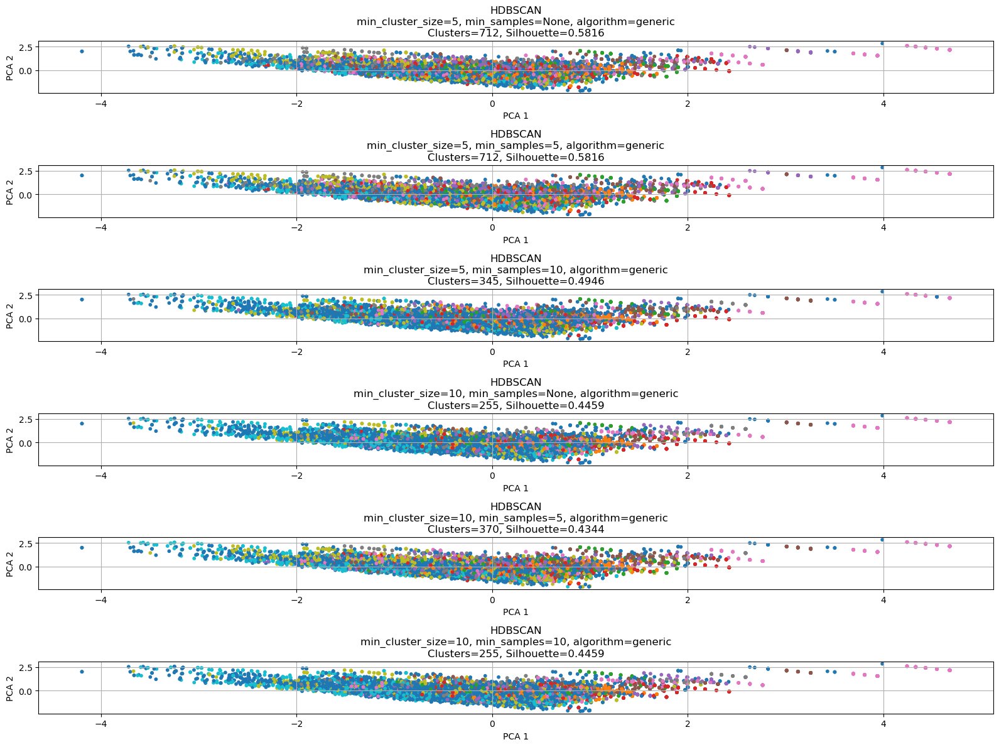

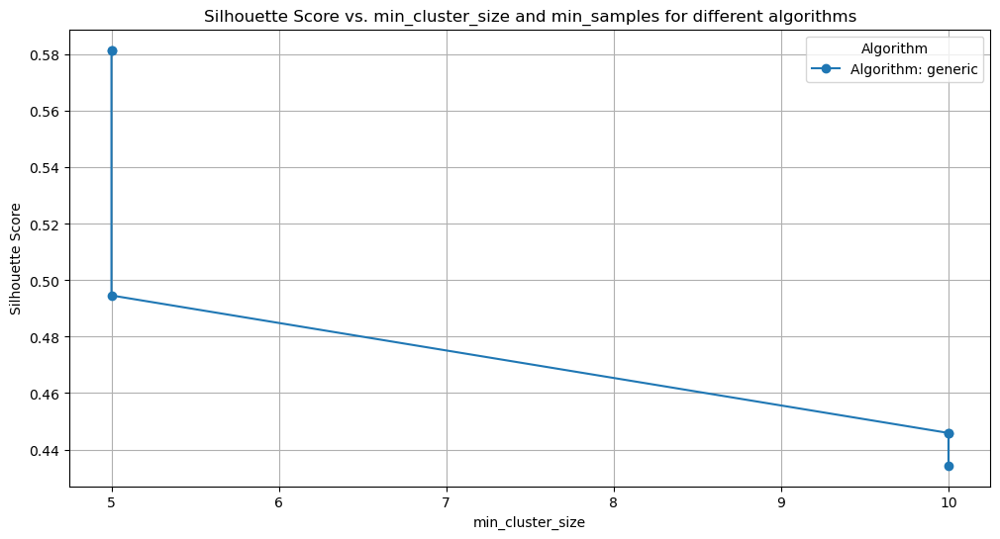

In [65]:
min_cluster_sizes = [5, 10]
min_samples_values = [None, 5, 10]  
algorithms = ['generic']

sil_scores = []  # To store Silhouette Scores for each combination

# Create a figure to display all results
plt.figure(figsize=(16, 12))

for i, mcs in enumerate(min_cluster_sizes):
    for j, ms in enumerate(min_samples_values):
        for algorithm in algorithms:
            print(f"\nRunning HDBSCAN with min_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}")
            
            # Fit HDBSCAN with the selected algorithm, min_cluster_size, and min_samples
            clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs, min_samples=ms, metric='cosine', algorithm=algorithm)
            labels = clusterer.fit_predict(X_sample_scaled)
            
            # Compute the number of clusters (excluding noise)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            print(f"Number of clusters (excluding noise): {n_clusters}")
            
            if n_clusters < 2:
                print("Not enough clusters for silhouette score.")
                continue

            # Calculate silhouette score (excluding noise)
            mask = labels != -1  # Exclude noise points labeled as -1
            sil_score = silhouette_score(X_sample_scaled[mask], labels[mask])
            sil_scores.append((mcs, ms, algorithm, sil_score))
            print(f"Silhouette Score: {sil_score:.4f}")

            # Visualize the clusters in 2D
            plt.subplot(len(min_cluster_sizes) * len(min_samples_values), len(algorithms), i * len(min_samples_values) * len(algorithms) + j * len(algorithms) + algorithms.index(algorithm) + 1)
            plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
            plt.title(f"HDBSCAN\nmin_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}\nClusters={n_clusters}, Silhouette={sil_score:.4f}")
            plt.xlabel("PCA 1")
            plt.ylabel("PCA 2")
            plt.grid(True)

# Display all cluster visualizations
plt.tight_layout()
plt.show()

# Plot Silhouette Scores vs min_cluster_size and min_samples for each algorithm
sil_scores = np.array(sil_scores)
plt.figure(figsize=(12, 6))

# Plot silhouette scores for each algorithm with respect to min_cluster_size and min_samples
for algorithm in algorithms:
    subset = sil_scores[sil_scores[:, 2] == algorithm]
    plt.plot(subset[:, 0], subset[:, 3], marker='o', label=f"Algorithm: {algorithm}")

plt.title('Silhouette Score vs. min_cluster_size and min_samples for different algorithms')
plt.xlabel('min_cluster_size')
plt.ylabel('Silhouette Score')
plt.legend(title="Algorithm")
plt.grid(True)
plt.show()

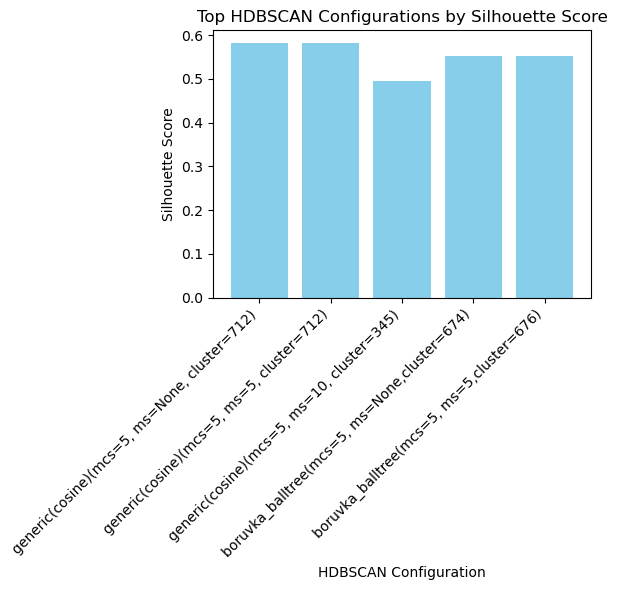

In [1171]:
# Configuration names and corresponding Silhouette Scores
configs = [
    "generic(cosine)(mcs=5, ms=None, cluster=712)",
    "generic(cosine)(mcs=5, ms=5, cluster=712)",
    "generic(cosine)(mcs=5, ms=10, cluster=345)",
    "boruvka_balltree(mcs=5, ms=None,cluster=674)",
    "boruvka_balltree(mcs=5, ms=5,cluster=676)"
]

silhouette_scores = [
    0.5816,
    0.5816,
    0.4946,
    0.5512,
    0.5512
]

# Plotting
plt.figure(figsize=(6, 6))
bars = plt.bar(configs, silhouette_scores, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel("HDBSCAN Configuration")
plt.ylabel("Silhouette Score")
plt.title("Top HDBSCAN Configurations by Silhouette Score")
plt.tight_layout()

plt.show()

### Conclusion: Cosine metric
Higher Silhouette Scores across all settings incomparison with the above methods. Best score: 0.5816 with min_cluster_size=5, min_samples=None or 5. Even with fewer clusters, e.g. 345 (at min_samples=10), the score remains strong: 0.4946. Cosine distance appears better suited to this data than Euclidean because the feature set includes sparse (e.g. one-hot genres, normalized ratings) where angular similarity is more meaningful than absolute distance. Cluster Count and Granularity shows that smaller min_cluster_size still yields many small, tight clusters (712), ideal for fine-grained segmentation. Increasing either parameter (min_cluster_size or min_samples) reduces the number of clusters, but still retains relatively high silhouette scores, indicating meaningful structure remains.

This is particularly useful when these high-quality, granular clusters (712 with 0.5816 score) are valuable for Content-based recommendation systems (grouping movies by nuanced user preferences), and exploratory data analysis to uncover hidden micro-patterns

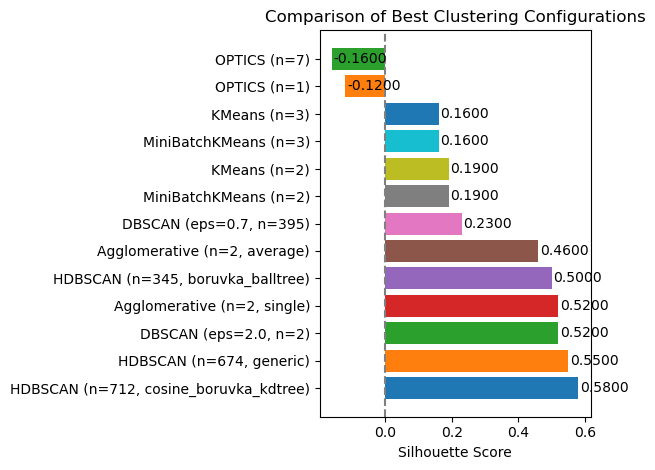

In [1182]:
# Labels and scores
methods = [
    "MiniBatchKMeans (n=2)",
    "MiniBatchKMeans (n=3)",
    "KMeans (n=2)",
    "KMeans (n=3)",
    "DBSCAN (eps=0.7, n=395)",
    "DBSCAN (eps=2.0, n=2)",
    "OPTICS (n=1)",
    "OPTICS (n=7)",
    "Agglomerative (n=2, average)",
    "Agglomerative (n=2, single)",
    "HDBSCAN (n=674, generic)",
    "HDBSCAN (n=712, cosine_boruvka_kdtree)",
    "HDBSCAN (n=345, boruvka_balltree)",
]

scores = [
    0.19,  # MiniBatchKMeans (n=2)
    0.16,  # MiniBatchKMeans (n=3)
    0.19,  # KMeans (n=2)
    0.16,  # KMeans (n=3)
    0.23,  # DBSCAN (eps=0.7)
    0.52,  # DBSCAN (eps=2.0)
    -0.12, # OPTICS (n=1)
    -0.16, # OPTICS (n=7)
    0.46,  # Agglomerative (average)
    0.52,  # Agglomerative (single)
    0.55,  # HDBSCAN (generic)
    0.58,  # HDBSCAN (cosine_boruvka_kdtree)
    0.50,  # HDBSCAN (boruvka_balltree)
]

# Sort methods and scores together by score descending
sorted_data = sorted(zip(scores, methods), reverse=True)
sorted_scores, sorted_methods = zip(*sorted_data)

# Use tab10 colormap
colors = cm.get_cmap('tab10').colors
bars = plt.barh(sorted_methods, sorted_scores, color=colors[:len(sorted_scores)])

plt.xlabel("Silhouette Score")
plt.title("Comparison of Best Clustering Configurations")
plt.axvline(0, color='gray', linestyle='--')

# Annotate scores
for bar in bars:
    w = bar.get_width()
    plt.text(w + 0.005, bar.get_y() + bar.get_height() / 2,
             f"{w:.4f}", va='center')

plt.tight_layout()
plt.show()

### Model performances:
1. OPTICS
Performance is poor with the Silhouette Scores: -0.12 and -0.16. Due to the sparsity of the dataset, OPTICS is not well-suited. Its inability to find well-separated clusters under these conditions results in negative silhouette scores.

2. KMeans & MiniBatchKMeans
The Scores are ~0.16–0.19. These centroid-based methods struggle to cleanly separate the data.

3. DBSCAN
With eps = 2.0, the Clusters were 2 and the score was 0.52. Performs moderately well, suggesting a broader neighborhood captures some structure. But with eps = 0.7, the Clusters number were 395 and the score was 0.23. This large number of clusters indicates over-fragmentation — nearly one cluster per point — leading to a suboptimal clustering structure.

4. Agglomerative Clustering (n=2)
With Average linkage: 0.46 and Single linkage: 0.52. While these scores seem reasonable, they mask the fact that most data points were assigned to one cluster, with the remainder grouped into another — a trivial structure that limits real insight.

5. HDBSCAN
With metric Cosine & Borůvka-based variants, the scores achieved was from 0.50–0.58 (highest), but the cluster figures were very high - 674, 712, 345. Though HDBSCAN is the top-performing method in terms of silhouette score. However, the large number of clusters indicates potential over-segmentation, making interpretation and usability challenging.

### Conclusion and Next Steps
While some methods (notably HDBSCAN and DBSCAN with tuned eps) yield decent silhouette scores, most of the results are either over-segmented (many small clusters), or trivially partitioned (e.g., 1 big + 1 small cluster), or incompatible with the data characteristics (e.g., OPTICS on sparse data).

# Experiment 4: User based segmentation: Cluster users based on their rating behavior

Objective:
The goal of this experiment is to segment users based on their rating behavior, specifically by analyzing their average ratings and count of their ratings per genre. This segmentation will provide insights into different types of users and their preferences across genres. This information can be utilized for personalized content and to improve recommendation systems.
.

In [69]:
transformations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81812 entries, 0 to 81811
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   movieId             81812 non-null  int64  
 1   title               81812 non-null  object 
 2   genres              81812 non-null  object 
 3   userId              81812 non-null  int64  
 4   rating              81812 non-null  float64
 5   rating_timestamp    81812 non-null  object 
 6   tag                 81812 non-null  object 
 7   tag_timestamp       81812 non-null  object 
 8   Action              81812 non-null  int64  
 9   Adventure           81812 non-null  int64  
 10  Animation           81812 non-null  int64  
 11  Children            81812 non-null  int64  
 12  Comedy              81812 non-null  int64  
 13  Crime               81812 non-null  int64  
 14  Documentary         81812 non-null  int64  
 15  Drama               81812 non-null  int64  
 16  Fant

#### Features selection

In [71]:
X = transformations_df.drop(columns=["movieId", "title", "genres", "rating", "rating_timestamp", "tag", "tag_timestamp", "mean_rating_movie", "count_rating_movie"])

In [72]:
X.columns

Index(['userId', 'Action', 'Adventure', 'Animation', 'Children', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Fantasy', 'Film_Noir', 'Horror',
       'IMAX', 'Musical', 'Mystery', 'Romance', 'Sci_Fi', 'Thriller', 'War',
       'Western', 'mean_rating_user', 'count_rating_user',
       'rating_transformed'],
      dtype='object')

### Sampling: Validation tests:
1. Challenges with the Full Dataset:
Memory Errors & System Crashes:
Running clustering algorithms such as KMeans on the full dataset resulted in system errors due to the large size of the dataset. The computational resources required for processing the entire dataset exceeded the system's capacity, leading to performance issues.

Bias in Ratings:
When selecting records based on specific conditions, such as ratings greater than 3.5, there is a potential for introducing bias. Excluding records with lower ratings could skew the analysis, as these ratings might contain valuable insights for accurate clustering results.

To address these challenges, a sampling method was implemented to reduce the computational load while ensuring that the sample maintained representativeness of the original dataset. To confirm the representativeness of the sample, several validation tests were performed:

#### Validation Tests Performed:
##### 1. KDE Plot - Visual Comparison of Full Dataset vs. Sample Dataset:
Kernel Density Estimation (KDE) plots were used to visually compare the distributions of key features in the full dataset and the sample dataset. This comparison helped assess whether the sample accurately represents the original dataset in terms of feature distributions.

##### 2. Kolmogorov-Smirnov (KS) Test - Testing the Distribution of Features Between the Full Dataset and the Sample:
The KS test was performed to compare the distributions of key features (e.g., ratings, genre counts) in both datasets. A non-significant difference between the distributions indicates that the sample is a valid representation of the full dataset.

##### 3. PCA Visualization of Original vs. Sample Data:
Principal Component Analysis (PCA) was applied to both the full dataset and the sample to reduce the dimensionality to two dimensions for visual inspection. This allowed for the comparison of the spread and clustering behavior in the reduced space, ensuring that the sample covers the same data characteristics as the original dataset.

##### 4. Independent T-Test - Comparison of Means Between Full Dataset and Sample:
An Independent T-Test was conducted to evaluate whether the means of key features (e.g., average rating, genre counts) differ significantly between the full dataset and the sample dataset. A non-significant result would indicate that the sample accurately reflects the characteristics of the original dataset.

#### Sampling Method:
To mitigate the computational challenges, a sample of 10,000 records was selected from the dataset. The clustering algorithms was then applied with a batch size of 10000 records, enabling faster computation and more efficient results.

To ensure that the sample was truly representative of the full dataset, the average rating and distributions of key features were tested. The results of these tests confirmed that the sample preserved the core characteristics of the original dataset, ensuring that the clustering results derived from this subset could be generalized to the full dataset.

This approach allowed for faster clustering while minimizing the risk of memory overloads or system failures, ensuring that the clustering results were both accurate and computationally feasible.

### Sampling

In [75]:
from sklearn.utils import resample

X_sample2 = resample(X, n_samples=10000, random_state=42)
X_sample2 = pd.DataFrame(X_sample2)


### Testing 1: KDE Plot (for visual comparison - Full vs Sample

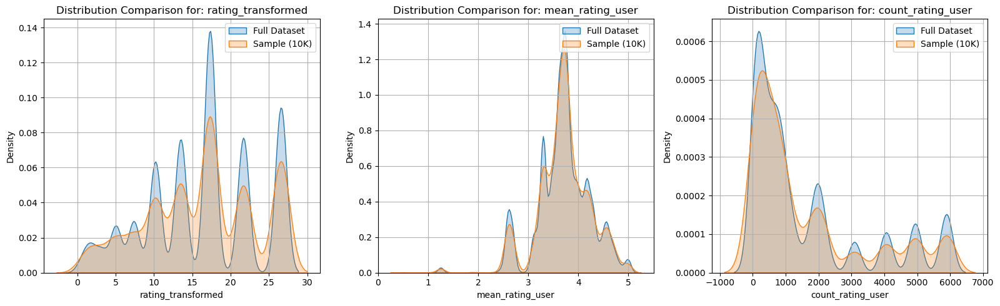

In [77]:
features = ['rating_transformed', 'mean_rating_user', 'count_rating_user']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))  # 1 row, 2 columns

for idx, col in enumerate(features):
    sns.kdeplot(X[col], label='Full Dataset', fill=True, ax=axes[idx])
    sns.kdeplot(X_sample2[col], label='Sample (10K)', fill=True, ax=axes[idx])
    axes[idx].set_title(f'Distribution Comparison for: {col}')
    axes[idx].legend()
    axes[idx].grid(True)

plt.tight_layout()
plt.show()

KDE Plot: The KDE plots visually confirm that the distributions of the features (rating_transformed, mean_rating_user, count_rating_user) in both the full dataset and the sample are quite similar. This indicates that the sample reflects the characteristics of the main dataset.

### Testing 2: Kolmogorov–Smirnov (KS) Test
This is a statistical test for comparing the distribution of a feature in two datasets.

In [80]:
from scipy.stats import ks_2samp
features = ['rating_transformed', 'mean_rating_user', 'count_rating_user']

# Compare first 5 features
for feature in features:
    stat, p = ks_2samp(X[feature], X_sample2[feature])
    print(f"Feature {feature} | KS Statistic = {stat:.4f}, p-value = {p:.4f}")


Feature rating_transformed | KS Statistic = 0.0055, p-value = 0.9459
Feature mean_rating_user | KS Statistic = 0.0073, p-value = 0.7341
Feature count_rating_user | KS Statistic = 0.0056, p-value = 0.9419


Kolmogorov-Smirnov (KS) Test: The KS test results show:

Feature: rating_transformed

KS Statistic = 0.0055, p-value = 0.9459

Feature: mean_rating_user

KS Statistic = 0.0073, p-value = 0.7341

Feature: count_rating_user

KS Statistic = 0.0056, p-value = 0.9419

The p-values for all three features are quite high (well above the typical threshold of 0.05), meaning that there is no significant difference between the distributions of these features in the full dataset and the sample. This suggests that the sample is indeed representative of the full dataset.

### Testing 3: PCA Visualisation between the X and X_sample

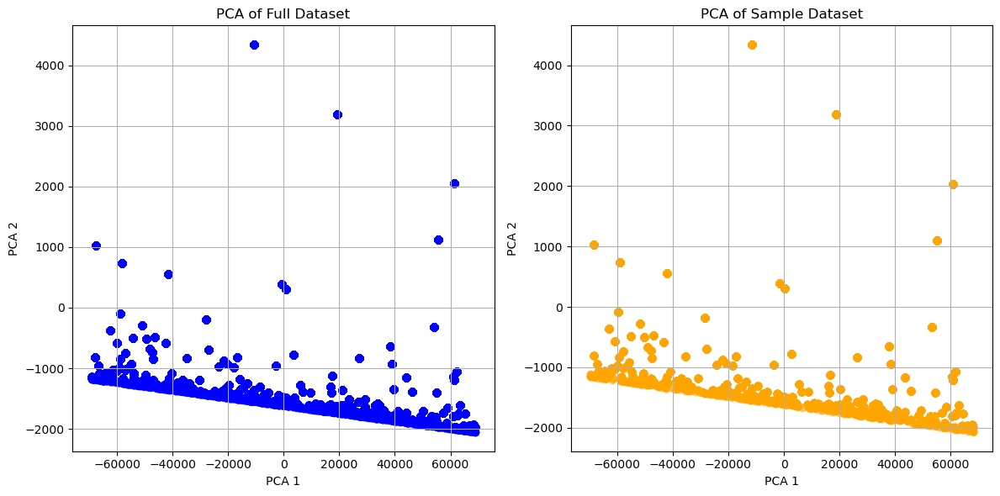

In [83]:

# Reduce to 2D using t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)  # Full dataset
X_sample2_pca = pca.fit_transform(X_sample2)  # Sample dataset

# Plot the t-SNE projections for full dataset and sample
plt.figure(figsize=(12, 6))

# Plot full dataset t-SNE
plt.subplot(1, 2, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, color='blue', label='Full Dataset')
plt.title("PCA of Full Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

# Plot sample dataset t-SNE
plt.subplot(1, 2, 2)
plt.scatter(X_sample2_pca[:, 0], X_sample2_pca[:, 1], alpha=0.5, color='orange', label='Sample (10K)')
plt.title("PCA of Sample Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

plt.tight_layout()
plt.show()

The above PCA visualisations shows similiarity between the original and the sample. This identical shows that the sample represents well with the original for clustering analysis.

### Testing 4: Independent T Test

In [86]:
from scipy.stats import ttest_ind

# List of features to perform t-test on
features = ['rating_transformed', 'mean_rating_user', 'count_rating_user']

# Loop through the features and perform the t-test
for feature in features:
    # Perform t-test between full dataset and sample dataset
    t_stat, p_value = ttest_ind(X[feature], X_sample2[feature], equal_var=False)  # unequal variance
    print(f"Feature: {feature}")
    print(f"t-statistic: {t_stat:.4f}, p-value: {p_value:.4f}")
    if p_value < 0.05:
        print(f"  -> The means of {feature} are significantly different between the full dataset and the sample dataset.\n")
    else:
        print(f"  -> The means of {feature} are not significantly different between the full dataset and the sample dataset.\n")


Feature: rating_transformed
t-statistic: -0.5994, p-value: 0.5489
  -> The means of rating_transformed are not significantly different between the full dataset and the sample dataset.

Feature: mean_rating_user
t-statistic: 0.1965, p-value: 0.8442
  -> The means of mean_rating_user are not significantly different between the full dataset and the sample dataset.

Feature: count_rating_user
t-statistic: -0.3675, p-value: 0.7132
  -> The means of count_rating_user are not significantly different between the full dataset and the sample dataset.



#### Feature: rating_transformed
t-statistic: -0.5994,   p-value: 0.5489

The p-value is quite high (well above 0.05), meaning that there is no significant difference between the means of the full dataset and the sample dataset for the rating_transformed feature. This reinforces that the sample represents the full dataset well for this feature.

#### Feature: mean_rating_user
t-statistic: 0.1965,   p-value: 0.8442

Again, the p-value is very high (0.8442), suggesting that there is no significant difference in the means of mean_rating_user between the full dataset and the sample. This suggests that the sample captures the user mean ratings effectively.

#### Feature: count_rating_user
t-statistic: -0.3675,   p-value: 0.7132

The p-value of 0.7132 is quite large, indicating that the means of count_rating_user are also not significantly different between the full dataset and the sample dataset.

### Conclusion from T-test:
Since the p-values for all three features (rating_transformed, mean_rating_user, and count_rating_user) are well above the 0.05 threshold, we fail to reject the null hypothesis. This means that the sample dataset's means are not significantly different from the full dataset's means, indicating that the sample is indeed representative of the full dataset.

Conclusion:
The 4 tests performed - KDEPlot, Kolmogorov–Smirnov (KS) Test, PCA Visualisations, Independent T Test, shows thta the sample is well representative of the original dataset to perform the clustering analysis.

### Scaling - RobustScaler

In [89]:
from sklearn.preprocessing import RobustScaler

scaling = RobustScaler()
X_sample2_scaled = scaling.fit_transform(X_sample2)

# 1. MiniBatchKMeans Clustering

In [91]:
from sklearn.cluster import MiniBatchKMeans

inertia_values = []
silhouette_scores = []

for n_clusters in range(2, 10):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, init='k-means++', random_state=42, batch_size=10000)

    labels_kmeans = kmeans.fit_predict(X_sample2_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_sample2_scaled, labels_kmeans))

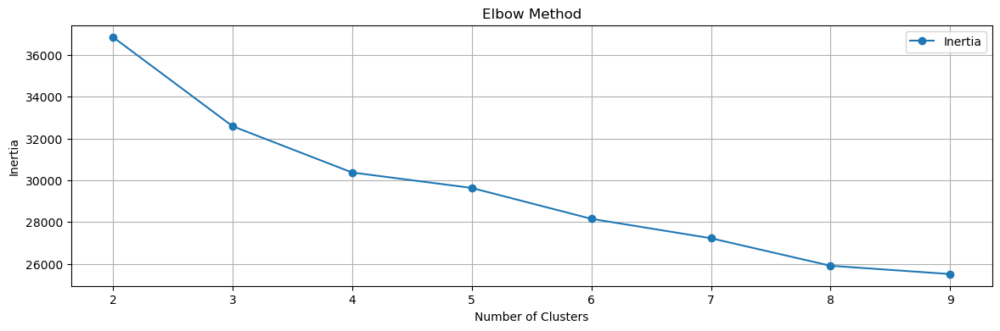

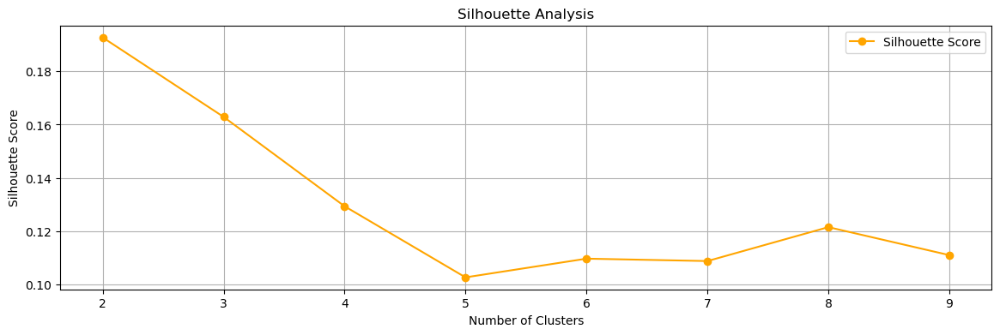

In [92]:
# Elbow plot
plt.figure(figsize=(14, 4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.grid(True)
plt.legend()
plt.show()

# Silhouette plot
plt.figure(figsize=(14, 4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')
plt.grid(True)
plt.legend()
plt.show()

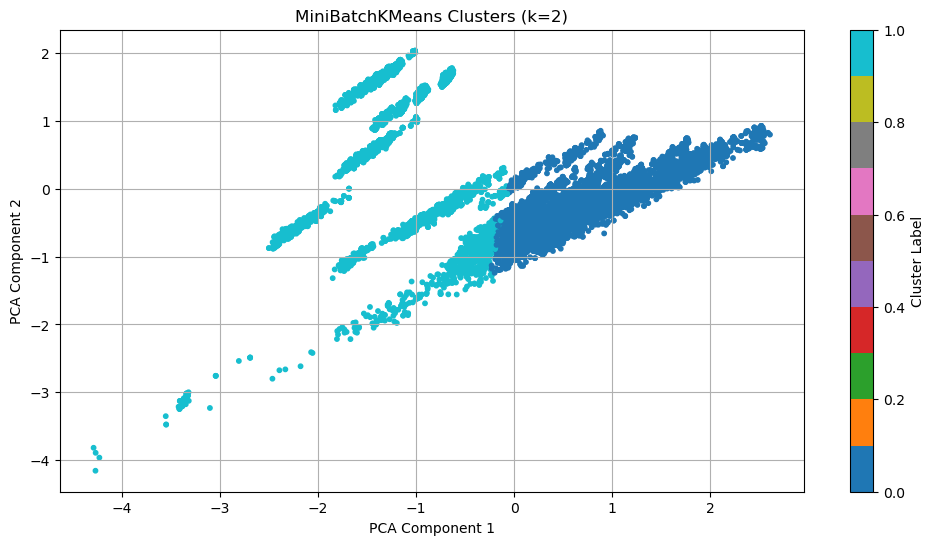

In [93]:
from sklearn.decomposition import PCA

# Reduce to 2D with PCA
pca = PCA(n_components=2)
X_2d_user = pca.fit_transform(X_sample2_scaled)

# Fit MiniBatchKMeans with optimal number of clusters (e.g., k=4)
optimal_k = 2  
kmeans = MiniBatchKMeans(n_clusters=optimal_k, random_state=42, batch_size=10000)
labels_kmeans = kmeans.fit_predict(X_sample2_scaled)

# Plot the clusters
plt.figure(figsize=(12, 6))
scatter = plt.scatter(X_2d_user[:, 0], X_2d_user[:, 1], c=labels_kmeans, cmap='tab10', s=10)
plt.title(f'MiniBatchKMeans Clusters (k={optimal_k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()

#### MiniBatchKmeans (Clusters = 2): Sihoutte score = 0.19

The PCA plot showing overlapping clusters further supports this conclusion. PCA, while reducing the data to 2D, may not always reveal perfect separability, but in this case, the overlapping nature of the clusters confirms that the clusters are not clearly distinguishable in the lower-dimensional space. A Silhouette Score of 0.19 for MiniBatchKMeans with 2 clusters indicates that the clustering results are not well-formed. A low Silhouette score means that the samples within each cluster are not very close to one another, and the clusters themselves are not well-separated. In addition, the PCA visualization showing two overlapping clusters further supports this observation — it suggests that the clusters are not clearly distinguishable in the reduced 2D space.

#### Adding the labels to the dataframe

In [95]:
X_sample2['MiniBatchKMeans_cluster'] = labels_kmeans
X_sample2.head()

,userId,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_user,count_rating_user,rating_transformed,MiniBatchKMeans_cluster
15795,1741,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,3.300090,2211,26.573838,1
860,1741,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3.300090,2211,3.153599,1
76820,58612,0,1,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,3.622409,5886,17.304234,1
54886,132914,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,4.219512,410,21.664115,0
6265,123297,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,4.171951,1640,13.478381,0


# 2. KMeans Clustering

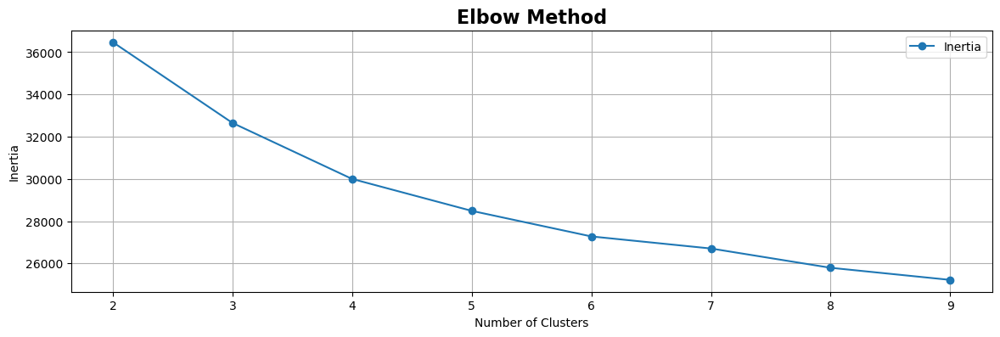

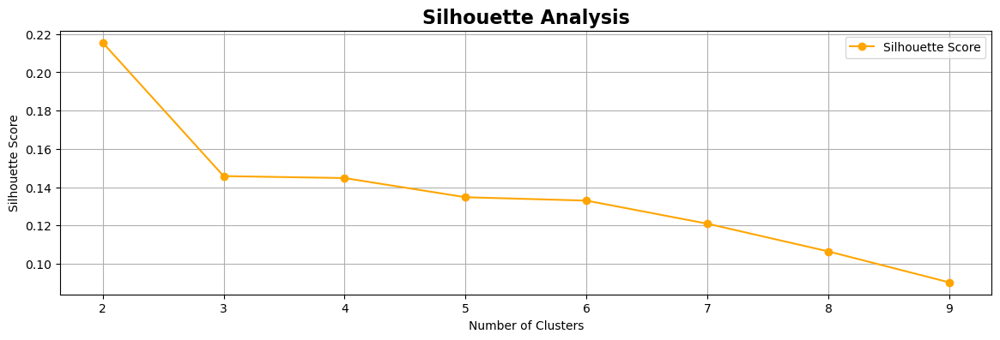

In [97]:
from sklearn.metrics import silhouette_score

inertia_values = []
silhouette_scores = []

# different numbers of clusters
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42).fit(X_sample2_scaled)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_sample2_scaled, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

# Plot the Silhouette Scores
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

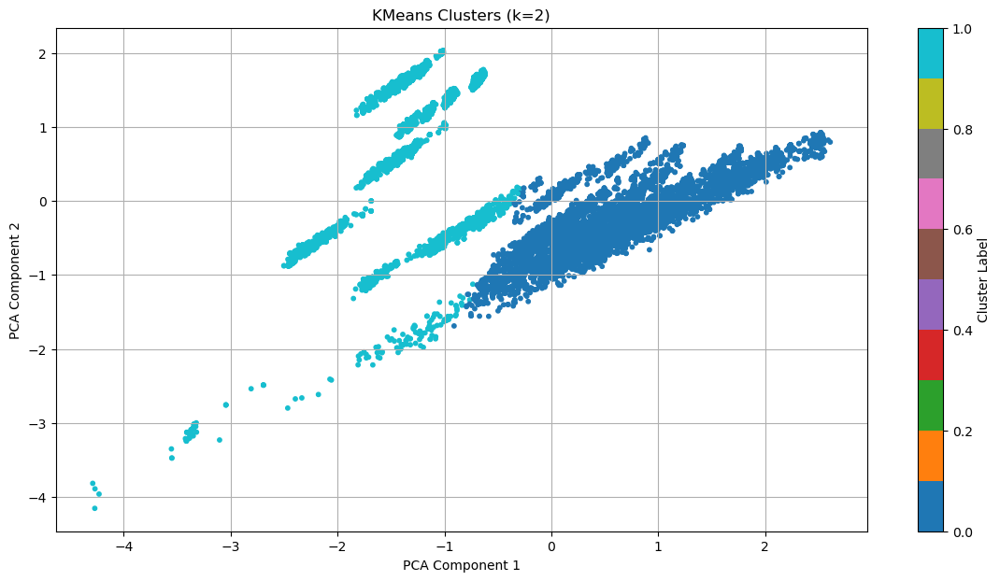

In [98]:
from sklearn.decomposition import PCA


# Reduce to 2D with PCA
pca = PCA(n_components=2)
X_2d = pca.fit_transform(X_sample2_scaled)

optimal_k = 2  
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
labels_kmeans = kmeans.fit_predict(X_sample2_scaled)

# Plot the clusters
plt.figure(figsize=(14, 7))
scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_kmeans, cmap='tab10', s=10)
plt.title(f'KMeans Clusters (k={optimal_k})')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, label='Cluster Label')
plt.grid(True)
plt.show()

In [99]:
X_sample2['KMeans_cluster'] = labels_kmeans

KMeans clustering (clusters=2) Silhoutte score: 0.22

The KMeans has performed slightly better than the MiniBatchKMeans. The silhoutte score is 0.22 app. for 2 clusters. But the PCA plot shows clearly that the clusters are overlapping. The model strugges to separate the clusters. KMeans (even with a higher silhouette score of ~0.22) is still struggling to find well-separated clusters, as evidenced by overlapping clusters in the PCA plot, Low silhouette score and the lack of intra-cluster similarity and inter-cluster separability. This suggests that the data may not have a natural globular cluster structure, which is what KMeans inherently assumes. 

# 3. DBSCAN

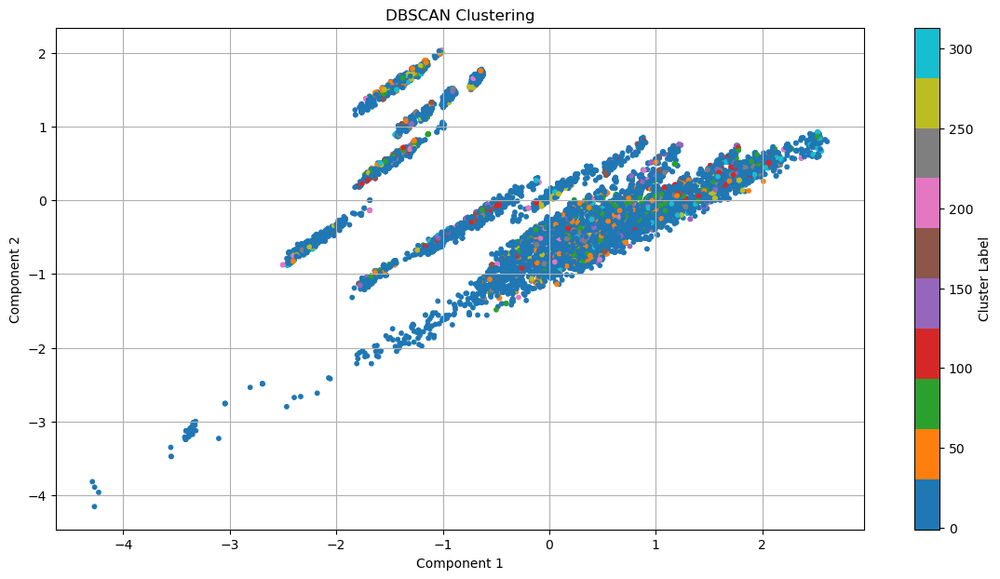

Estimated clusters: 314
Noise points: 5775
Silhouette Score for DBSCAN: -0.1622


In [102]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan.fit(X_sample2_scaled)

# Correct label variable
labels_dbscan = dbscan.labels_

plt.figure(figsize=(14, 7))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_dbscan, cmap='tab10', s=10)
plt.title('DBSCAN Clustering')
plt.colorbar(label='Cluster Label')

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.grid(True)
plt.show()

n_clusters = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_noise = list(labels_dbscan).count(-1)
print(f"Estimated clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

# Silhouette Score (skip if all points are noise or only 1 cluster)
if n_clusters > 1:
    silhouette_avg = silhouette_score(X_sample2_scaled, labels_dbscan)
    print(f"Silhouette Score for DBSCAN: {silhouette_avg:.4f}")
else:
    print("Silhouette Score not defined for less than 2 clusters.")

##### Results: Estimated clusters: 314, Noise points: 5775, Silhouette Score for DBSCAN: -0.1622

Estimated clusters: 314. This is quite a large number, suggesting that DBSCAN is identifying many small, dense regions as separate clusters.

Noise points: 5775. Out of 10,000 data points, over 57% are labeled as noise (label = -1). That’s a very high proportion, which could mean:

eps=0.5 is too small → not enough points are close to each other or the data has a lot of variance and isn’t well-suited to density-based clustering without tuning.

#### Silhouette Score: -0.1622
A negative score indicates poor clustering — samples may be assigned to the wrong clusters or overlap significantly. This aligns with the high number of noise points and possibly meaningless clusters.

#### Tune Parameters:

Algorithm: auto | eps: 0.3 | Clusters: 282 | Noise: 7830 | Silhouette: -0.2704
Algorithm: auto | eps: 0.5 | Clusters: 314 | Noise: 5775 | Silhouette: -0.1622
Algorithm: auto | eps: 0.7 | Clusters: 302 | Noise: 4271 | Silhouette: -0.0951
Algorithm: auto | eps: 1.0 | Clusters: 119 | Noise: 1995 | Silhouette: -0.2225
Algorithm: auto | eps: 1.5 | Clusters: 7 | Noise: 69 | Silhouette: -0.0139
Algorithm: auto | eps: 2.0 | Clusters: 1 | Noise: 9 | Silhouette: N/A
Algorithm: ball_tree | eps: 0.3 | Clusters: 282 | Noise: 7830 | Silhouette: -0.2704
Algorithm: ball_tree | eps: 0.5 | Clusters: 314 | Noise: 5775 | Silhouette: -0.1622
Algorithm: ball_tree | eps: 0.7 | Clusters: 302 | Noise: 4271 | Silhouette: -0.0951
Algorithm: ball_tree | eps: 1.0 | Clusters: 107 | Noise: 1858 | Silhouette: -0.2113
Algorithm: ball_tree | eps: 1.5 | Clusters: 7 | Noise: 69 | Silhouette: -0.0139
Algorithm: ball_tree | eps: 2.0 | Clusters: 1 | Noise: 9 | Silhouette: N/A
Algorithm: kd_tree | eps: 0.3 | Clusters: 282 | 

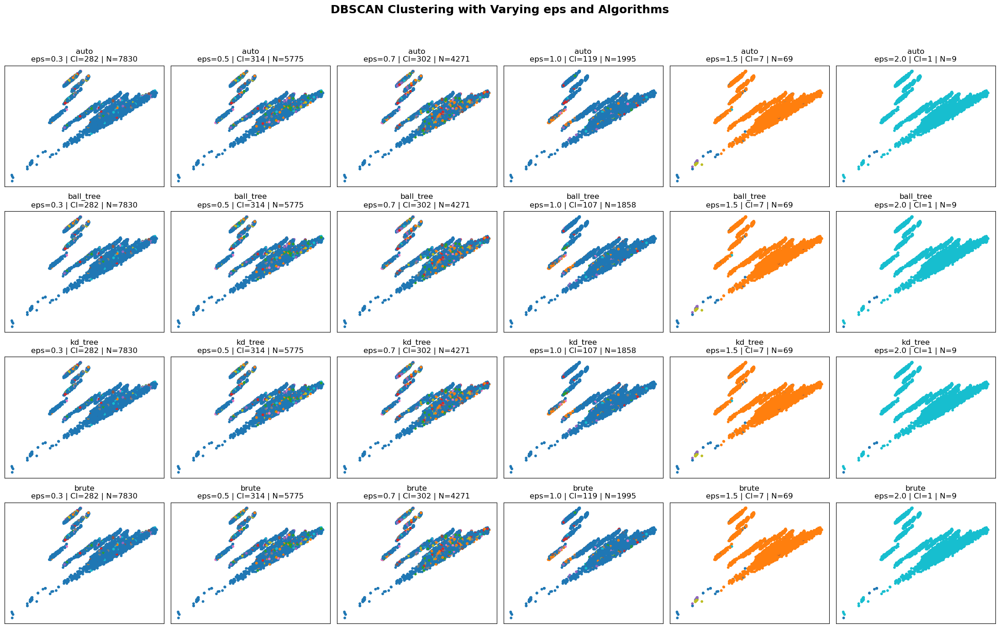

In [104]:
eps_values = [0.3, 0.5, 0.7, 1.0, 1.5, 2.0]
algorithms = ['auto', 'ball_tree', 'kd_tree', 'brute']
min_samples = 5

results = []

fig, axes = plt.subplots(len(algorithms), len(eps_values), figsize=(22, 14))
axes = axes.flatten()
plot_idx = 0

for algo in algorithms:
    for eps in eps_values:
        db = DBSCAN(eps=eps, min_samples=min_samples, algorithm=algo)
        labels_dbscan = db.fit_predict(X_sample2_scaled)
        
        n_clusters = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
        n_noise = list(labels_dbscan).count(-1)

        # Silhouette Score (only if more than 1 cluster)
        score = silhouette_score(X_sample2_scaled, labels_dbscan) if n_clusters > 1 else None

        results.append({
            'algorithm': algo,
            'eps': eps,
            'clusters': n_clusters,
            'noise': n_noise,
            'silhouette': score
        })

        print(
            f"Algorithm: {algo} | eps: {eps:.1f} | Clusters: {n_clusters} | "
            f"Noise: {n_noise} | Silhouette: {score:.4f}" if score is not None else
            f"Algorithm: {algo} | eps: {eps:.1f} | Clusters: {n_clusters} | "
            f"Noise: {n_noise} | Silhouette: N/A"
        )

        ax = axes[plot_idx]
        scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_dbscan, cmap='tab10', s=10)
        ax.set_title(f"{algo}\neps={eps} | Cl={n_clusters} | N={n_noise}")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(True)
        plot_idx += 1

plt.suptitle("DBSCAN Clustering with Varying eps and Algorithms", fontsize=18, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Analysis of DBSCAN Tuning Results
DBSCAN was tested with various eps values and different algorithm types (auto, ball_tree, kd_tree, and brute). 

##### Low Silhouette Scores (Negative Values):
The Silhouette Score for all configurations remains negative, indicating that the clusters are not well-separated or meaningful. Negative scores imply poor clustering results, suggesting that the data points may be poorly assigned to clusters or the clusters themselves are not well-formed. Even though different eps values were tested, none of them produced a positive Silhouette score, showing that the underlying structure of the data might not be well suited to DBSCAN with the current parameters.

##### Clusters and Noise Points:
Higher eps values (e.g., 1.0, 1.5, 2.0) lead to fewer clusters and more noise points. For eps = 1.5, only 7 clusters are formed, with 69 noise points.
For eps = 2.0, only 1 cluster is formed, with 9 noise points, which means the entire dataset is essentially treated as a single cluster. This suggests that the algorithm is not able to identify meaningful subgroups within the data as eps increases. Lower eps values (e.g., 0.3, 0.5, 0.7) tend to identify more clusters but with a larger number of noise points, which indicates that DBSCAN might not be able to detect dense enough regions for forming larger, more coherent clusters.

##### Comparison of Algorithms:

The performance is similar across all the algorithms (auto, ball_tree, kd_tree, and brute). The number of clusters, noise points, and Silhouette scores are consistent for all algorithm types, indicating that the choice of algorithm for finding nearest neighbors does not significantly affect the clustering results in this case.

### Conclusion:
Negative Silhouette Scores indicate poor clustering performance, regardless of the eps value or algorithm used. The data structure might not be suitable for DBSCAN with the parameters tested, or the density distribution of the data does not match the assumptions made by DBSCAN (i.e., that the data contains distinct regions of high density).

# Next Step. 5. OPTICS Clustering

OPTICS estimated clusters: 1
Noise points: 8
Silhouette Score: N/A (only one cluster)


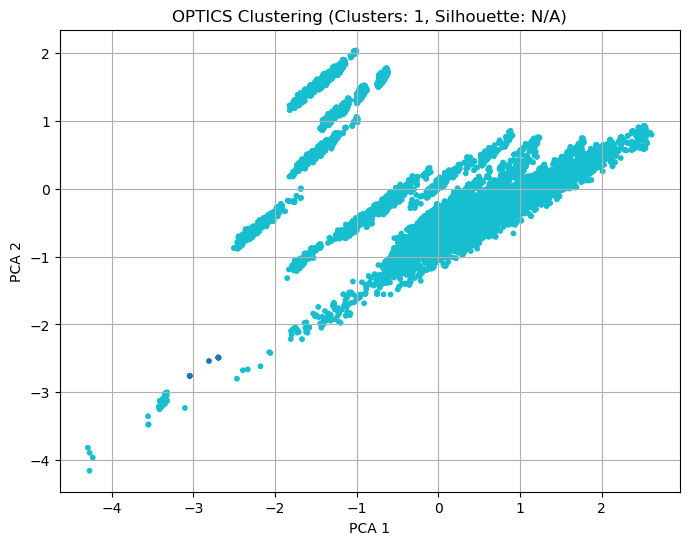

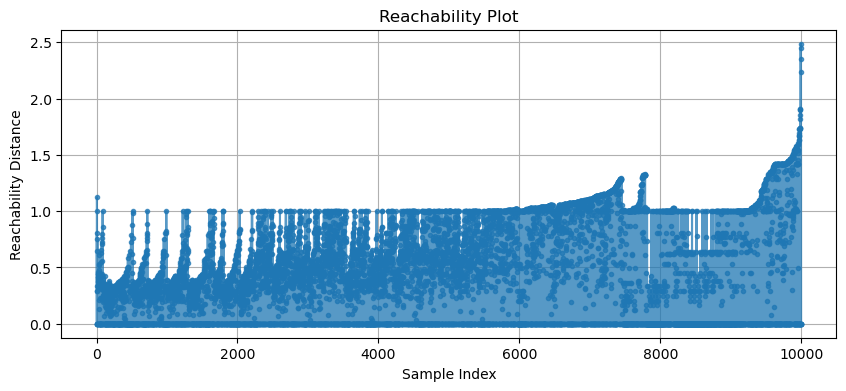

In [106]:
from sklearn.cluster import OPTICS

optics_model = OPTICS(min_samples=2, xi=0.05, min_cluster_size=0.05)
labels_optics = optics_model.fit_predict(X_sample2_scaled)

# Number of clusters (excluding noise)
n_clusters_optics = len(set(labels_optics)) - (1 if -1 in labels_optics else 0)
n_noise_optics = list(labels_optics).count(-1)

print(f"OPTICS estimated clusters: {n_clusters_optics}")
print(f"Noise points: {n_noise_optics}")

# Silhouette Score
if n_clusters_optics > 1:
    silhouette_optics = silhouette_score(X_sample2_scaled, labels_optics)
    print(f"Silhouette Score: {silhouette_optics:.4f}")
else:
    silhouette_optics = None
    print("Silhouette Score: N/A (only one cluster)")
    
# PCA Visualization
plt.figure(figsize=(8, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_optics, cmap='tab10', s=10)
title = f"OPTICS Clustering (Clusters: {n_clusters_optics}, Silhouette: {silhouette_optics:.2f})" \
    if silhouette_optics is not None else \
    f"OPTICS Clustering (Clusters: {n_clusters_optics}, Silhouette: N/A)"

plt.title(title)
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)
plt.show()

# Reachability Plot
plt.figure(figsize=(10, 4))
space = np.arange(len(X_sample2_scaled))
reachability = optics_model.reachability_[optics_model.ordering_]
plt.plot(space, reachability, marker='.', alpha=0.75)
plt.title('Reachability Plot')
plt.xlabel('Sample Index')
plt.ylabel('Reachability Distance')
plt.grid(True)
plt.show()

### Conclusion:
Estimated clusters: 1
This means OPTICS found only a single dense region, treating the rest (8 points) as noise. So, effectively, all data is in one cluster. Out of the  10,000 samples, only 8 were marked as noise, which is negligible (~0.08%). OPTICS has grouped the entire dataset into one cluster suggests that the data does not exhibit natural dense subgroups that OPTICS can detect. OPTICS is a density-based clustering algorithm similar to DBSCAN, but it doesn't require the definition of a specific eps parameter. Instead, it relies on a reachability distance to identify clusters. In this case, the data might be too sparse, or the density may not vary enough across the dataset to form multiple, distinct clusters.
### Next step: OPTICS Parameter tuning
This will allow OPTICS to be more sensitive to subtle density changes and potentially find multiple clusters.

In [108]:
from sklearn.cluster import OPTICS
from sklearn.metrics import silhouette_score
import numpy as np

min_samples_values = [3, 5]
xi_values = [0.03, 0.05]
min_cluster_sizes = [0.02, 0.05]
metrics = ['euclidean', 'manhattan']
algorithms = ['auto', 'ball_tree']

results = []

for min_samples in min_samples_values:
    for xi in xi_values:
        for min_cluster_size in min_cluster_sizes:
            for metric in metrics:
                for algo in algorithms:
                    optics = OPTICS(
                        min_samples=min_samples,
                        xi=xi,
                        min_cluster_size=min_cluster_size,
                        metric=metric,
                        algorithm=algo,
                        cluster_method='xi'  # keep this consistent
                    )
                    labels = optics.fit_predict(X_sample2_scaled)

                    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
                    n_noise = list(labels).count(-1)

                    sil_score = (
                        silhouette_score(X_sample2_scaled, labels)
                        if n_clusters > 1 else np.nan
                    )

                    results.append((
                        min_samples, xi, min_cluster_size, metric, algo,
                        n_clusters, n_noise, sil_score
                    ))

                    print(f"min_samples={min_samples} | xi={xi:.2f} | min_cluster_size={min_cluster_size:.2f} | "
                          f"metric={metric} | algo={algo} | Clusters={n_clusters} | Noise={n_noise} | "
                          f"Silhouette={sil_score:.4f}" if not np.isnan(sil_score) else
                          f"min_samples={min_samples} | xi={xi:.2f} | min_cluster_size={min_cluster_size:.2f} | "
                          f"metric={metric} | algo={algo} | Clusters={n_clusters} | Noise={n_noise} | Silhouette=N/A")

min_samples=3 | xi=0.03 | min_cluster_size=0.02 | metric=euclidean | algo=auto | Clusters=8 | Noise=6772 | Silhouette=-0.0870
min_samples=3 | xi=0.03 | min_cluster_size=0.02 | metric=euclidean | algo=ball_tree | Clusters=8 | Noise=6774 | Silhouette=-0.0871
min_samples=3 | xi=0.03 | min_cluster_size=0.02 | metric=manhattan | algo=auto | Clusters=9 | Noise=7372 | Silhouette=-0.1393
min_samples=3 | xi=0.03 | min_cluster_size=0.02 | metric=manhattan | algo=ball_tree | Clusters=9 | Noise=7372 | Silhouette=-0.1393
min_samples=3 | xi=0.03 | min_cluster_size=0.05 | metric=euclidean | algo=auto | Clusters=1 | Noise=8359 | Silhouette=N/A
min_samples=3 | xi=0.03 | min_cluster_size=0.05 | metric=euclidean | algo=ball_tree | Clusters=1 | Noise=8359 | Silhouette=N/A
min_samples=3 | xi=0.03 | min_cluster_size=0.05 | metric=manhattan | algo=auto | Clusters=2 | Noise=8999 | Silhouette=0.1012
min_samples=3 | xi=0.03 | min_cluster_size=0.05 | metric=manhattan | algo=ball_tree | Clusters=2 | Noise=8999 | 

### Conclusion
Most Silhouette scores are negative, indicating poor clustering structure or overlapping clusters. Many configurations resulted in only 1 cluster or mostly noise, which prevents silhouette calculation. Noise levels are very high in most configurations (often over 7000 points classified as noise out of ~9000). The reason could be possible be the dataset has no clear density-based structure, or OPTICS hyperparameters require significant tuning beyond the tested range. Clusters identified are few, with high noise and poor silhouette. The results indicate that the clustering is not producing well-separated, meaningful clusters. Negative Silhouette scores and a high number of noise points suggest that the data may not have clear, dense clusters, or the current clustering method may not be well-suited to the dataset. Further parameter tuning, alternative algorithms, or adjustments to the feature set might improve clustering performance. OPTICS is not well-suited for this dataset under the tested hyperparameters

In [110]:
X = transformations_df.drop(columns=["movieId", "userId", "title", "genres", "rating", "rating_timestamp", "tag", "tag_timestamp", 'mean_rating_movie', 'count_rating_movie'])

In [111]:
X.columns

Index(['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime',
       'Documentary', 'Drama', 'Fantasy', 'Film_Noir', 'Horror', 'IMAX',
       'Musical', 'Mystery', 'Romance', 'Sci_Fi', 'Thriller', 'War', 'Western',
       'mean_rating_user', 'count_rating_user', 'rating_transformed'],
      dtype='object')

In [112]:
scaling = RobustScaler()
X_sample2_scaled = scaling.fit_transform(X_sample2)

# 7. Agglomerative Clustering

Silhouette Score for Agglomerative Clustering (n=2, linkage='ward'): 0.2516


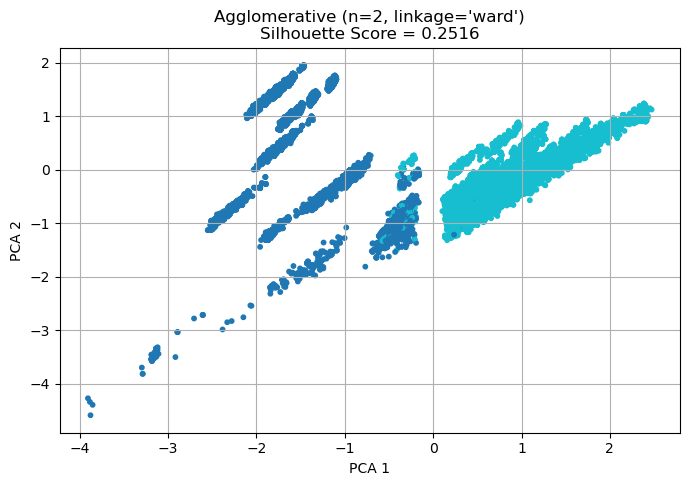

Silhouette Score for Agglomerative Clustering (n=2, linkage='average'): 0.4279


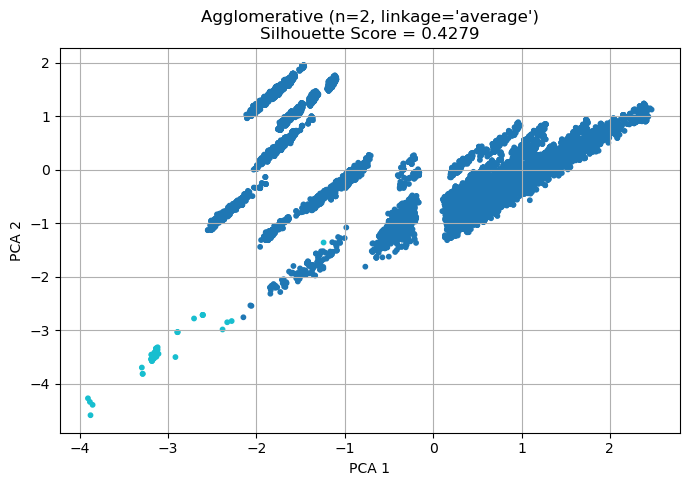

Silhouette Score for Agglomerative Clustering (n=2, linkage='complete'): 0.4336


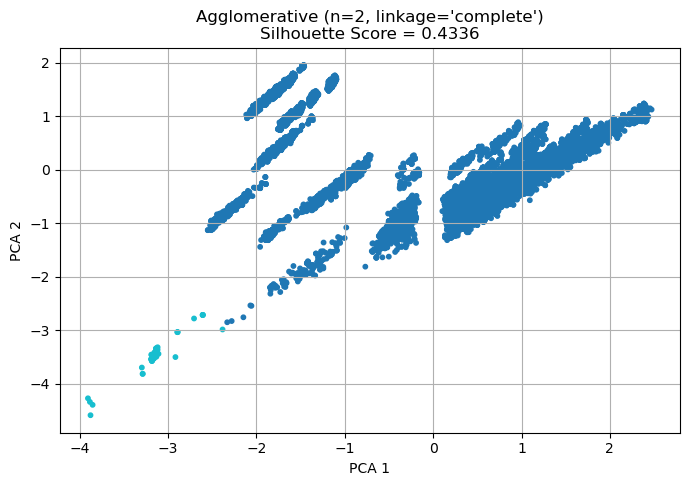

Silhouette Score for Agglomerative Clustering (n=2, linkage='single'): 0.4326


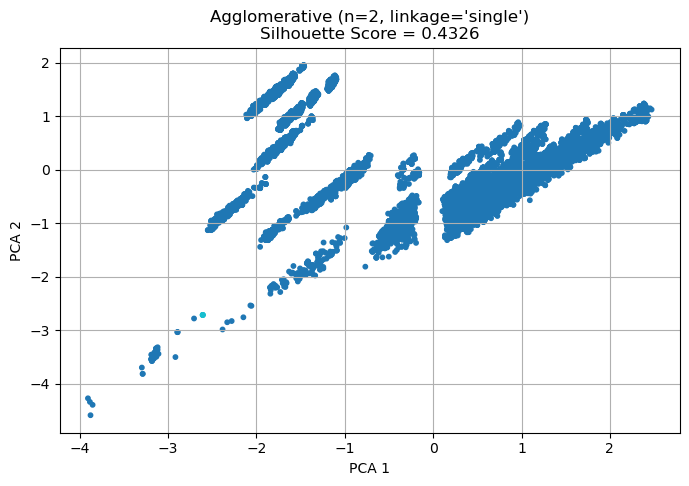

Silhouette Score for Agglomerative Clustering (n=3, linkage='ward'): 0.2378


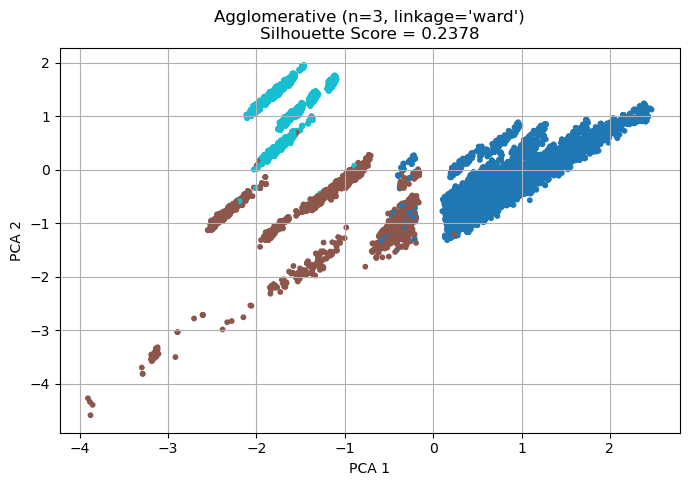

Silhouette Score for Agglomerative Clustering (n=3, linkage='average'): 0.2453


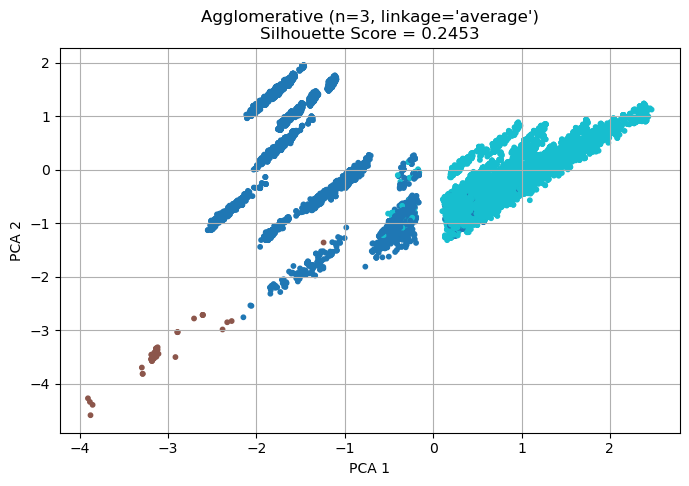

Silhouette Score for Agglomerative Clustering (n=3, linkage='complete'): 0.2259


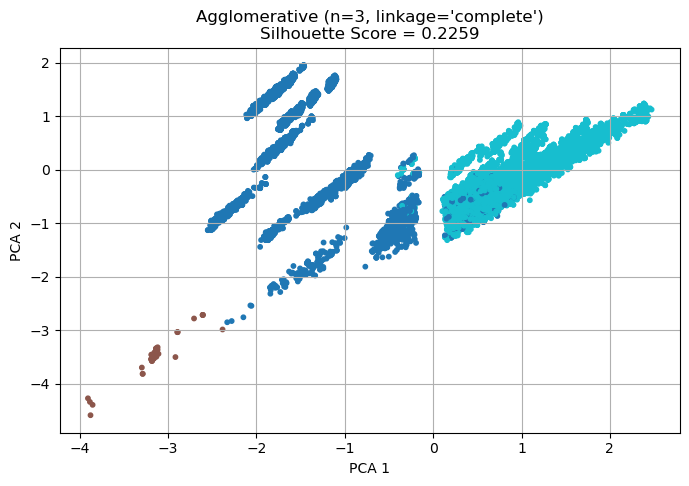

Silhouette Score for Agglomerative Clustering (n=3, linkage='single'): 0.4238


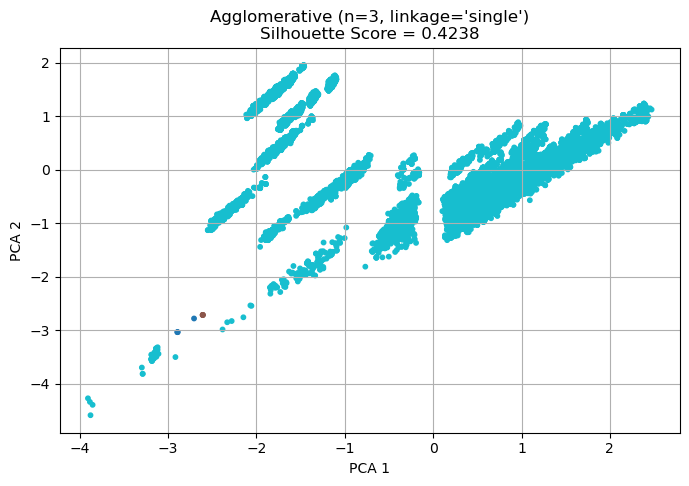

Silhouette Score for Agglomerative Clustering (n=4, linkage='ward'): 0.1204


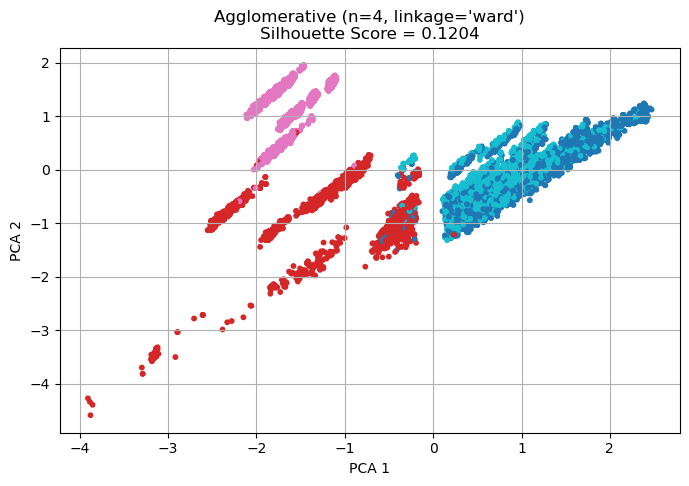

Silhouette Score for Agglomerative Clustering (n=4, linkage='average'): 0.2249


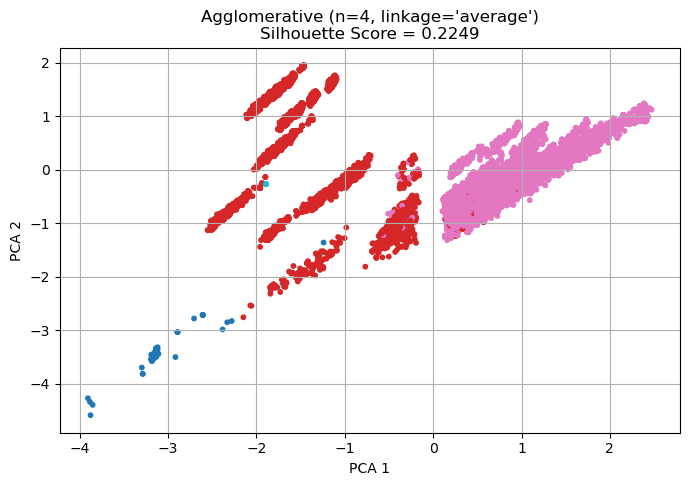

Silhouette Score for Agglomerative Clustering (n=4, linkage='complete'): 0.1869


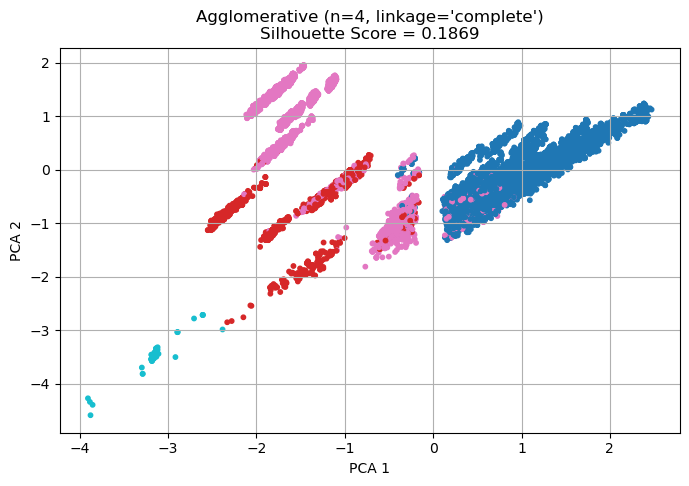

Silhouette Score for Agglomerative Clustering (n=4, linkage='single'): 0.4074


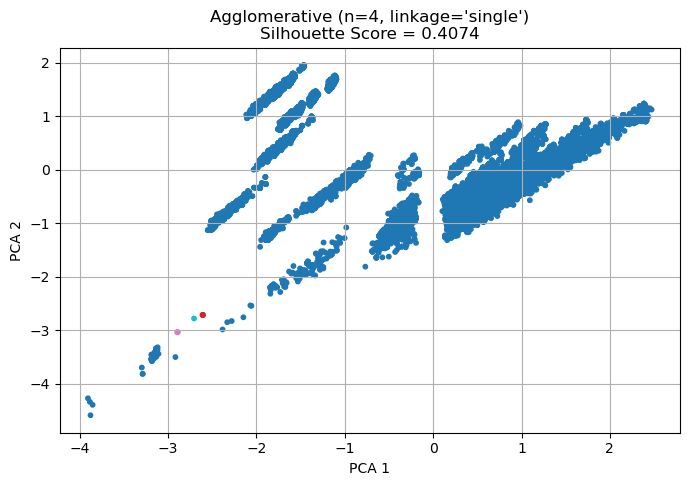

Silhouette Score for Agglomerative Clustering (n=5, linkage='ward'): 0.1155


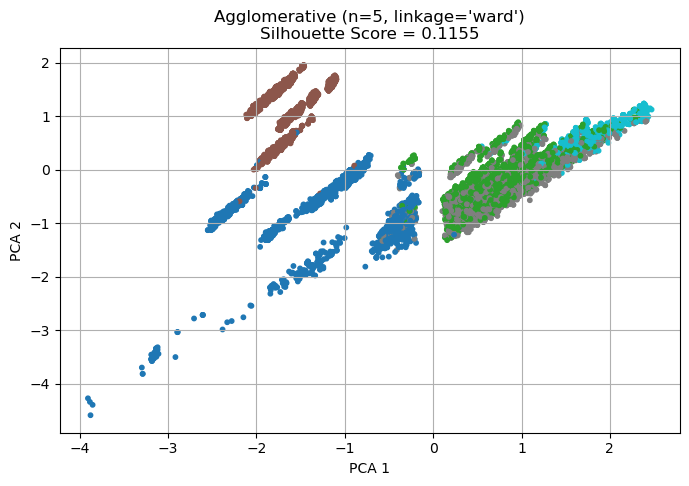

Silhouette Score for Agglomerative Clustering (n=5, linkage='average'): 0.2244


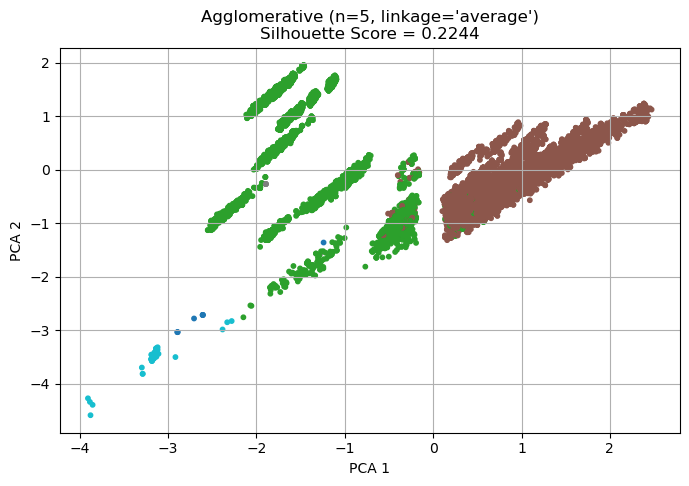

Silhouette Score for Agglomerative Clustering (n=5, linkage='complete'): 0.0939


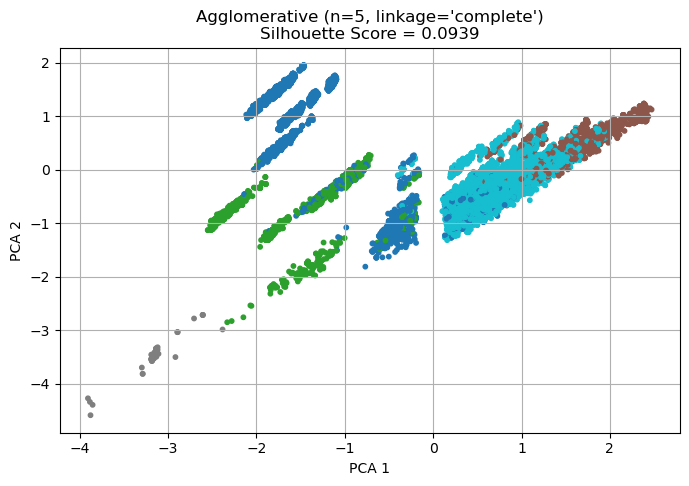

Silhouette Score for Agglomerative Clustering (n=5, linkage='single'): 0.4074


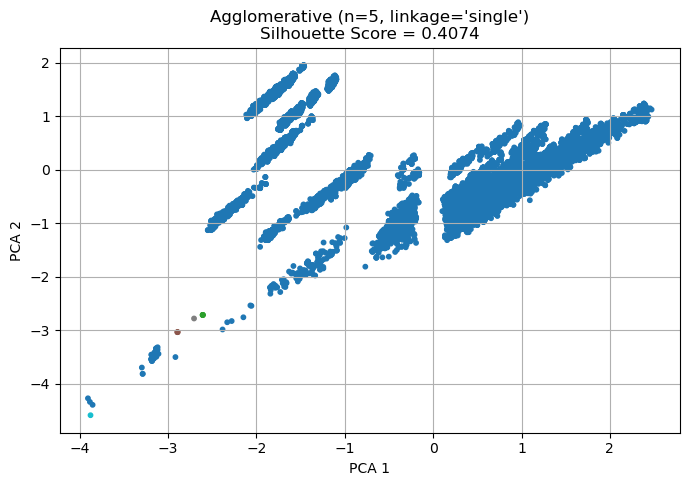

Silhouette Score for Agglomerative Clustering (n=6, linkage='ward'): 0.1154


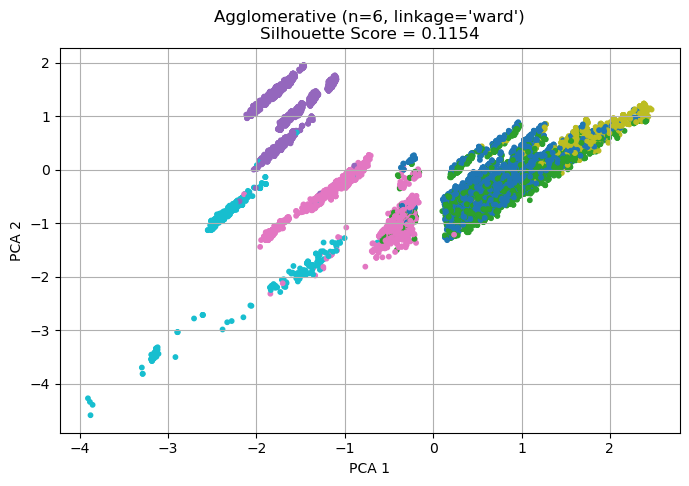

Silhouette Score for Agglomerative Clustering (n=6, linkage='average'): 0.2198


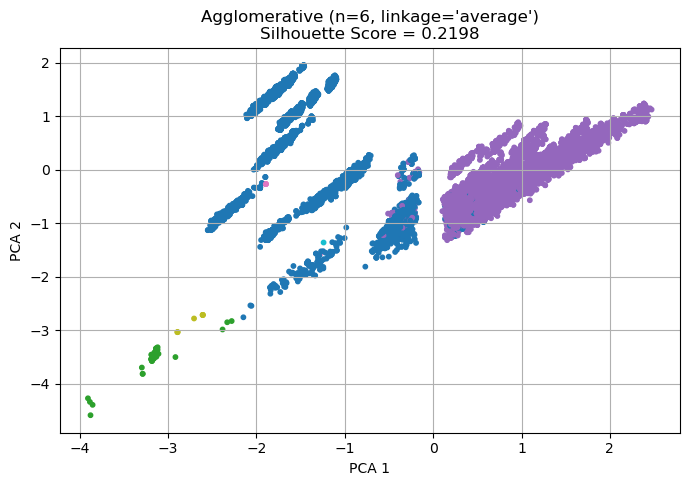

Silhouette Score for Agglomerative Clustering (n=6, linkage='complete'): 0.1081


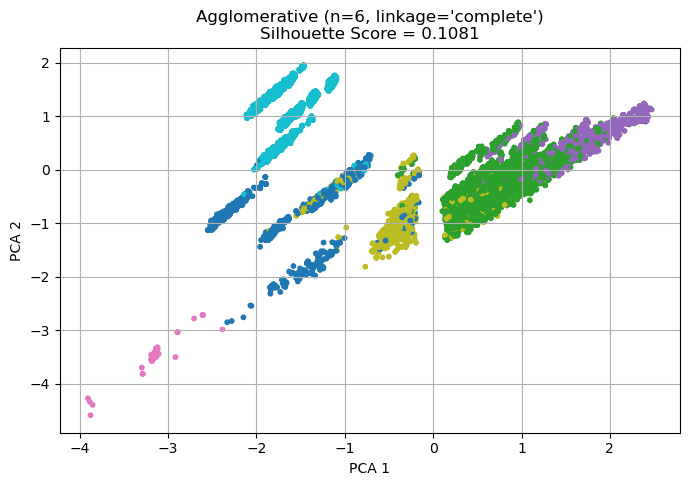

Silhouette Score for Agglomerative Clustering (n=6, linkage='single'): 0.2302


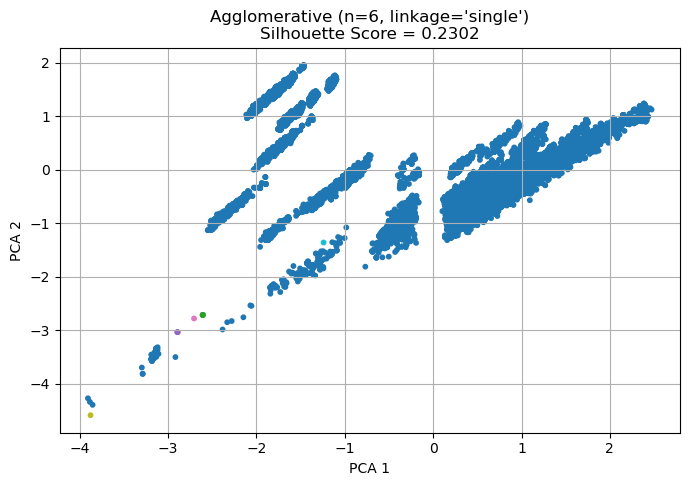

Silhouette Score for Agglomerative Clustering (n=7, linkage='ward'): 0.1115


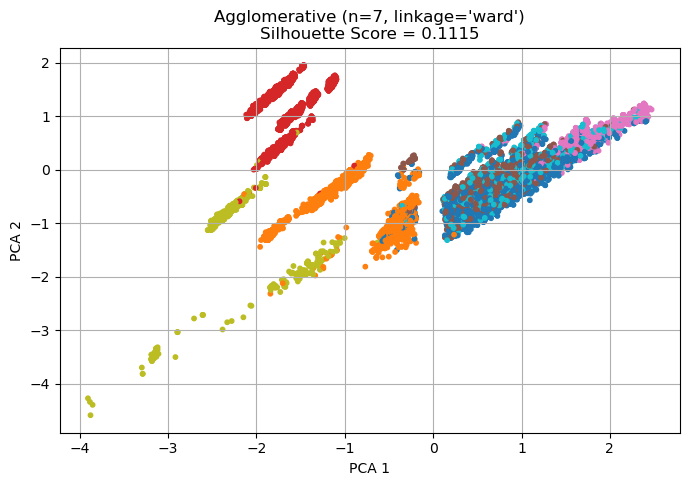

Silhouette Score for Agglomerative Clustering (n=7, linkage='average'): 0.2180


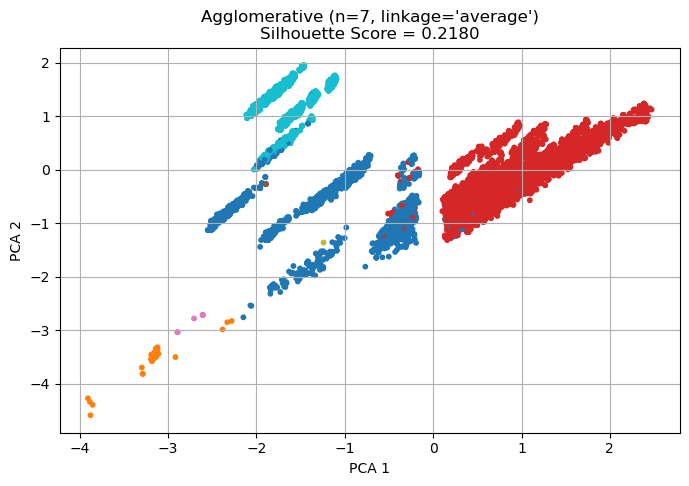

Silhouette Score for Agglomerative Clustering (n=7, linkage='complete'): 0.1010


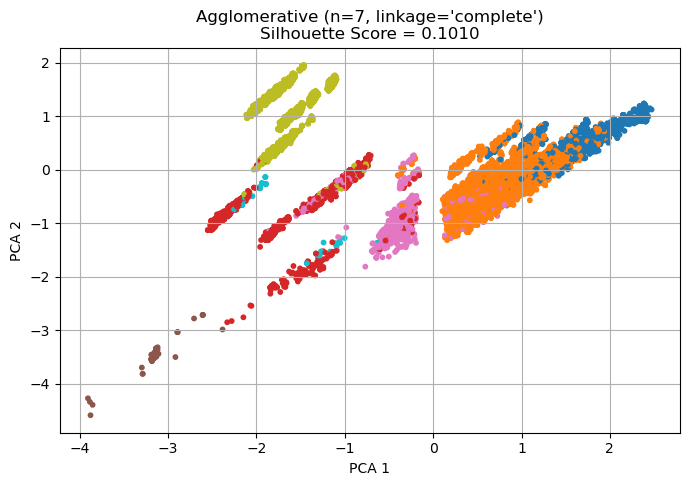

Silhouette Score for Agglomerative Clustering (n=7, linkage='single'): 0.1789


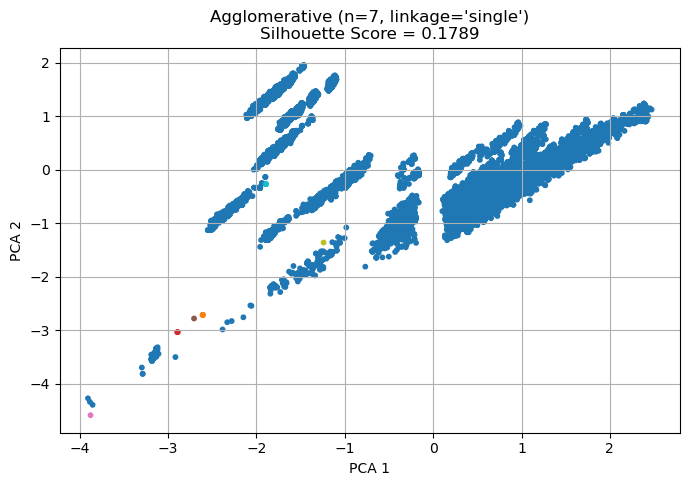

In [114]:
# PCA for visualization
X_2d = PCA(n_components=2).fit_transform(X_sample2_scaled)

clusters = np.arange(2, 8)
linkages = ["ward", "average", "complete", "single"]

for cluster in clusters:
    for link in linkages:
        # Fit model
        agglo = AgglomerativeClustering(n_clusters=cluster, linkage=link)
        labels_agglo = agglo.fit_predict(X_sample2_scaled)

        # Silhouette score
        sil_score = silhouette_score(X_sample2_scaled, labels_agglo)

        print(f"Silhouette Score for Agglomerative Clustering (n={cluster}, linkage='{link}'): {sil_score:.4f}")

        # Plot
        plt.figure(figsize=(8, 5))
        plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels_agglo, cmap='tab10', s=10)
        plt.title(f"Agglomerative (n={cluster}, linkage='{link}')\nSilhouette Score = {sil_score:.4f}")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.grid(True)
        plt.show()


### Conclusion
The algorithm 'single' has shown better scores compared to the other algorithms, when n is smaller (2,3,4,5), but after that it decreases gradually.

Silhouette Score for Agglomerative Clustering (n=2, linkage='average'): 0.4279
Silhouette Score for Agglomerative Clustering (n=2, linkage='complete'): 0.4336
Silhouette Score for Agglomerative Clustering (n=2, linkage='single'): 0.4326

Based on the silhouette score analysis for Agglomerative Clustering with different numbers of clusters (n=2 to 7) and linkage methods (ward, average, complete, single), ward linkage is less suitable for this dataset. complete, average, and single linkage methods gave consistently higher silhouette scores than ward across most cluster counts. single linkage performs well for n=2–5, but silhouette scores degrade with more clusters — suggesting overfragmentation. Overall the model performs better with average, complete, single, when the n_clusters are 2, but more than that, the performances decreases. Still the silhoutte score shows that the model struggles in findinging the similiarity within the cluster and differentiate it from other clusters. The overlapping clusters can be seen in the plots. The nature of the data by itself if hard to be separated as the movies overlap one category over the other. The best sihoutte score in this model is 0.4326 with the parameter (n=2, linkage='single') and 0.4336 with the parameters (n=2, linkage='complete')

# Next step

# 8. HDBSCAN Clustering


Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=generic
Number of clusters (excluding noise): 488
Silhouette Score: 0.2658

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=prims_kdtree
Number of clusters (excluding noise): 413
Silhouette Score: 0.3673

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=prims_balltree
Number of clusters (excluding noise): 413
Silhouette Score: 0.3673

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=boruvka_kdtree
Number of clusters (excluding noise): 416
Silhouette Score: 0.3809

Running HDBSCAN with min_cluster_size=5, min_samples=None, algorithm=boruvka_balltree
Number of clusters (excluding noise): 420
Silhouette Score: 0.3797

Running HDBSCAN with min_cluster_size=5, min_samples=5, algorithm=generic
Number of clusters (excluding noise): 488
Silhouette Score: 0.2658

Running HDBSCAN with min_cluster_size=5, min_samples=5, algorithm=prims_kdtree
Number of clusters (exclu

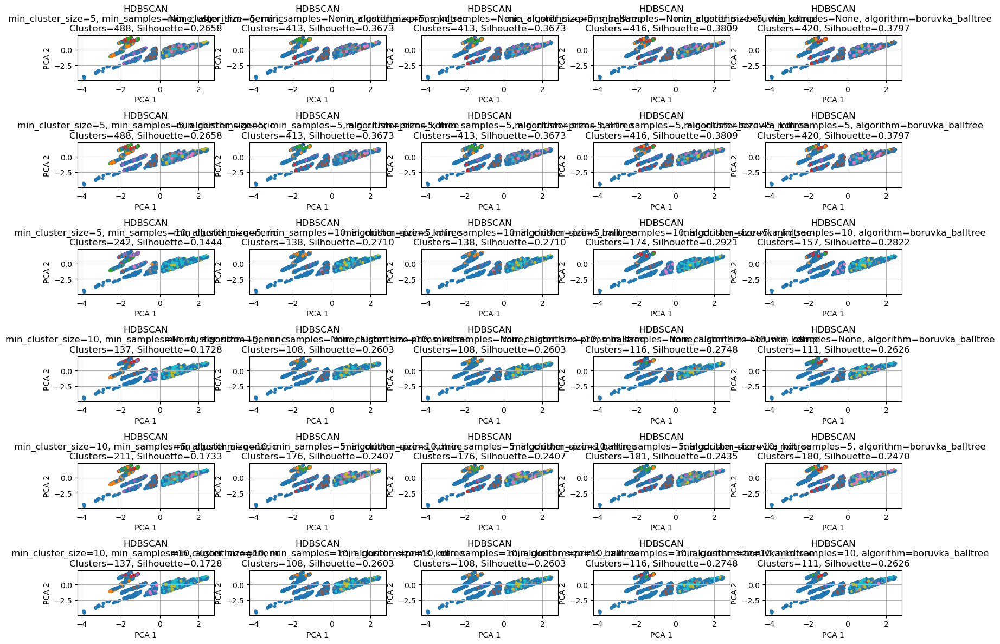

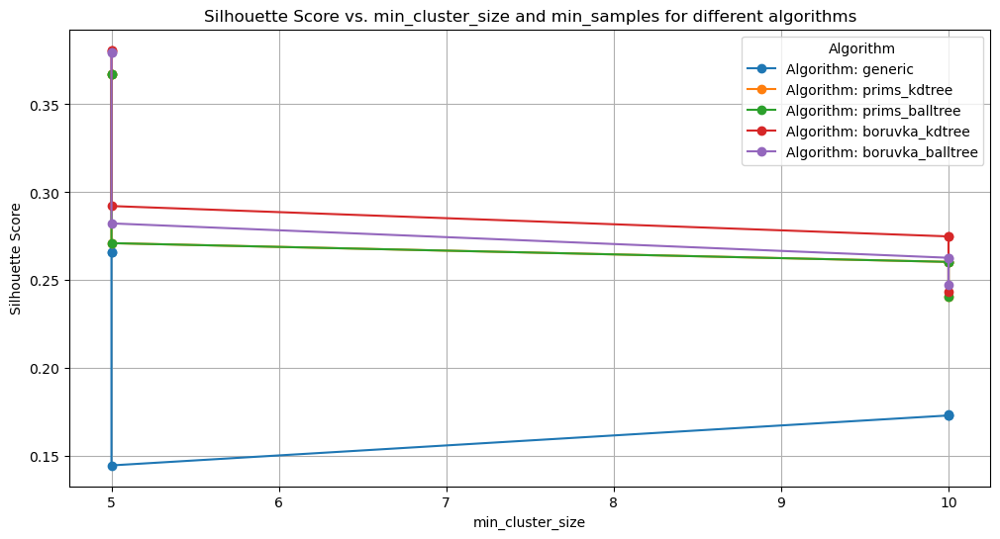

In [117]:
# Example parameter values
min_cluster_sizes = [5, 10]
min_samples_values = [None, 5, 10]  # You can also test specific values like 5, 10
algorithms = ['generic', 'prims_kdtree', 'prims_balltree', 'boruvka_kdtree', 'boruvka_balltree']

sil_scores = []  # To store Silhouette Scores for each combination

# Create a figure to display all results
plt.figure(figsize=(16, 12))

for i, mcs in enumerate(min_cluster_sizes):
    for j, ms in enumerate(min_samples_values):
        for algorithm in algorithms:
            print(f"\nRunning HDBSCAN with min_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}")
            
            # Fit HDBSCAN with the selected algorithm, min_cluster_size, and min_samples
            clusterer = hdbscan.HDBSCAN(min_cluster_size=mcs, min_samples=ms, algorithm=algorithm)
            labels = clusterer.fit_predict(X_sample2_scaled)
            
            # Compute the number of clusters (excluding noise)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            print(f"Number of clusters (excluding noise): {n_clusters}")
            
            if n_clusters < 2:
                print("Not enough clusters for silhouette score.")
                continue

            # Calculate silhouette score (excluding noise)
            mask = labels != -1  # Exclude noise points labeled as -1
            sil_score = silhouette_score(X_sample2_scaled[mask], labels[mask])
            sil_scores.append((mcs, ms, algorithm, sil_score))
            print(f"Silhouette Score: {sil_score:.4f}")

            # Visualize the clusters in 2D
            plt.subplot(len(min_cluster_sizes) * len(min_samples_values), len(algorithms), i * len(min_samples_values) * len(algorithms) + j * len(algorithms) + algorithms.index(algorithm) + 1)
            plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
            plt.title(f"HDBSCAN\nmin_cluster_size={mcs}, min_samples={ms}, algorithm={algorithm}\nClusters={n_clusters}, Silhouette={sil_score:.4f}")
            plt.xlabel("PCA 1")
            plt.ylabel("PCA 2")
            plt.grid(True)

# Display all cluster visualizations
plt.tight_layout()
plt.show()

# Plot Silhouette Scores vs min_cluster_size and min_samples for each algorithm
sil_scores = np.array(sil_scores)
plt.figure(figsize=(12, 6))

# Plot silhouette scores for each algorithm with respect to min_cluster_size and min_samples
for algorithm in algorithms:
    subset = sil_scores[sil_scores[:, 2] == algorithm]
    plt.plot(subset[:, 0], subset[:, 3], marker='o', label=f"Algorithm: {algorithm}")

plt.title('Silhouette Score vs. min_cluster_size and min_samples for different algorithms')
plt.xlabel('min_cluster_size')
plt.ylabel('Silhouette Score')
plt.legend(title="Algorithm")
plt.grid(True)
plt.show()

#### Conclusion
The analysis evaluated HDBSCAN using different combinations of: 

min_cluster_size = 5 and 10

min_samples = None, 5, and 10

Algorithms: 'generic', 'prims_kdtree', 'prims_balltree', 'boruvka_kdtree', 'boruvka_balltree'

#### Best Silhouette Scores:
The best silhouette score (0.3809) was achieved with: min_cluster_size = 5,  min_samples = 5 or None,  algorithm = 'boruvka_kdtree'. THe second best one is: min_cluster_size = 5, min_samples = 5 or none, clusters = 420 and silhoutte score is 0.38.

#### Effect of Parameters:

Increasing min_samples to 10 generally reduced silhouette scores. Larger min_cluster_size (10) also tended to result in fewer clusters and lower silhouette scores. Smaller min_cluster_size achieved better results for this experiment.

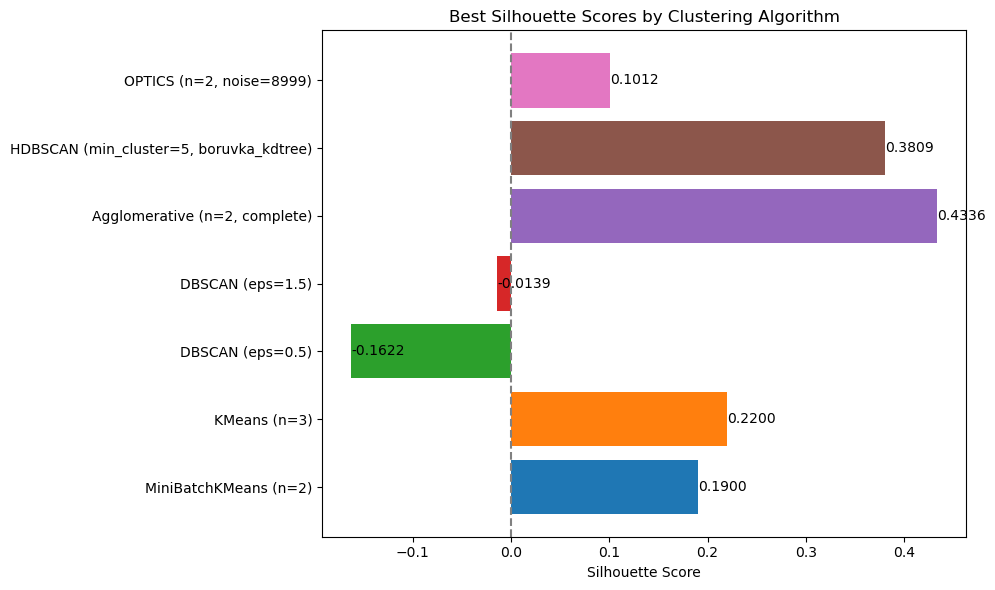

In [119]:
# Data
algorithms = [
    "MiniBatchKMeans (n=2)",
    "KMeans (n=3)",
    "DBSCAN (eps=0.5)",
    "DBSCAN (eps=1.5)",
    "Agglomerative (n=2, complete)",
    "HDBSCAN (min_cluster=5, boruvka_kdtree)",
    "OPTICS (n=2, noise=8999)"
]

scores = [
    0.19,
    0.22,
    -0.1622,
    -0.0139,
    0.4336,
    0.3809,
    0.1012
]

# Plot
plt.figure(figsize=(10, 6))
bars = plt.barh(algorithms, scores, color=plt.get_cmap("tab10").colors)
plt.xlabel("Silhouette Score")
plt.title("Best Silhouette Scores by Clustering Algorithm")
plt.axvline(0, color='gray', linestyle='--')

# Add score labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.4f}', va='center', ha='left', fontsize=10)

plt.tight_layout()
plt.show()

### Conclusion: User segmentation:
Agglomerative Clustering with n=2 and complete linkage achieves the highest Silhouette score (0.4336), indicating the best cluster separation among all algorithms. HDBSCAN with min_cluster_size=5 and boruvka_kdtree provides a strong alternative, with a Silhouette score of 0.3809. MiniBatchKMeans and KMeans perform reasonably well but fall behind Agglomerative and HDBSCAN. OPTICS and DBSCAN provide poor performance, with low or negative Silhouette scores, indicating less effective cluster separation. DBSCAN and OPTICS, while useful for certain applications, may not be ideal for achieving well-separated clusters in this dataset. 

# Experiment 5: Temporal Analysis of Ratings and Tags (2013–2015) - Dimensionality reduction techniques: PCA and t-SNE
In this experiment, data from 2013 to 2015 was analyzed by extracting temporal features from both rating_timestamp and tag_timestamp. These timestamps were decomposed into components such as year, month, day of the week, hour, weekend indicator, and recency. The objective was to capture user behavior patterns over time. Tags were encoded using TF-IDF vectorization, limited to 500 features to prevent memory overload. Two clustering approaches were evaluated: Using only numerical variables (ratings_transformed, mean and count rating users and movies), and Combining numerical variables with one-hot encoded genres and TF-IDF features from tags.

Dimensionality reduction techniques such as t-SNE and PCA were applied for visualization and clustering stability. KMeans, DBSCAN and Agglomeratie clustering algorithms were employed, and their performances were compared using metrics like silhouette scores and cluster separation in reduced-dimensional plots. 

In [979]:
transformations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81812 entries, 0 to 81811
Data columns (total 43 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   movieId              81812 non-null  int64         
 1   title                81812 non-null  object        
 2   genres               81812 non-null  object        
 3   userId               81812 non-null  int64         
 4   rating               81812 non-null  float64       
 5   rating_timestamp     81812 non-null  datetime64[ns]
 6   tag                  81812 non-null  object        
 7   tag_timestamp        81812 non-null  datetime64[ns]
 8   Action               81812 non-null  int64         
 9   Adventure            81812 non-null  int64         
 10  Animation            81812 non-null  int64         
 11  Children             81812 non-null  int64         
 12  Comedy               81812 non-null  int64         
 13  Crime                81812 non-

### Converting timestamps to datetime


In [982]:
transformations_df['rating_timestamp'] = pd.to_datetime(transformations_df['rating_timestamp'])
transformations_df['tag_timestamp'] = pd.to_datetime(transformations_df['tag_timestamp'])


### Rating Timestamp Features


In [985]:
transformations_df['rating_year'] = transformations_df['rating_timestamp'].dt.year
transformations_df['rating_month'] = transformations_df['rating_timestamp'].dt.month
transformations_df['rating_dayofweek'] = transformations_df['rating_timestamp'].dt.dayofweek

transformations_df['rating_hour'] = transformations_df['rating_timestamp'].dt.hour
transformations_df['rating_recency_days'] = (pd.Timestamp.now() - transformations_df['rating_timestamp']).dt.days
transformations_df['is_weekend'] = transformations_df['rating_dayofweek'] >= 5


### Tag Timestamp Features


In [988]:
transformations_df['tag_year'] = transformations_df['tag_timestamp'].dt.year
transformations_df['tag_month'] = transformations_df['tag_timestamp'].dt.month
transformations_df['tag_dayofweek'] = transformations_df['tag_timestamp'].dt.dayofweek

transformations_df['tag_hour'] = transformations_df['tag_timestamp'].dt.hour
transformations_df['tag_recency_days'] = (pd.Timestamp.now() - transformations_df['tag_timestamp']).dt.days

In [990]:
transformations_df.head()

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed,rating_year,rating_month,rating_dayofweek,rating_hour,rating_recency_days,is_weekend,tag_year,tag_month,tag_dayofweek,tag_hour,tag_recency_days
0,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,2010,9,2,22,5352,False,2010,9,2,22,5352
1,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,2010,9,2,22,5352,False,2010,9,2,22,5352
2,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,2010,9,2,22,5352,False,2010,9,2,22,5352
3,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,2010,9,2,22,5352,False,2010,9,2,22,5352
4,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,2010,9,2,22,5352,False,2010,9,2,22,5352


In [992]:
transformations_df.describe(include="all")

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed,rating_year,rating_month,rating_dayofweek,rating_hour,rating_recency_days,is_weekend,tag_year,tag_month,tag_dayofweek,tag_hour,tag_recency_days
count,81812.000000,81812,81812,81812.000000,81812.000000,81812,81812,81812,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000,81812.00000,81812.000000,81812.000000,81812,81812.000000,81812.000000,81812.000000,81812.000000,81812.000000
unique,NaN,2453,509,NaN,NaN,NaN,12286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN
top,NaN,Pulp Fiction (1994),['Drama'],NaN,NaN,NaN,atmospheric,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN
freq,NaN,503,4759,NaN,NaN,NaN,589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56229,NaN,NaN,NaN,NaN,NaN
mean,18486.150662,NaN,NaN,69357.338679,3.708912,2009-08-23 11:03:21.853884416,NaN,2010-06-04 23:04:18.906419456,0.301557,0.237215,0.064514,0.067227,0.308488,0.184961,0.008055,0.498423,0.130629,0.017137,0.084071,0.062338,0.042720,0.114445,0.184178,0.213135,0.307901,0.052511,0.016880,3.708912,83.982790,3.708912,1616.860436,16.143829,2009.154268,6.389552,3.03365,12.811764,5740.195827,NaN,2009.977656,5.888207,3.073864,12.514778,5454.699628
min,1.000000,NaN,NaN,316.000000,0.500000,1997-10-15 06:01:46,NaN,2006-01-09 02:01:59,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,1.000000,0.500000,1.000000,0.670935,1997.000000,1.000000,0.00000,0.000000,3695.000000,NaN,2006.000000,1.000000,0.000000,0.000000,3695.000000
25%,1300.000000,NaN,NaN,27898.000000,3.000000,2007-07-18 15:11:46,NaN,2008-08-03 02:32:49.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.454545,32.000000,3.458832,244.000000,10.169598,2007.000000,3.000000,1.00000,6.000000,4775.000000,NaN,2008.000000,3.000000,1.000000,5.000000,4773.000000
50%,3624.000000,NaN,NaN,68558.000000,4.000000,2010-03-03 11:32:26,NaN,2010-07-08 14:18:02.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.823529,63.000000,3.723921,817.000000,17.304234,2010.000000,6.000000,3.00000,14.000000,5548.000000,NaN,2010.000000,6.000000,3.000000,14.000000,5421.000000
75%,32587.000000,NaN,NaN,108442.000000,4.500000,2012-04-14 16:04:30,NaN,2012-04-16 19:29:21.249999872,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.093284,112.000000,4.014210,2004.000000,21.664115,2012.000000,9.000000,5.00000,19.000000,6507.000000,NaN,2012.000000,9.000000,5.000000,19.000000,6126.000000
max,112852.000000,NaN,NaN,138200.000000,5.000000,2015-03-30 18:33:54,NaN,2015-03-30 20:05:34,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,503.000000,5.000000,5886.000000,26.573838,2015.000000,12.00

The rating_year feature in the dataset ranges from 1997 to 2015, indicating nearly two decades of user activity. Ratings are distributed across all months (rating_month spans from 1 to 12) and days of the week (rating_dayofweek ranges from 0 for Monday to 6 for Sunday), providing comprehensive coverage for seasonal and weekly trend analysis. Additionally, the rating_hour feature includes values from 0 to 23, enabling the exploration of hourly user behavior, such as peak viewing times. Notably, the is_weekend attribute reveals that a significant portion of the ratings—approximately 56,000 instances—occurred on weekdays, suggesting that most user interactions happen during the workweek. These temporal attributes are valuable for understanding user engagement patterns and can be leveraged in time-aware clustering or recommendation models.

### Trend of ratings in the years

In [995]:
# Group by year and count the number of ratings
ratings_per_year = transformations_df.groupby('rating_year').size()

ratings_per_year

rating_year
1997        5
1998      456
1999      441
2000      583
2001     1157
2002     1554
2003     2233
2004     3111
2005     2276
2006     5721
2007     6778
2008     6828
2009     7865
2010    10440
2011     8446
2012     8690
2013     8092
2014     5494
2015     1642
dtype: int64

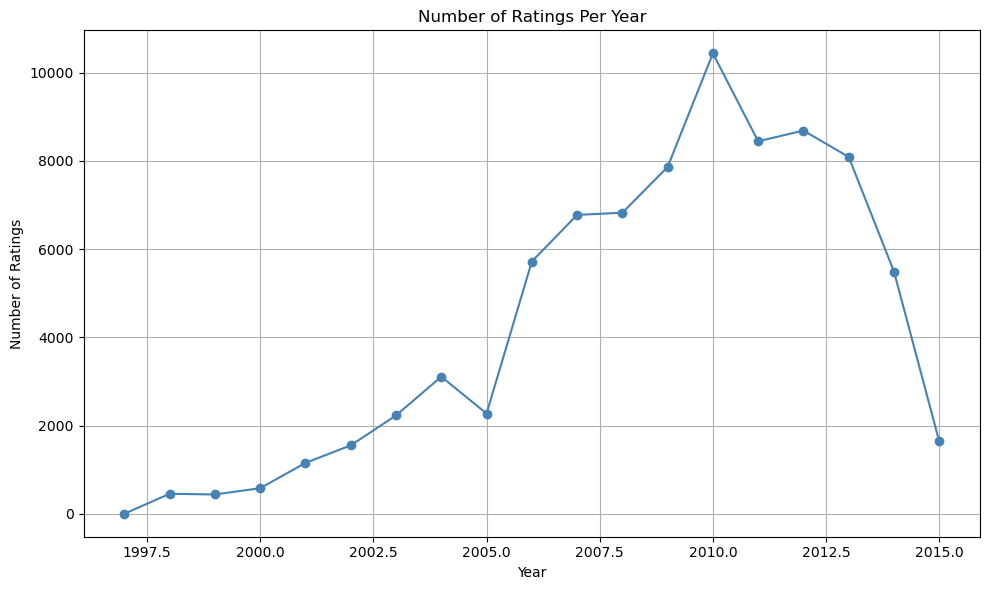

In [997]:
# Plot
plt.figure(figsize=(10, 6))
plt.plot(ratings_per_year.index, ratings_per_year.values, marker='o', linestyle='-', color='steelblue')
plt.title('Number of Ratings Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Ratings')
plt.grid(True)
plt.tight_layout()
plt.show()

From the plot, it is seen that there are high number of ratings (app. 10,500) in 2010 followed by a great decrease.

### Trend in tags over the years

In [1000]:
# Group by year and count the number of ratings
tags_per_year = transformations_df.groupby('tag_year').size()

tags_per_year

tag_year
2006     9273
2007     7401
2008     6087
2009    12764
2010    11726
2011    10327
2012     9594
2013     7521
2014     5268
2015     1851
dtype: int64

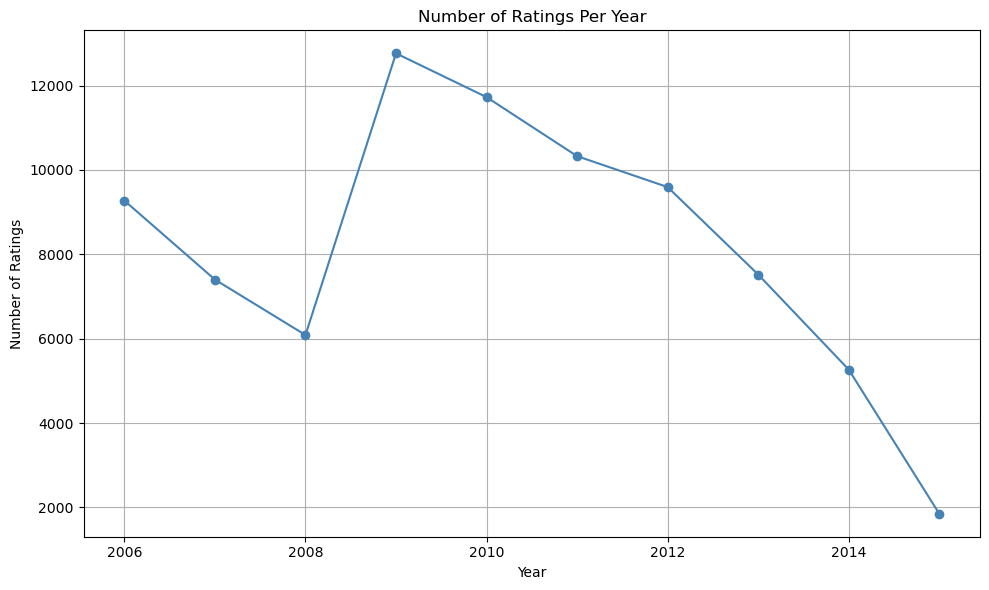

In [1002]:
# Plot
plt.figure(figsize=(10, 6))
plt.plot(tags_per_year.index, tags_per_year.values, marker='o', linestyle='-', color='steelblue')
plt.title('Number of Ratings Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Ratings')
plt.grid(True)
plt.tight_layout()
plt.show()

Similarly, the tags have a spike in 2009 and 2010 and then decreased by 2015 to a large extent.

## Next step: Fine-Tuned Clustering Analysis (2013-2015)

This refined timeline approach allows to reduce computational complexity and avoid memory errors while capturing relevant user behavior. The data is fine tuned from 2013 until 2015 and the tags are encoded by TF-IDF vectorizer:

#### Choosing the dataset from over 2013:

In [1005]:
tags_after_2013 = transformations_df[transformations_df['tag_timestamp'].dt.year > 2013].copy()
tags_after_2013

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed,rating_year,rating_month,rating_dayofweek,rating_hour,rating_recency_days,is_weekend,tag_year,tag_month,tag_dayofweek,tag_hour,tag_recency_days
48,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",110148,3.5,2014-03-06 13:56:21,animation,2015-01-30 08:15:56,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.440367,109,13.478381,2014,3,3,13,4084,False,2015,1,4,8,3754
49,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",110148,3.5,2014-03-06 13:56:21,friendship,2015-01-30 08:15:56,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.440367,109,13.478381,2014,3,3,13,4084,False,2015,1,4,8,3754
50,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",110148,3.5,2014-03-06 13:56:21,toys,2015-01-30 08:15:56,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.440367,109,13.478381,2014,3,3,13,4084,False,2015,1,4,8,3754
81,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",123297,5.0,2004-03-30 18:59:56,55 movies every kid should see--Entertainment ...,2014-08-03 16:15:26,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,4.171951,1640,26.573838,2004,3,1,18,7712,False,2014,8,6,16,3934
82,1,Toy Story (1995),"['Adventure', 'Animation', 'Children', 'Comedy...",123297,5.0,2004-03-30 18:59:56,BD-Video,2014-08-03 16:15:26,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,4.171951,1640,26.573838,2004,3,1,18,7712,False,2014,8,6,16,3934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,Marvel,2014-11-15 21:20:01,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234,2014,11,5,21,3830,True,2014,11,5,21,3830
81808,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,space,2014-11-15 21:18:08,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234,2014,11,5,21,3830,True,2014,11,5,21,3830
81809,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,talking animals,2014-11-15 21:18:05,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234,2014,11,5,21,3830,True,2014,11,5,21,3830
81810,112852,Guardians of the Galaxy (2014),"['Action', 'Adventure', 'Sci-Fi']",88738,4.0,2014-11-15 21:17:58,watch the credits,2014-11-15 21:19:51,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4.204082,49,3.723921,4937,17.304234,2014,11,5,21,3830,True,2014,11,5,21,3830


#### Vvectorizer of the tags

In [1008]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Instantiate TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features=500)  # max_features limits the number of features

# Transform tags column into TF-IDF representation
tags_tfidf = vectorizer.fit_transform(tags_after_2013['tag'].fillna(''))

tags_after_2013 = tags_after_2013.reset_index(drop=True)

# convert the TF-IDF to a DataFrame
tags_tfidf_df = pd.DataFrame(tags_tfidf.toarray(), columns=vectorizer.get_feature_names_out())

# Concatenate
tags_after_2013_tfidf = pd.concat([tags_after_2013, tags_tfidf_df], axis=1)


In [1010]:
tags_after_2013_tfidf

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed,rating_year,rating_month,rating_dayofweek,rating_hour,rating_recency_days,is_weekend,tag_year,tag_month,tag_dayofweek,tag_hour,tag_recency_days,100,13,1950s,1960s,1980s,19th,2014,250,55,70mm,academy,acting,action,actor,actress,adapted,adventure,af,afi,age,al,alfred,alien,aliens,allen,alternate,american,anamorphic,anderson,animal,animals,animated,animation,anime,anne,antagonist,anthony,anti,apocalyptic,appealing,arnold,art,artificial,artistic,arts,assassin,atmospheric,author,award,bad,bale,based,bd,beatles,beautiful,bechdel,ben,best,better,big,biographical,bittersweet,black,blow,book,books,boring,bounty,boxing,brad,brief,british,brothers,bruce,budget,bullock,burt,burton,buscemi,business,caine,campy,cannibalism,carrey,cast,cat,century,character,characters,child,children,chris,christian,christianity,christopher,cinematography,city,civil,class,classic,clint,clooney,clv,coen,comedy,comic,coming,commentary,complex,connery,conspiracy,controversial,corruption,creepy,crime,criterion,cruise,cult,culture,cusack,cute,cyberpunk,cynical,daniel,dark,daughter,david,death,debut,den,depp,depressing,der,det,dialogue,dicaprio,dick,disney,disturbing,documentary,downey,dragons,drama,dreamlike,drugs,dvd,dysfunctional,dystopia,dystopic,eastwood,edward,effects,emotional,en,end,ending,england,enigmatic,ensemble,entertainment,epic,er,escape,espionage,et,evil,existentialism,expected,expressionism,fail,fairy,family,fantasy,fassbender,father,feature,feel,fi,fiction,fight,fighting,fille,film,fincher,finland,football,ford,freeman,friendship,frontal,fun,funny,future,futuristic,games,geeks,george,german,ghosts,gibson,goldblum,good,gore,gothic,grant,great,gritty,hanks,har,harris,harrison,heartwarming,heist,helt,hero,heroine,high,hilarious,historical,history,hitchcock,hoffman,hollywood,hopkins,horror,hugh,humor,humorous,hunt,hunter,ii,ikke,illness,imax,imdb,independent,inspirational,intelligence,intelligent,intense,invasion,investigation,jack,jackson,james,japan,jason,jeff,jeg,jennifer,jim,johansson,john,johnny,jones,journalism,jr,kevin,kid,killer,king,kubrick,lawrence,lead,lee,leonardo,lidt,life,lille,london,loneliness,long,loop,love,low,mafia,magic,martial,martin,marvel,matthew,mcconaughey,med,medieval,meget,mel,melancholy,memasa,memory,men,mental,michael,military,mindfuck,modern,monster,moore,morality,morgan,movie,movies,multiple,murder,murray,music,musical,musicians,mystery,native,nazis,neo,netflix,new,nicholson,niro,nogle,noir,nolan,nominee,non,nonlinear,norton,notable,nudity,obsession,og,opera,organized,original,oscar,overrated,owen,pacino,parody,pass,patrick,peter,pg,philip,philosophical,philosophy,picture,pirates,pitt,pixar,plot,police,political,politics,post,pratt,predictable,prison,provoking,psychological,psychology,quentin,quirky,racism,rape,realistic,reality,rear,reflective,relationship,relationships,religion,remake,revenge,reviewed,revolution,road,robert,robin,robots,rock,roll,romance,romantic,run,russell,sad,sam,samuel,san,sandra,satire,satirical,scarlett,scenes,school,schwarzenegger,sci,science,scorsese,screenwriter,sean,seen,self,sentimental,sequel,serial,sex,sexual,sexuality,sigourney,silent,silly,slow,smith,social,som,son,soundtrack,space,spacey,spherical,spielberg,stallone,stanley,star,steve,steven,stewart,stone,story,storylines,storytelling,strong,stunning,stupid,stylized,suicide,superhero,supernatural,surreal,surrealism,survival,suspense,sword,sylvester,tale,talking,tarantino,teen,television,tense,terrorism,test,thought,thriller,thrilling,til,tim,time,tom,tommy,topless,torture,trains,travel,trip,true,tv,twist,ud,underdog,underrated,unnecessary,vampires,van,var,video,vietnam,violence,violent,virkelig,virtual,visually,war,watch,weaver,wee

In [1011]:
tags_after_2013_tfidf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7119 entries, 0 to 7118
Columns: 543 entries, movieId to young
dtypes: bool(1), datetime64[ns](2), float64(504), int32(8), int64(25), object(3)
memory usage: 29.2+ MB


### Approach 1: For Numerical variables only: Using PCA for Dimensionality reduction technique

In [1015]:
from sklearn.manifold import TSNE

X = tags_after_2013_tfidf.select_dtypes(include="float64").drop(columns=["rating"])

X_pca = PCA(n_components=2).fit_transform(X)  

Silhouette Score for KMeans (2 clusters): 0.58


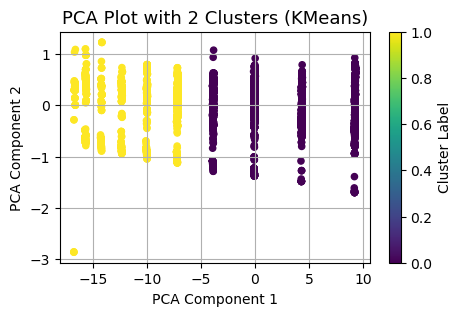

Silhouette Score for KMeans (3 clusters): 0.59


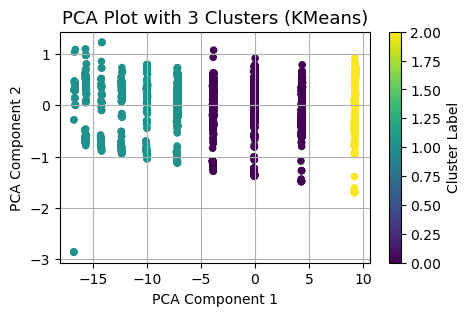

Silhouette Score for KMeans (4 clusters): 0.64


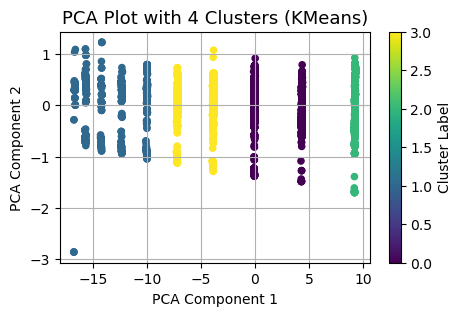

Silhouette Score for KMeans (5 clusters): 0.81


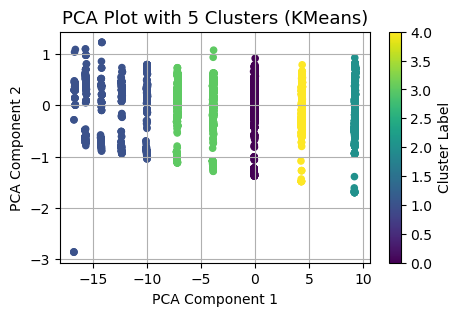

Silhouette Score for KMeans (6 clusters): 0.84


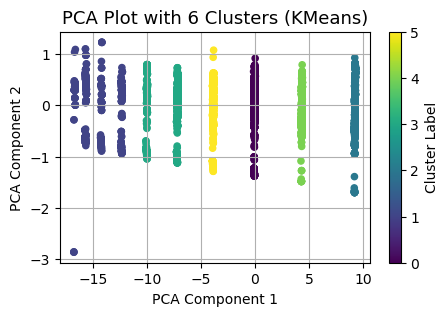

Silhouette Score for KMeans (7 clusters): 0.86


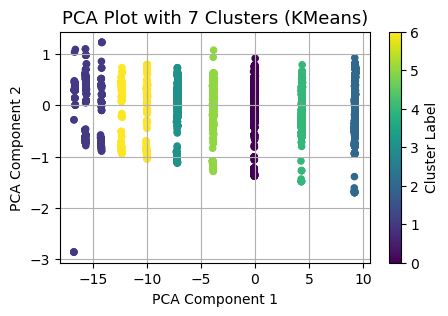

Silhouette Score for KMeans (8 clusters): 0.86


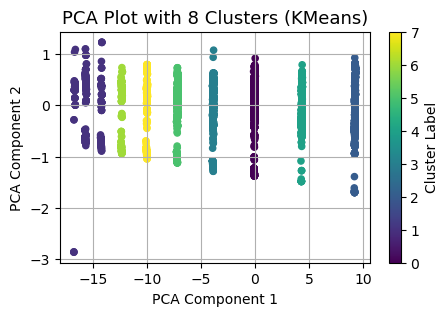

Silhouette Score for KMeans (9 clusters): 0.78


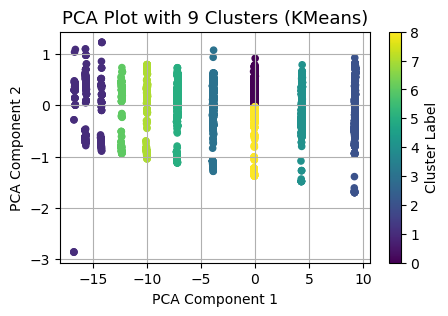

Silhouette Score for KMeans (10 clusters): 0.78


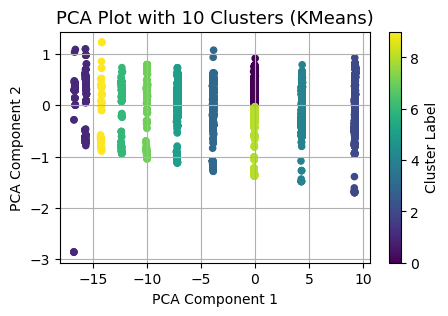

Silhouette Score for KMeans (11 clusters): 0.80


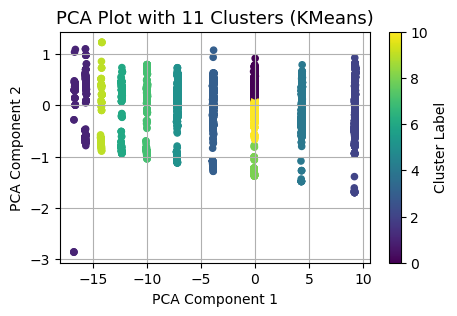

Silhouette Score for KMeans (12 clusters): 0.75


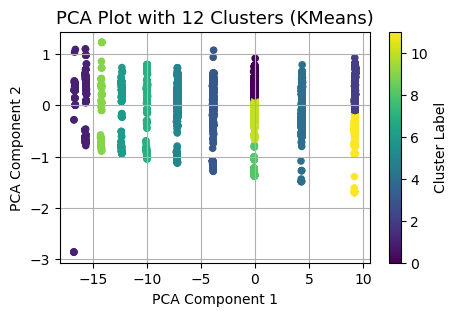

Silhouette Score for KMeans (13 clusters): 0.75


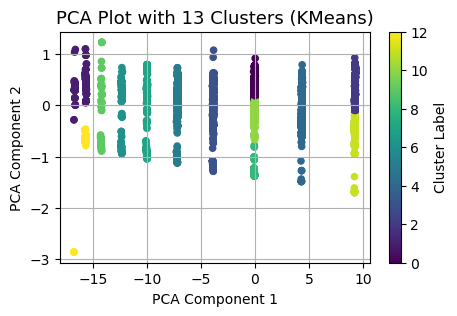

Silhouette Score for KMeans (14 clusters): 0.70


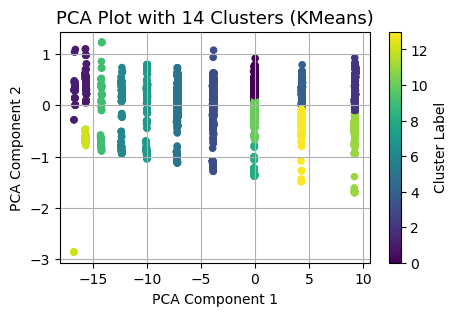

In [1017]:
# Perform KMeans Clustering
from sklearn.cluster import KMeans

for n_cluster in range(2, 15):
    kmeans = KMeans(n_clusters=n_cluster, random_state=42)
    y_pred = kmeans.fit_predict(X_pca)
    sil_score = silhouette_score(X_pca, y_pred)
    print(f"Silhouette Score for KMeans ({n_cluster} clusters): {sil_score:.2f}")

    plt.figure(figsize=(5, 3))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred, cmap='viridis', s=20)
    plt.title(f'PCA Plot with {n_cluster} Clusters (KMeans)', fontsize=13)
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.colorbar(label='Cluster Label')
    plt.grid(True)
    plt.show()


### Approach 2: For all numerical variables, one hot encoded genres and TF-IDF encoded tags: PCA:

Silhouette Score for KMeans (2 clusters): 0.44


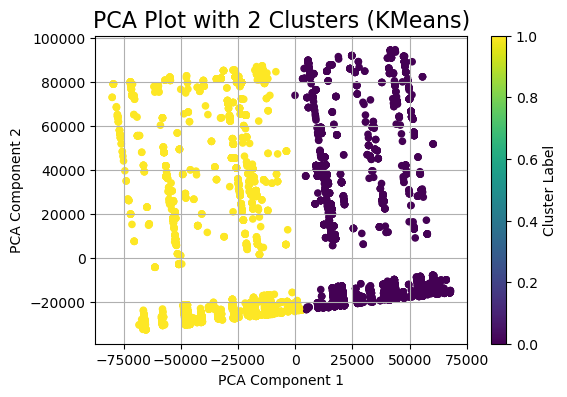

Silhouette Score for KMeans (3 clusters): 0.55


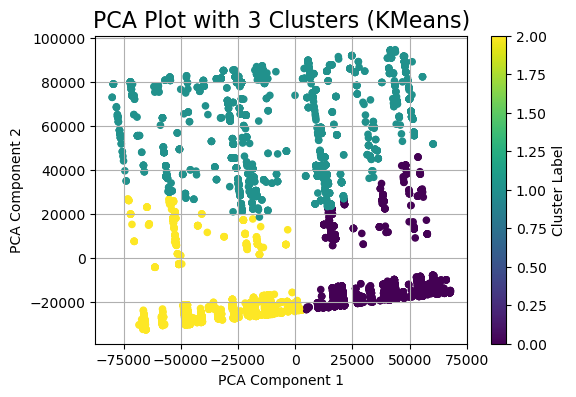

Silhouette Score for KMeans (4 clusters): 0.58


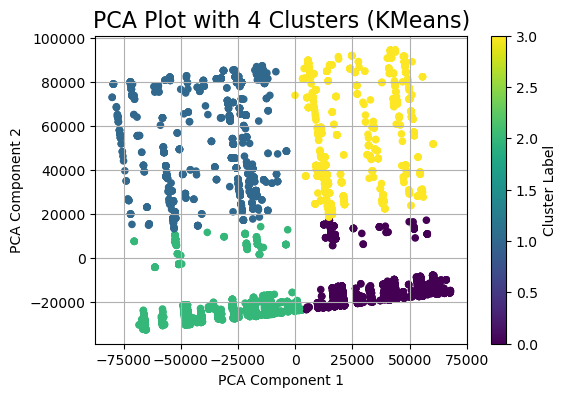

Silhouette Score for KMeans (5 clusters): 0.56


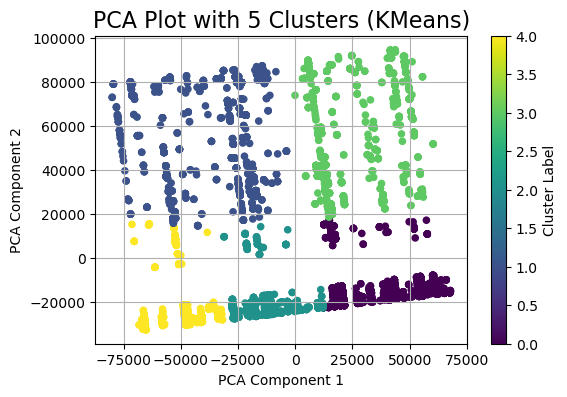

Silhouette Score for KMeans (6 clusters): 0.60


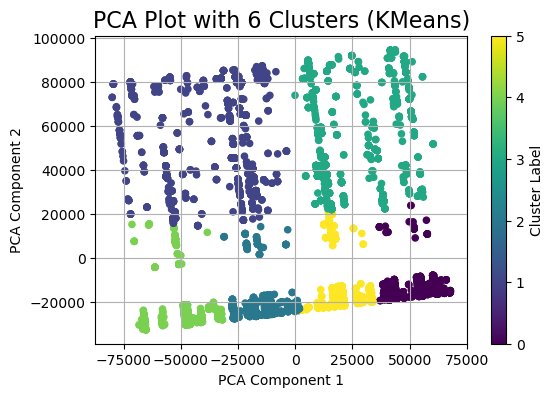

Silhouette Score for KMeans (7 clusters): 0.62


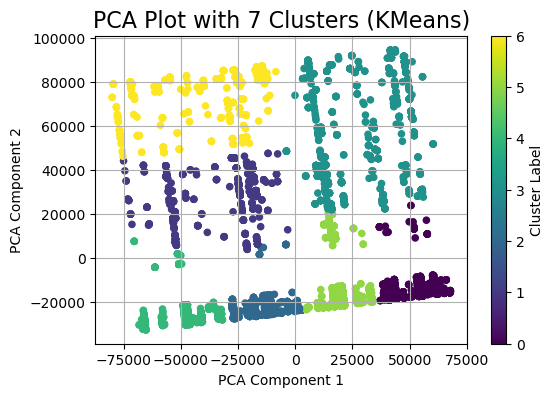

Silhouette Score for KMeans (8 clusters): 0.63


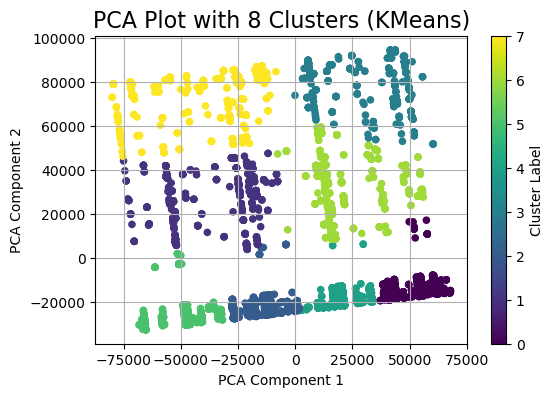

Silhouette Score for KMeans (9 clusters): 0.64


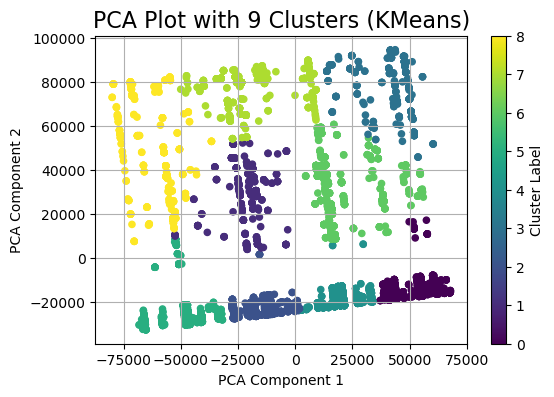

Silhouette Score for KMeans (10 clusters): 0.64


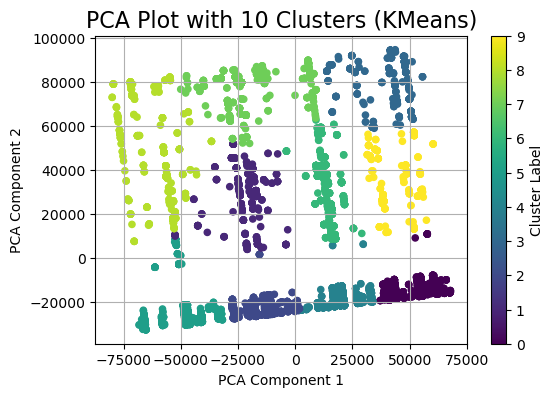

Silhouette Score for KMeans (11 clusters): 0.65


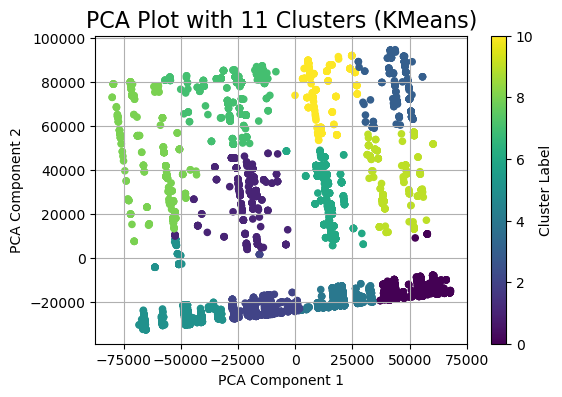

Silhouette Score for KMeans (12 clusters): 0.64


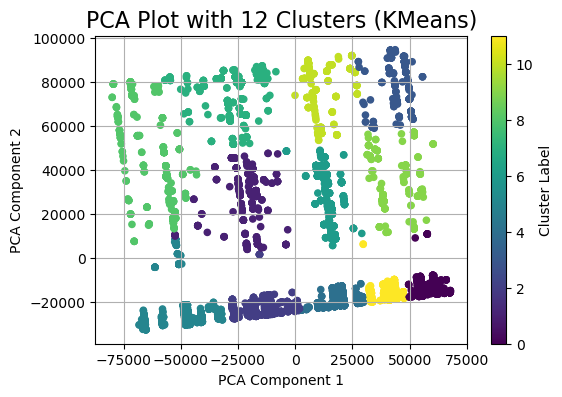

Silhouette Score for KMeans (13 clusters): 0.65


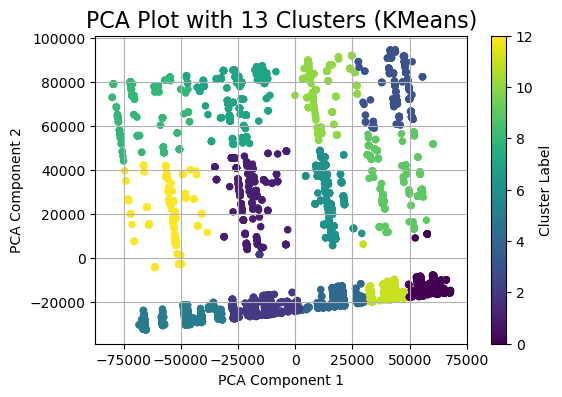

Silhouette Score for KMeans (14 clusters): 0.65


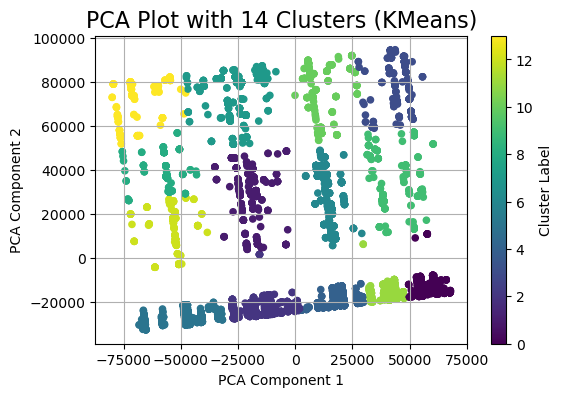

In [1019]:
X = tags_after_2013_tfidf.select_dtypes(include=["float64", "int32", "int64"]).drop(columns=["rating"])
X_pca = PCA(n_components=2).fit_transform(X)  # Apply PCA to reduce dimensions to 2D

# Perform KMeans Clustering
from sklearn.cluster import KMeans
for n_cluster in range(2, 15):
    kmeans = KMeans(n_clusters=n_cluster, random_state=42)
    y_pred = kmeans.fit_predict(X_pca)
    # Calculate Silhouette Score
    sil_score = silhouette_score(X_pca, y_pred)
    print(f"Silhouette Score for KMeans ({n_cluster} clusters): {sil_score:.2f}")

        # Apply PCA transformation for visualization
    plt.figure(figsize=(6, 4))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred, cmap='viridis', s=20)
    plt.title(f'PCA Plot with {n_cluster} Clusters (KMeans)', fontsize=16)
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.colorbar(label='Cluster Label')
    plt.grid(True)
    plt.show()


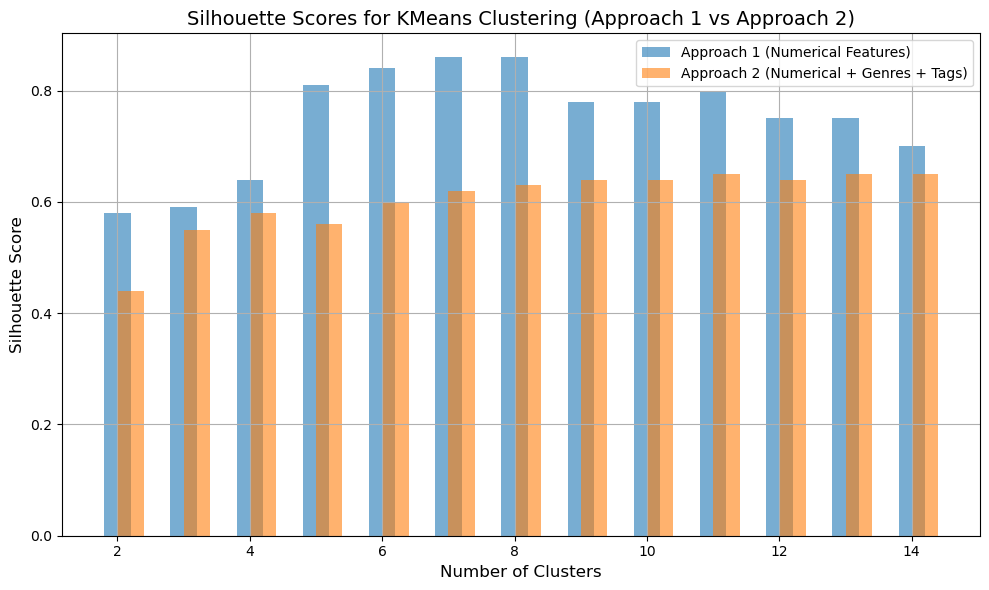

In [1034]:
# Silhouette Scores for both approaches at various cluster sizes
approach_1_scores = [0.58, 0.59, 0.64, 0.81, 0.84, 0.86, 0.86, 0.78, 0.78, 0.80, 0.75, 0.75, 0.70]  # Approach 1 (numerical variables only)
approach_2_scores = [0.44, 0.55, 0.58, 0.56, 0.60, 0.62, 0.63, 0.64, 0.64, 0.65, 0.64, 0.65, 0.65]  # Approach 2 (with genres and tags)

# Cluster range
cluster_range = list(range(2, 15))

# Create a bar chart to compare the silhouette scores
plt.figure(figsize=(10, 6))
plt.bar(cluster_range, approach_1_scores, alpha=0.6, label='Approach 1 (Numerical Features)', width=0.4, align='center')
plt.bar(cluster_range, approach_2_scores, alpha=0.6, label='Approach 2 (Numerical + Genres + Tags)', width=0.4, align='edge')

plt.title('Silhouette Scores for KMeans Clustering (Approach 1 vs Approach 2)', fontsize=14)
plt.xlabel('Number of Clusters', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Approach 3: DBSCAN using PCA and t-SNE Dimensionality reduction technique:

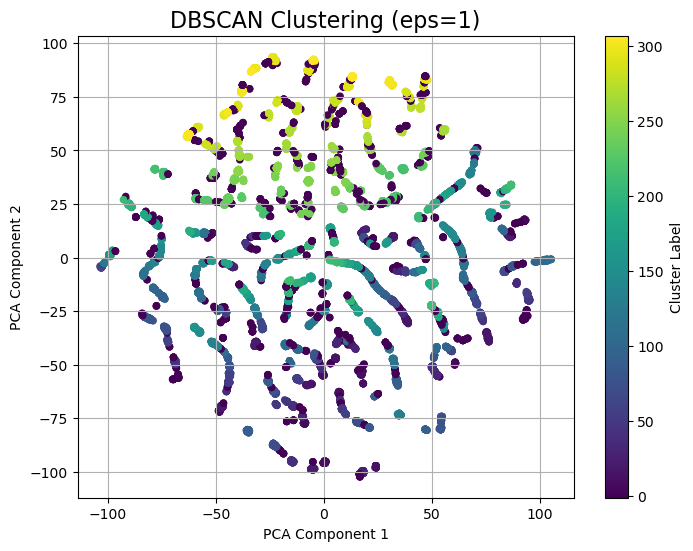

Silhouette Score for DBSCAN (eps=1): 0.47


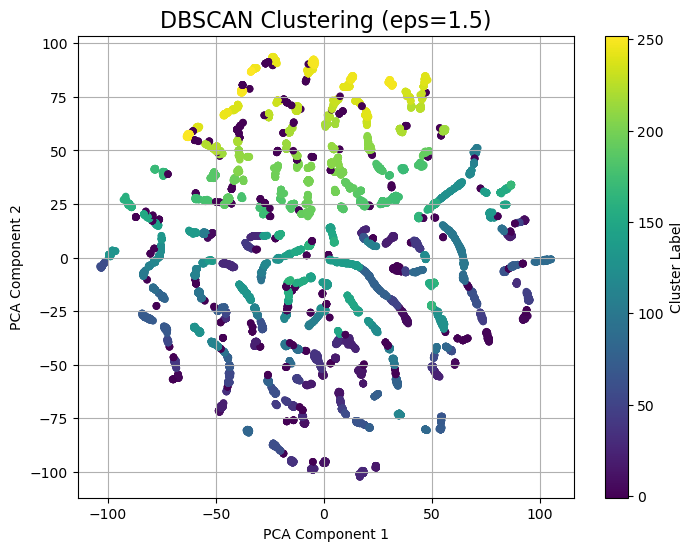

Silhouette Score for DBSCAN (eps=1.5): 0.59


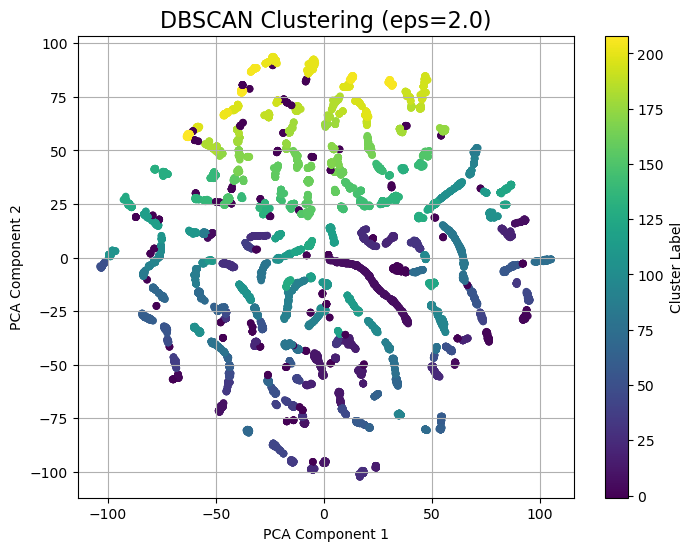

Silhouette Score for DBSCAN (eps=2.0): 0.60


In [1021]:
# Define DBSCAN parameters (try different eps values)
eps_values = [1, 1.5, 2.0]  # Adjusting eps for the DBSCAN algorithm

for eps in eps_values:
    # Perform DBSCAN clustering
    dbscan = DBSCAN(eps=eps, min_samples=10)
    y_pred = dbscan.fit_predict(X_tsne)
    
    # Plot the DBSCAN results
    plt.figure(figsize=(8, 6))
    
    # Color the points based on cluster labels (DBSCAN assigns -1 for noise)
    plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_pred, cmap='viridis', s=20, marker='o')
    
    # Customize the plot
    plt.title(f'DBSCAN Clustering (eps={eps})', fontsize=16)
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.colorbar(label='Cluster Label')
    plt.grid(True)
    
    # Show the plot
    plt.show()

    if len(set(y_pred)) > 1:  
        sil_score = silhouette_score(X_tsne, y_pred)
        print(f"Silhouette Score for DBSCAN (eps={eps}): {sil_score:.2f}")
    else:
        print(f"DBSCAN (eps={eps}) only found 1 cluster (no valid silhouette score).")

### k-distance Plot (to choose eps):

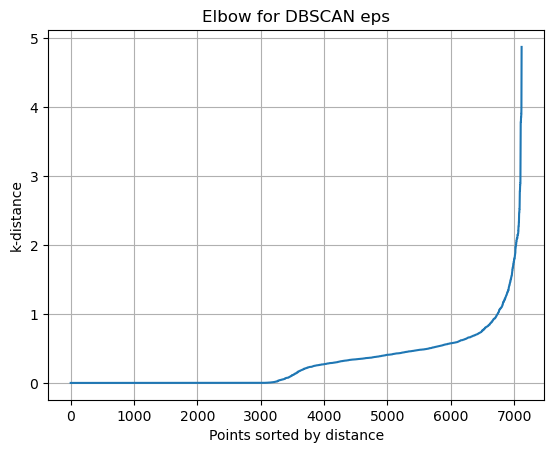

In [1023]:
from sklearn.neighbors import NearestNeighbors

k = 5  # usually min_samples
neigh = NearestNeighbors(n_neighbors=k)
nbrs = neigh.fit(X_tsne)
distances, _ = nbrs.kneighbors(X_tsne)
distances = sorted(distances[:, k-1])

plt.plot(distances)
plt.ylabel("k-distance")
plt.xlabel("Points sorted by distance")
plt.title("Elbow for DBSCAN eps")
plt.grid(True)
plt.show()


The plot shows that there is a rise in the slope close to when k-distance is around 0.6. The eps at 0.6 shows the highest score with DBSCAN. The score decreases, when the eps is increased or decreased beyond this point.

In [1025]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Range of clusters to evaluate
cluster_range = list(range(2, 5))

for n_clusters in cluster_range:
    # Perform Agglomerative Clustering with dynamic number of clusters
    cluster_labels = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='single')
    y_pred = cluster_labels.fit_predict(X_tsne)

    # Compute Silhouette Score
    sil_score = silhouette_score(X_tsne, y_pred)
    print(f"{n_clusters} clusters: Silhouette Score = {sil_score:.2f}")




2 clusters: Silhouette Score = 0.21
3 clusters: Silhouette Score = 0.02
4 clusters: Silhouette Score = -0.08


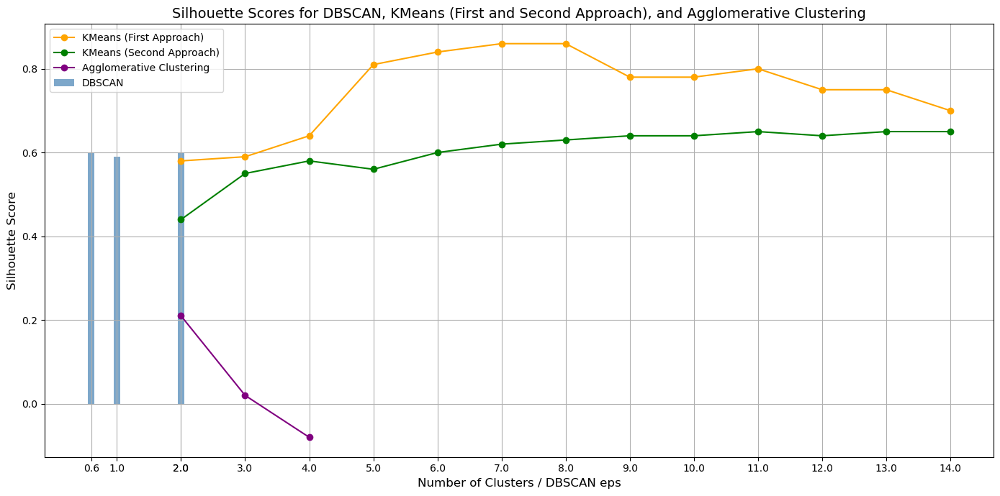

In [1038]:
# Silhouette Scores for each approach
dbscan_scores = [0.60, 0.59, 0.60]  # DBSCAN scores for eps=0.6, 1.0, 2.0
kmeans_first_approach_scores = [0.58, 0.59, 0.64, 0.81, 0.84, 0.86, 0.86, 0.78, 0.78, 0.80, 0.75, 0.75, 0.70]  # KMeans first approach
kmeans_second_approach_scores = [0.44, 0.55, 0.58, 0.56, 0.60, 0.62, 0.63, 0.64, 0.64, 0.65, 0.64, 0.65, 0.65]  # KMeans second approach
agglo_scores = [0.21, 0.02, -0.08]  # Agglomerative Clustering

# Cluster numbers for KMeans (range from 2 to 14 clusters)
kmeans_cluster_range = list(range(2, 15))

# Plotting the Silhouette Scores
plt.figure(figsize=(14, 7))

# Plot DBSCAN scores (single bar for each eps value)
plt.bar([0.6, 1.0, 2.0], dbscan_scores, width=0.1, alpha=0.7, label='DBSCAN', color='steelblue')

# Plot KMeans first approach scores for each number of clusters (using only numerical variables)
plt.plot(kmeans_cluster_range, kmeans_first_approach_scores, marker='o', linestyle='-', color='orange', label='KMeans (First Approach)')

# Plot KMeans second approach scores for each number of clusters (with genres and tags)
plt.plot(kmeans_cluster_range, kmeans_second_approach_scores, marker='o', linestyle='-', color='green', label='KMeans (Second Approach)')

# Plot Agglomerative Clustering scores for each number of clusters (only for 2, 3, and 4 clusters)
plt.plot([2, 3, 4], agglo_scores, marker='o', linestyle='-', color='purple', label='Agglomerative Clustering')

plt.title('Silhouette Scores for DBSCAN, KMeans (First and Second Approach), and Agglomerative Clustering', fontsize=14)
plt.xlabel('Number of Clusters / DBSCAN eps', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)
plt.xticks([0.6, 1.0, 2.0] + kmeans_cluster_range)  
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Conclusion:
In this experiment, dimensionality reduction techniques (PCA and t-SNE) was applied to the dataset, followed by clustering methods including KMeans, DBSCAN, and Hierarchical Clustering. Each of these methods was tested with different feature sets to evaluate their clustering performance, and their results were analyzed using the Silhouette Score.

#### KMeans Clustering:
Two different approaches were tested for KMeans clustering: 
##### First Approach: Clustering was performed on numerical features such as mean and count of user and movie ratings.
The Silhouette Score for KMeans clustering with this approach varied, with the highest score observed for 7 clusters (Silhouette Score = 0.86). The results generally showed improved clustering performance as the number of clusters increased, with scores peaking at 7 clusters and gradually declining afterward.

##### Results for KMeans (First Approach):

2 clusters: 0.58

3 clusters: 0.59

4 clusters: 0.64

5 clusters: 0.81

6 clusters: 0.84

7 clusters: 0.86

8 clusters: 0.86

9 clusters: 0.78

10 clusters: 0.78

11 clusters: 0.80

12 clusters: 0.75

13 clusters: 0.75

14 clusters: 0.70

##### Second Approach: 
In this approach, KMeans clustering was applied with the inclusion of one-hot encoded genres and TF-IDF vectorized tags, along with the numerical features. Here, the Silhouette Scores were relatively consistent, with the best score observed for 14 clusters (Silhouette Score = 0.65).

##### Results for KMeans (Second Approach):

2 clusters: 0.44

3 clusters: 0.55

4 clusters: 0.58

5 clusters: 0.56

6 clusters: 0.60

7 clusters: 0.62

8 clusters: 0.63

9 clusters: 0.64

10 clusters: 0.64

11 clusters: 0.65

12 clusters: 0.64

13 clusters: 0.65

14 clusters: 0.65

The second approach generally yielded higher Silhouette Scores, indicating better-defined clusters, especially when the number of clusters was higher.
Although the first approach achieves a higher Silhouette Score of 0.86 at 7 clusters, the second approach is preferred due to the feature Diversity. The second approach includes one-hot encoded genres and TF-IDF tags, adding rich, semantic information that enhances clustering quality. It shows better Interpretability. Despite a lower Silhouette Score of 0.65, the additional features help form clusters that better reflect real-world categories, making them more meaningful for analysis. It has higher granularity. The second approach performs well with higher cluster numbers (up to 14), capturing finer patterns in the data, even if it results in slightly lower Silhouette Scores. This indicates more diverse and segmented clusters.

First Approach (numerical only) is great when simple, quick clustering and interpretability. Second Approach (with genres and tags), while yielding a slightly lower Silhouette Score, is likely the better choice because it considers more information, which provides better context for clustering and has the potential to create more meaningful and diverse clusters. Even with a slightly lower score, the second approach could provide clusters that are more actionable or relevant to the problem at hand (e.g., clustering movies based on genre and tags could be more useful for recommendations or analysis).

Thus, the second approach might be considered the best because it balances feature richness with clustering diversity despite having a slightly lower score.

#### DBSCAN Clustering:
For DBSCAN clustering, we used the k-distance plot to determine the optimal eps value. The sharp rise at 0.6 in the k-distance plot suggested that eps = 0.6 would be a good choice. Various values for min_samples were tested, and the results showed that increasing min_samples to 10 produced better clustering with clear separation of data points.

##### Results for DBSCAN:

eps=0.6, min_samples=5: Silhouette Score = 0.60

eps=1.0, min_samples=10: Silhouette Score = 0.59

eps=2.0, min_samples=10: Silhouette Score = 0.60

The Silhouette Scores were relatively consistent, but increasing min_samples helped to make the clusters more distinct and less noisy.

#### Agglomerative Clustering:
Agglomerative clustering performed relatively poorly compared to the other clustering methods. Even after applying both PCA and t-SNE for dimensionality reduction, the Silhouette Scores for Agglomerative Clustering remained low, with some values even negative, indicating poor clustering.

##### Results for Agglomerative Clustering:

2 clusters: Silhouette Score = 0.21

3 clusters: Silhouette Score = 0.02

4 clusters: Silhouette Score = -0.08

KMeans clustering with the numerical features and TF-IDF tags generally performed the best in terms of Silhouette Scores, particularly when the number of clusters was set between 6 and 7. DBSCAN was sensitive to the eps and min_samples parameters, and when properly tuned, it could provide reasonable clustering results, especially with clear separation. Agglomerative Clustering, on the other hand, did not perform well with these features, as reflected by the poor Silhouette Scores. 

In conclusion, KMeans with numerical features, one-hot encoded genres, and TF-IDF tags is the most effective method for clustering this dataset, yielding the highest and most stable Silhouette Scores across a range of clusters.

## Conclusion
Across five clustering experiments, KMeans consistently demonstrated reliable performance compared to density-based and hierarchical methods, particularly in sparse data conditions s, KMeans consistently outperformed density-based and hierarchical methods, especially under sparse data conditions. Its top performance came in Experiment 5 with an 86% silhouette score using numerical features (7 clusters), and 65% when incorporating genres and tags (11 clusters). Experiment 1 also showed strong results with scores of 77% (2 clusters) and 71% (3 and 7 clusters). In contrast, DBSCAN, HDBSCAN, and Agglomerative methods struggled with over-segmentation and imbalance due to data sparsity. While KMeans emerged as the most reliable, the experiments highlight the limitations of basic clustering approaches and point to the need for more advanced, scalable methods in future work to enhance cluster quality and interpretability.


# Question 2:  Recommendations Systems


In [6]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances

import matplotlib.pyplot as plt
import seaborn as sns

# Data Loading

In [9]:
movies = pd.read_csv("movies_utf8.csv")
ratings = pd.read_csv("rating_utf8.csv")


In [11]:
ratings.head()

,userId,movieId,rating,timestamp
0,12882,1,4.0,1147195252
1,12882,32,3.5,1147195307
2,12882,47,5.0,1147195343
3,12882,50,5.0,1147185499
4,12882,110,4.5,1147195239


### Checking for null values

In [14]:
ratings.isnull().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

### Checking for data types

In [17]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264505 entries, 0 to 264504
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   userId     264505 non-null  int64  
 1   movieId    264505 non-null  int64  
 2   rating     264505 non-null  float64
 3   timestamp  264505 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 8.1 MB


## Descriptive statistics - ratings

In [20]:
ratings.describe()

,userId,movieId,rating,timestamp
count,264505.000000,264505.000000,264505.000000,2.645050e+05
mean,68227.207225,11917.340326,3.504062,1.203784e+09
std,40855.031343,21615.562394,0.993534,1.136991e+08
min,316.000000,1.000000,0.500000,8.767674e+08
25%,33173.000000,1260.000000,3.000000,1.132967e+09
50%,66362.000000,2949.000000,3.500000,1.198263e+09
75%,103076.000000,6537.000000,4.000000,1.291971e+09
max,138200.000000,112852.000000,5.000000,1.427779e+09


### Filtering the ratings for more than 0 ratings

In [23]:
ratings[ratings["rating"] > 0].describe()

,userId,movieId,rating,timestamp
count,264505.000000,264505.000000,264505.000000,2.645050e+05
mean,68227.207225,11917.340326,3.504062,1.203784e+09
std,40855.031343,21615.562394,0.993534,1.136991e+08
min,316.000000,1.000000,0.500000,8.767674e+08
25%,33173.000000,1260.000000,3.000000,1.132967e+09
50%,66362.000000,2949.000000,3.500000,1.198263e+09
75%,103076.000000,6537.000000,4.000000,1.291971e+09
max,138200.000000,112852.000000,5.000000,1.427779e+09


This filters out rows where the rating is 0 (presumably, 0 means no rating), and then generates descriptive statistics for the ratings. This shows that there are 264505 users in the dataset after the filter of > 0

# Experiment 1: Baseline Recommendation System – Collaborative Filtering and Content-Based Filtering on Full Dataset:
In this experiment, four fundamental recommendation models are implemented and evaluated on the dataset: User-User Collaborative Filtering, Item-Item Collaborative Filtering, SVD and Content-Based Filtering. The primary goal was to understand the basic working and recommendation patterns of different algorithms under an idealized setting, without train-test splitting, and using only highly active users. 

### Dataset Filtering
The dataset was filtered to include only users with more than 200 ratings, to ensure that each user had enough data to compute meaningful similarities and predictions. Only the essential features were retained: userId, movieId, and rating. Ratings were used as-is (i.e., actual ratings, not adjusted ratings) to reflect true user preference in the output and recommendations. 

### Choosing active users (users have > 200 ratings)

In [27]:
user_counts = ratings.groupby("userId")["movieId"].count()
active_users = user_counts[user_counts > 200].index
ratings = ratings[ratings["userId"].isin(active_users)]


This ensures that only active users (those who rated more than 200 movies) are kept in the ratings DataFrame.
### Checking to see the number of active users for analysis

In [30]:
ratings.describe()

,userId,movieId,rating,timestamp
count,225716.00000,225716.000000,225716.000000,2.257160e+05
mean,67445.38976,11518.241822,3.455838,1.194534e+09
std,41352.62997,21128.913851,0.989143,1.138815e+08
min,359.00000,1.000000,0.500000,8.767674e+08
25%,31321.00000,1267.000000,3.000000,1.119024e+09
50%,64150.00000,2942.000000,3.500000,1.188316e+09
75%,102853.00000,6373.000000,4.000000,1.282920e+09
max,138200.00000,112852.000000,5.000000,1.427772e+09


THere are still 225716 users in the ratings dataframe for the recommendation analysis

### Calculating the user mean rating and adjusted_rating
This calculates the average rating for each user and then subtracts it from each user's rating to get the Adjusted Rating. This is used in collaborative filtering to normalize ratings by removing personal bias.

In [34]:
user_mean_rating = ratings.groupby(by="userId")['rating'].mean()
ratings = pd.merge(ratings, user_mean_rating, on="userId")
ratings["Adjusted-Rating"] = ratings["rating_x"] - ratings["rating_y"]


In [36]:
ratings.head()

,userId,movieId,rating_x,timestamp,rating_y,Adjusted-Rating
0,18127,1,4.0,1130946329,3.618622,0.381378
1,18127,6,4.0,1115221641,3.618622,0.381378
2,18127,16,4.0,1130945999,3.618622,0.381378
3,18127,21,3.0,1003274522,3.618622,-0.618622
4,18127,32,3.5,1090185486,3.618622,-0.118622


# User-User Collaborative filtering
#### Pivot table with users and movies - User_Item_Matrix
This creates a pivot table where rows represent users and columns represent movies. The values are the adjusted ratings, and missing ratings are filled with the user's mean rating.

In [39]:
user_item_matrix = pd.pivot_table(ratings, values="Adjusted-Rating", index="userId", columns="movieId")
user_item_matrix = user_item_matrix.apply(lambda row: row.fillna(row.mean()), axis=1)


In [41]:
user_item_matrix.head()

movieId,1,2,3,4,5,6,7,9,10,11,...,106487,106489,106782,106920,109374,109487,111362,111759,112556,112852
userId,,,,,,,,,,,,,,,,,,,,,
359,1.314526e+00,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,1.314526e+00,9.809414e-17,9.809414e-17,3.145258e-01,3.145258e-01,...,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17,9.809414e-17
370,7.055961e-01,2.055961e-01,-1.728814e-16,-1.728814e-16,-1.728814e-16,1.205596e+00,-1.728814e-16,-1.728814e-16,-1.728814e-16,-1.728814e-16,...,-1.294404e+00,-7.944039e-01,7.055961e-01,2.055961e-01,-1.728814e-16,-1.728814e-16,-7.944039e-01,7.055961e-01,-2.944039e-01,-7.944039e-01
910,1.101920e+00,1.019202e-01,-3.980798e-01,-1.994138e-16,-3.980798e-01,-3.980798e-01,-1.994138e-16,-1.994138e-16,-1.994138e-16,1.019202e-01,...,-1.994138e-16,-1.994138e-16,-3.980798e-01,-1.994138e-16,-1.994138e-16,-1.994138e-16,-1.994138e-16,6.019202e-01,-1.994138e-16,-1.994138e-16
975,-9.542413e-17,-9.542413e-17,-9.542413e-17,-9.542413e-17,-9.542413e-17,-5.578512e-02,-9.542413e-17,-9.542413e-17,-9.542413e-17,-9.542413e-17,...,-9.542413e-17,-9.542413e-17,-5.578512e-02,-9.542413e-17,4.442149e-01,-5.557851e-01,-9.542413e-17,-5.578512e-02,-9.542413e-17,4.442149e-01
1015,4.468085e-01,-5.531915e-01,-1.322819e-16,-1.322819e-16,-5.319149e-02,-1.322819e-16,-1.322819e-16,-1.322819e-16,-5.319149e-02,-1.322819e-16,...,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16,-1.322819e-16


# Cosine Similarity Matrix
Calculates cosine similarity between users based on their adjusted ratings. The diagonal values (representing self-similarity) are set to 0 because a user is always most similar to themselves.

In [44]:
users_similiarity = cosine_similarity(user_item_matrix)
np.fill_diagonal(users_similiarity, 0)
users_similiarity_df = pd.DataFrame(users_similiarity,index=user_item_matrix.index, columns=user_item_matrix.index)
users_similiarity_df.head()

userId,359,370,910,975,1015,1588,1741,1935,2024,2248,...,134964,135092,135223,135418,136015,136455,137118,137805,138072,138200
userId,,,,,,,,,,,,,,,,,,,,,
359,0.000000,0.135836,0.076131,0.036757,0.046418,0.109726,0.074078,0.108544,0.105273,0.090336,...,0.056335,0.075844,0.112839,0.059213,0.085524,0.086432,0.120191,0.075492,0.102698,0.003147
370,0.135836,0.000000,0.108404,0.071655,0.070893,0.090241,0.045340,0.013804,0.100884,0.056301,...,0.106989,0.015734,0.073179,0.015463,0.115510,0.056026,0.091218,-0.001364,0.052187,0.009950
910,0.076131,0.108404,0.000000,0.021814,0.027339,-0.007491,0.035724,0.025552,-0.003860,0.021981,...,0.056334,0.038195,0.043167,0.059144,0.060947,0.012221,0.039464,-0.026082,0.073272,0.007610
975,0.036757,0.071655,0.021814,0.000000,0.000522,0.002827,0.058078,0.037406,0.095442,-0.031574,...,0.039068,0.018345,0.172263,0.112699,0.112188,0.013796,0.144978,0.030725,0.124565,0.047868
1015,0.046418,0.070893,0.027339,0.000522,0.000000,0.114593,0.035739,0.032337,0.030693,0.073216,...,0.010072,0.065744,-0.048684,-0.020733,0.049907,0.026348,0.000448,0.032425,0.023265,0.074660


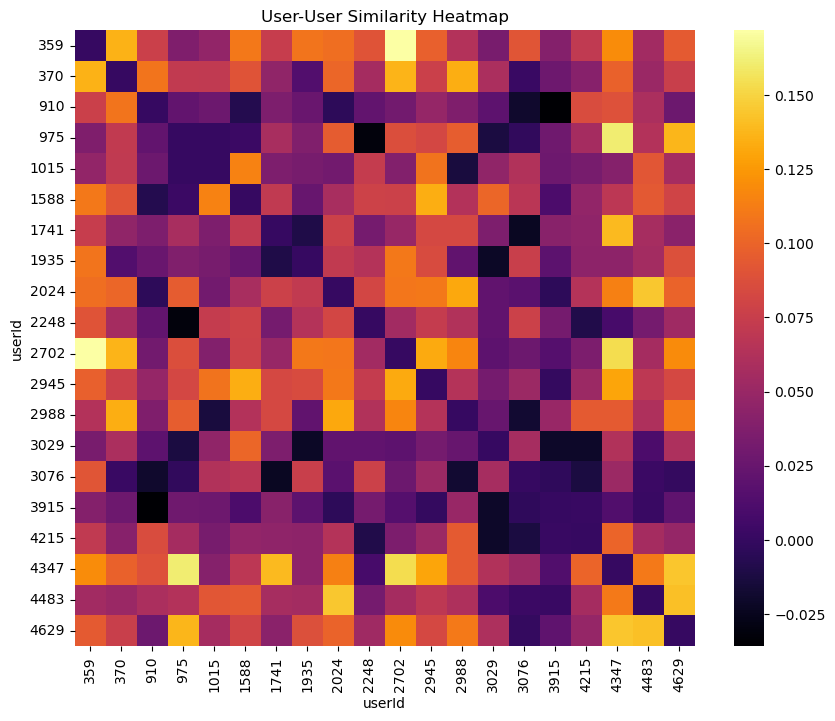

In [46]:

subset = users_similiarity_df.iloc[:20, :20]
plt.figure(figsize=(10, 8))
sns.heatmap(subset, cmap='inferno', annot=False)
plt.title('User-User Similarity Heatmap')
plt.show()

# Find Neighbors Function
This function finds the top n most similar users (or items) based on the similarity matrix (df). It sorts the values in each row in descending order (i.e., most similar first) and returns the indices of the top n most similar users/items.

In [49]:
def find_n_neighbours(df, n):
    '''df is the dataframe with the user-user and n is the number of neighbours to find'''
    order = np.argsort(df.values, axis=1)[:, :n]
    df = df.apply(lambda x: pd.Series(x.sort_values(ascending=False)
           .iloc[:n].index, 
          index=['top{}'.format(i) for i in range(1, n+1)]), axis=1)
    return df
    
# top 30 similar users per user
sim_user_30_u = find_n_neighbours(users_similiarity_df, 30)


# Get User Similar Items Function
This function finds common movies rated by two users (user1 and user2) and returns the corresponding movie details.

In [52]:
def get_user_similar_items(user1, user2):
    df = ratings.reset_index()
    common_items = df[df["userId"] == user1].merge(
    df[df["userId"] == user2],
    on = "movieId",
    how = "inner" )
    return common_items.merge( movies, on = 'movieId' )


# Get User Recommendations Function
This function generates recommendations for a given user. It finds the top 2 most similar users to the current user, identifies the movies they have rated, and suggests movies that the similar user has rated highly but the current user has not seen.

In [55]:
def get_user_recommendations(user, top_n=2):
    df = ratings.copy()
    user_neighbors = sim_user_30_u.loc[user][:top_n]
    user_movies = df[df["userId"] == user]["movieId"].values
    
    recs = pd.DataFrame()

    for neighbor in user_neighbors:
        neighbor_ratings = df[df["userId"] == neighbor]
        unseen = neighbor_ratings[~neighbor_ratings["movieId"].isin(user_movies)]
        recs = pd.concat([recs, unseen])

    recs = recs.groupby("movieId").agg({"Adjusted-Rating": "mean"}).reset_index()
    recs = recs[recs["Adjusted-Rating"] > 0]
    recs = recs.sort_values(by="Adjusted-Rating", ascending=False)
    
    return recs.merge(movies, on="movieId")[["movieId", "title", "Adjusted-Rating", "genres"]]

### List of recommendations for the different users:

In [58]:
get_user_recommendations(359)

,movieId,title,Adjusted-Rating,genres
0,2360,"Celebration, The (Festen) (1998)",1.557851,Drama
1,2710,"Blair Witch Project, The (1999)",1.557851,Drama|Horror|Thriller
2,1203,12 Angry Men (1957),1.557851,Drama
3,1209,Once Upon a Time in the West (C'era una volta ...,1.557851,Action|Drama|Western
4,969,"African Queen, The (1951)",1.518440,Adventure|Comedy|Romance|War
...,...,...,...,...
270,64839,"Wrestler, The (2008)",0.018440,Drama
271,8376,Napoleon Dynamite (2004),0.018440,Comedy
272,2505,8MM (1999),0.018440,Drama|Mystery|Thriller
273,71057,9 (2009),0.018440,Adventure|Animation|Sci-Fi


In [60]:
get_user_recommendations(18127)

,movieId,title,Adjusted-Rating,genres
0,1206,"Clockwork Orange, A (1971)",1.508881,Crime|Drama|Sci-Fi|Thriller
1,4027,"O Brother, Where Art Thou? (2000)",1.508881,Adventure|Comedy|Crime
2,4973,"Amelie (Fabuleux destin d'Amélie Poulain, Le) ...",1.508881,Comedy|Romance
3,4979,"Royal Tenenbaums, The (2001)",1.508881,Comedy|Drama
4,3556,"Virgin Suicides, The (1999)",1.508881,Drama|Romance
...,...,...,...,...
325,2420,"Karate Kid, The (1984)",0.008881,Drama
326,4448,"Score, The (2001)",0.008881,Action|Drama
327,2702,Summer of Sam (1999),0.008881,Drama
328,2871,Deliverance (1972),0.008881,Adventure|Drama|Thriller


### Calculating the user_predicted ratings

In [63]:
# Dot product of similarity matrix and ratings matrix
user_predicted_ratings = users_similiarity.dot(user_item_matrix)

# Normalize by sum of similarities
similarity_sum = np.array([np.abs(users_similiarity).sum(axis=1)]).T
user_predicted_ratings = user_predicted_ratings / similarity_sum

# Convert to DataFrame for easier comparison
user_predicted_ratings = pd.DataFrame(user_predicted_ratings, 
                                      index=user_item_matrix.index, 
                                      columns=user_item_matrix.columns)


### Calculate the RMSE

In [66]:
from sklearn.metrics import mean_squared_error
from math import sqrt

#Checking the performance of the algorithm

def rmse(prediction, ground_truth):
    prediction = prediction[ground_truth.nonzero()].flatten()
    ground_truth = ground_truth[ground_truth.nonzero()].flatten()
    return sqrt(mean_squared_error(prediction, ground_truth))

print('User-user collaborative error:', rmse(user_predicted_ratings.values, user_item_matrix.values))

User-user collaborative error: 0.3869856961097514


The result 0.3869856961097514 for the User-user collaborative error indicates the Root Mean Squared Error (RMSE) between the predicted ratings and the actual ratings. RMSE measures the difference between predicted ratings and actual ratings. It provides a measure of how well the recommender system is performing. A lower RMSE value indicates better predictive accuracy. An RMSE value of 0.387 suggests that, on average, the predicted ratings deviate from the actual ratings by approximately 0.39. 

# Item - ITem Collaborative filtering
#### Item Similiarity matrix
This creates a matrix where the rows and columns represent items, and the values represent the similarity between each pair of items.

In [69]:
#We create an item similarity matrix

item_similarity = cosine_similarity(user_item_matrix.T)
item_similarity_df = pd.DataFrame(item_similarity, index = user_item_matrix.columns, columns = user_item_matrix.columns)
item_similarity_df

movieId,1,2,3,4,5,6,7,9,10,11,...,106487,106489,106782,106920,109374,109487,111362,111759,112556,112852
movieId,,,,,,,,,,,,,,,,,,,,,
1,1.000000,-0.046017,-0.051665,-0.129739,-0.127735,0.147420,-0.071837,-0.101817,0.141789,-0.022809,...,0.114547,0.016945,0.064034,-2.101921e-02,0.091009,-0.017739,0.052475,0.133876,0.087405,0.111749
2,-0.046017,1.000000,0.197020,0.020012,0.153707,-0.132509,0.113185,0.098167,0.112564,-0.066982,...,-0.084642,-0.025686,-0.129196,-6.182417e-02,-0.106171,-0.168351,-0.072425,-0.083125,-0.093868,-0.133607
3,-0.051665,0.197020,1.000000,0.113461,0.220612,-0.074934,0.106507,0.123413,0.101319,-0.166592,...,-0.007955,-0.030858,-0.046118,-7.158319e-03,-0.103972,-0.107472,-0.056698,-0.042186,-0.027274,-0.084320
4,-0.129739,0.020012,0.113461,1.000000,0.081848,-0.022389,0.188227,0.075302,0.009958,0.060486,...,0.006751,0.000154,0.000002,-1.863174e-17,-0.144378,-0.044904,-0.024577,0.007316,0.000516,-0.024314
5,-0.127735,0.153707,0.220612,0.081848,1.000000,-0.129850,0.091009,0.132696,0.042634,0.304076,...,-0.058740,-0.017464,-0.073272,-9.280839e-02,-0.176592,-0.104957,-0.031830,-0.153241,-0.014214,-0.099434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109487,-0.017739,-0.168351,-0.107472,-0.044904,-0.104957,0.091670,-0.041690,-0.083643,-0.073802,-0.020167,...,0.039159,-0.085494,0.368695,1.542734e-01,0.198963,1.000000,0.212643,0.221230,0.188565,0.309850
111362,0.052475,-0.072425,-0.056698,-0.024577,-0.031830,0.002752,-0.049804,-0.042142,0.002787,0.033122,...,0.057256,0.056245,0.327977,5.289320e-02,0.185962,0.212643,1.000000,0.334285,0.270439,0.568912
111759,0.133876,-0.083125,-0.042186,0.007316,-0.153241,0.095529,-0.002126,-0.151453,-0.029579,0.069867,...,0.107051,-0.004648,0.287307,3.362483e-02,0.259791,0.221230,0.334285,1.000000,0.147640,0.364315


#### Function to Get Top-N Similar Items

In [72]:
def get_top_n_similar_items(item_id, item_similarity_df, n=30):
    # Retrieve the similarity scores for the given item
    similarity_scores = item_similarity_df[item_id]
    
    # Sort the items based on similarity scores in descending order and exclude the item itself
    sorted_items = similarity_scores.sort_values(ascending=False)
    
    # Get the top 'n' most similar items (excluding the item itself)
    top_n_items = sorted_items.iloc[1:n+1]
    
    return top_n_items


item_id=106487
top_30_similar_items = get_top_n_similar_items(item_id, item_similarity_df, n=30)

print(top_30_similar_items)


movieId
91500     0.378857
97913     0.306400
81834     0.298513
918       0.292440
104841    0.286686
106920    0.284074
88125     0.284019
156       0.283982
91658     0.268228
88163     0.255643
96079     0.247403
84954     0.246754
1124      0.246454
106489    0.243876
84152     0.242935
69757     0.240661
97921     0.235208
1293      0.234977
96610     0.227923
1188      0.222425
56174     0.213231
1649      0.210586
72998     0.209780
27611     0.205690
80489     0.202718
102125    0.196006
6297      0.194645
91529     0.192720
91542     0.189097
54001     0.187861
Name: 106487, dtype: float64


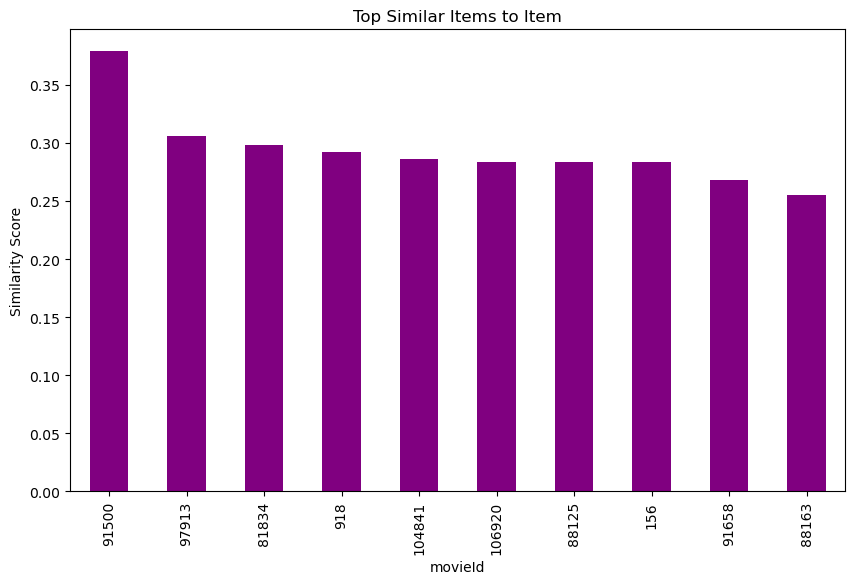

In [74]:
import matplotlib.pyplot as plt
item_id = 106487
top_items = get_top_n_similar_items(item_id, item_similarity_df).head(10)

top_items.plot(kind='bar', figsize=(10, 6), color="purple")
plt.title(f'Top Similar Items to Item')
plt.ylabel('Similarity Score')
plt.show()

### Prediction Function:
 function predict_ratings_item_based calculates the predicted ratings for all users based on the item similarity matrix. The formula is essentially the weighted sum of the user's ratings on items, weighted by how similar the items are to each other.

In [77]:
#Rating for the item collaboration

def predict_ratings_item_based(user_item_matrix, item_similarity):
    pred = user_item_matrix.values.dot(item_similarity) / np.array([np.abs(item_similarity).sum(axis=1)])
    return pred

#Predict the ratings
item_predicted_ratings = predict_ratings_item_based(user_item_matrix, item_similarity)

#### Prediction and Accuracy

In [80]:
#We print the accuracy
print('Item-item collaborative error:', rmse(item_predicted_ratings, user_item_matrix.values))

Item-item collaborative error: 0.37324639890476824


Item-Item Collaborative Filtering is working slightly better than User-User Collaborative Filtering based on the lower RMSE. This is often the case, especially in systems where item relationships (like genre similarity or content similarity) can be used effectively.

User-User Collaborative Filtering: RMSE = 0.3869

Item-Item Collaborative Filtering: RMSE = 0.3732

Since the RMSE is lower for the item-item model, it suggests that this method provides better recommendations in terms of predicting ratings. In both cases, the errors seem very high. The rmse must be close to zero. The closer to zero, the better. So, we will apply the SVD

In [155]:
from scipy.sparse.linalg import svds

In [157]:
#Normalise the data to have the same unit of measurement

user_ratings_mean = np.mean(user_item_matrix.values, axis = 1)
ratings_demeaned = user_item_matrix.values - user_ratings_mean.reshape(-1,1)

In [159]:
#Singular Value Decomposition (SVD)
U, sigma, Vt = svds(ratings_demeaned, k = 50)
sigma = np.diag(sigma)

In [161]:
#Rating prediction
all_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + user_ratings_mean.reshape(-1,1)
predicted_ratings_df = pd.DataFrame(all_user_predicted_ratings, columns = user_item_matrix.columns)

In [163]:
#Evaluation of the model after the SVD
print('SVD collaborative filtering', rmse(predicted_ratings_df.values, user_item_matrix.values))

SVD collaborative filtering 0.30555881251252986


In [165]:
#Now, with this results, we can move on to the recommendations. Let's say that we want to recommend 5 items

def recommended_items(user_id, user_item_matrix, predicted_ratings_df, num_recommendations = 5):
    user_idx = user_item_matrix.index.get_loc(user_id) #sorting the user predicted ratings
    sorted_user_ratings = predicted_ratings_df.iloc[user_idx].sort_values(ascending = False)
    user_data = user_item_matrix.loc[user_id] #appending or merging the user data with the sorted ratings
    user_full = (user_data[user_data >0]).sort_values(ascending = False)
    recommendations = sorted_user_ratings[~sorted_user_ratings.index.isin(user_full.index)]
    return recommendations.head(num_recommendations) # recommendation of items that the user did not buy yet

In [167]:
def normalize_ratings(predicted_ratings):
    min_rating = predicted_ratings.min()
    max_rating = predicted_ratings.max()
    probabilities = (predicted_ratings - min_rating) / (max_rating - min_rating)
    return probabilities

In [169]:
#To see the recommendations, we need to select a random user because recommendations will change user by user

random_user_index = np.random.choice(user_item_matrix.index) #I select a random user

user_id = random_user_index
user_id

43599

In [171]:
recommendations = recommended_items(random_user_index, user_item_matrix, predicted_ratings_df, num_recommendations = 5)

In [173]:
#Normalise the predicted ratings to get probabilities
recommendation_probabilities = normalize_ratings(recommendations)

# Display the recommendations and their probabilities
print("Recommendations for User ID:", user_id)
print(recommendation_probabilities)

Recommendations for User ID: 43599
movieId
50       1.000000
3421     0.858545
33166    0.708660
480      0.139599
3812     0.000000
Name: 157, dtype: float64


In [176]:
print('Recommendations for User:', user_id)
print(recommendations)

Recommendations for User: 43599
movieId
50       0.373634
3421     0.347053
33166    0.318888
480      0.211957
3812     0.185725
Name: 157, dtype: float64


In [178]:
# Extract top recommended movie IDs
recommended_movie_ids = recommendations.index.tolist()
recommended_movie_ids

[50, 3421, 33166, 480, 3812]

In [180]:
# Filter the ratings DataFrame based on those movie IDs
filtered_data = ratings[ratings['movieId'].isin(recommended_movie_ids)]
filtered_data

,userId,movieId,rating_x,timestamp,rating_y,Adjusted-Rating
7,18127,50,5.0,962391152,3.618622,1.381378
38,18127,480,3.0,1130946320,3.618622,-0.618622
285,18127,3421,5.0,964136292,3.618622,1.381378
398,17318,50,4.5,1168807359,4.030120,0.469880
415,17318,480,4.0,1168807304,4.030120,-0.030120
...,...,...,...,...,...,...
224579,131910,3812,4.0,1131206343,3.541290,0.458710
224803,131910,33166,4.0,1152621595,3.541290,0.458710
224935,9197,50,5.0,980061582,3.341709,1.658291
224996,9197,480,1.0,980062183,3.341709,-2.341709


In [182]:
prob_df = pd.DataFrame(list(recommendation_probabilities.items()), columns = ['movieId', 'Probability'])

In [184]:
final_result_df = pd.merge(filtered_data['movieId'].drop_duplicates(), prob_df, on = 'movieId')
final_result_df

,movieId,Probability
0,50,1.000000
1,480,0.139599
2,3421,0.858545
3,33166,0.708660
4,3812,0.000000


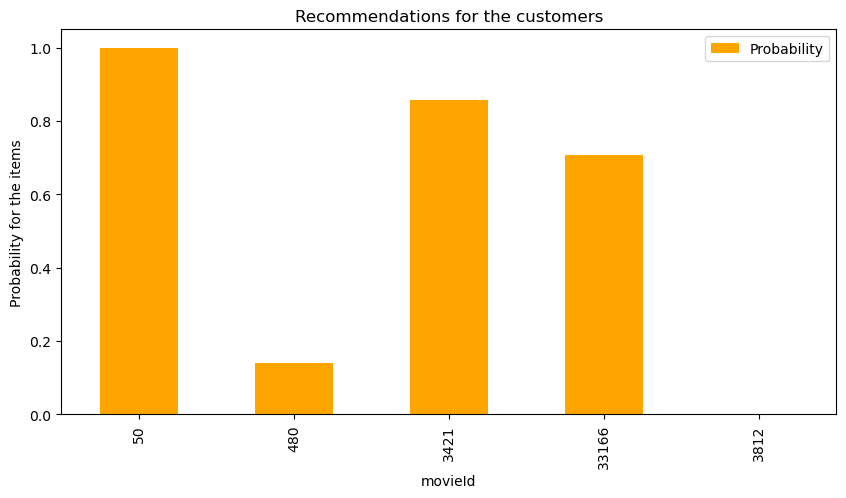

In [186]:
import matplotlib.pyplot as plt
top_items = final_result_df

top_items.plot(kind='bar',x="movieId", y="Probability", figsize=(10,5), color="orange")
plt.title(f'Recommendations for the customers')
plt.ylabel('Probability for the items')
plt.show()

# Content Filtering Recommendations 
Content-based filtering is a type of recommendation system that suggests items (like movies, books, or products) to users based on the attributes of the items they’ve previously interacted with. Instead of relying on what other users like (as in collaborative filtering), content-based methods focus on similarities between items and a user's own preferences.

In [339]:
tags = pd.read_csv("tags_utf8.csv")
movies = pd.read_csv("movies_utf8.csv")

tags.head()

,movieId,userId,tag,timestamp
0,3916,12882,sports,1147195545
1,4085,12882,Eddie Murphy,1147195966
2,33660,12882,boxing,1147195514
3,1197,320,must show,1145964801
4,1396,320,must show,1145964810


In [341]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


### Merge tags into a single string per movie


In [344]:
tags_agg = tags.groupby('movieId')['tag'].apply(lambda x: ' '.join(x)).reset_index()
movies = pd.merge(movies, tags_agg, on='movieId', how='left')
movies.head()

,movieId,title,genres,tag
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,children computer animation Disney family Pixa...
1,2,Jumanji (1995),Adventure|Children|Fantasy,fantasy Robin Williams scary time travel Child...
2,3,Grumpier Old Men (1995),Comedy|Romance,comedinha de velhinhos engraÃ§ada Jack Lemmon ...
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,characters chick flick CLV chick flick revenge
4,5,Father of the Bride Part II (1995),Comedy,steve martin pregnancy remake Fantasy CLV Dian...


### Combine genres and tags into a single text field


In [347]:
movies['genres'] = movies['genres'].str.replace('|', ' ')  # replace pipe with space
movies['tag'] = movies['tag'].fillna('')
movies['content'] = movies['genres'] + ' ' + movies['tag']
movies.head()

,movieId,title,genres,tag,content
0,1,Toy Story (1995),Adventure Animation Children Comedy Fantasy,children computer animation Disney family Pixa...,Adventure Animation Children Comedy Fantasy ch...
1,2,Jumanji (1995),Adventure Children Fantasy,fantasy Robin Williams scary time travel Child...,Adventure Children Fantasy fantasy Robin Willi...
2,3,Grumpier Old Men (1995),Comedy Romance,comedinha de velhinhos engraÃ§ada Jack Lemmon ...,Comedy Romance comedinha de velhinhos engraÃ§a...
3,4,Waiting to Exhale (1995),Comedy Drama Romance,characters chick flick CLV chick flick revenge,Comedy Drama Romance characters chick flick CL...
4,5,Father of the Bride Part II (1995),Comedy,steve martin pregnancy remake Fantasy CLV Dian...,Comedy steve martin pregnancy remake Fantasy C...


### Create TF-IDF Matrix

In [350]:
# Vectorize the 'content' column using TF-IDF
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(movies['content'])

# Compute cosine similarity between movies
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)


### Recommendation Function


In [353]:
# Create a mapping from title to index
indices = pd.Series(movies.index, index=movies['title'])

def recommend_movies(title, num_recommendations=5):
    idx = indices.get(title)
    if idx is None:
        return f"Movie '{title}' not found in dataset."
    
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:num_recommendations+1]  # skip the movie itself

    movie_indices = [i[0] for i in sim_scores]
    return movies['title'].iloc[movie_indices]

In [355]:
recommend_movies('Jumanji (1995)', num_recommendations=5)


1924      One Hour Photo (2002)
1888    Death to Smoochy (2002)
838              Flubber (1997)
2293          Happy Feet (2006)
287       Mrs. Doubtfire (1993)
Name: title, dtype: object

In [361]:
from sklearn.model_selection import train_test_split

# Assuming your full ratings dataframe is named `ratings`
ratings_train, ratings_test = train_test_split(ratings, test_size=0.2, random_state=42)

# Optional: reset indices
ratings_train = ratings_train.reset_index(drop=True)
ratings_test = ratings_test.reset_index(drop=True)


In [363]:
def content_based_recommendations_by_user(user_id, ratings_df, top_n=10):
    user_data = ratings_df[ratings_df['userId'] == user_id]
    liked_movies = user_data[user_data['Adjusted-Rating'] >= 0.5]['movieId']

    indices = [movie_id_to_index[movie] for movie in liked_movies if movie in movie_id_to_index]
    
    if not indices:
        # Fallback recommendations
        popular_movies = ratings_df['movieId'].value_counts().index[:top_n]
        return movies[movies['movieId'].isin(popular_movies)]
    
    user_profile = cosine_sim[indices].mean(axis=0)  # Average similarity scores
    
    sim_scores = list(enumerate(user_profile))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    recommended_indices = []
    liked_set = set(liked_movies)
    for i, score in sim_scores:
        if movies['movieId'].iloc[i] not in liked_set:
            recommended_indices.append(i)
        if len(recommended_indices) >= top_n:
            break
    
    return movies.iloc[recommended_indices]


In [367]:
from sklearn.metrics import ndcg_score
import numpy as np

k = 10
users_to_eval = ratings_test['userId'].unique()

precisions = []
recalls = []
ndcgs = []

for user in users_to_eval:
    relevant_items = ratings_test[(ratings_test['userId'] == user) & 
                                 (ratings_test['Adjusted-Rating'] >= 0.5)]['movieId'].tolist()
    if not relevant_items:
        continue  # Skip users with no relevant items
    
    recs_df = content_based_recommendations_by_user(user, ratings_train, top_n=k)
    recommended_items = recs_df['movieId'].tolist()
    
    # Binary relevance for recommended items
    hits = [1 if item in relevant_items else 0 for item in recommended_items]
    
    # Precision@k
    precision = sum(hits) / k
    
    # Recall@k
    recall = sum(hits) / len(relevant_items)
    
    # For ndcg, create relevance vectors
    true_relevance = np.array([1 if item in relevant_items else 0 for item in recommended_items]).reshape(1, -1)
    ideal_relevance = np.array(sorted(true_relevance[0], reverse=True)).reshape(1, -1)
    ndcg = ndcg_score(ideal_relevance, true_relevance)
    
    precisions.append(precision)
    recalls.append(recall)
    ndcgs.append(ndcg)

print(f'Content-based Filtering Evaluation on Test Set (k={k}):')
print(f'Average Precision@{k}: {np.mean(precisions):.4f}')
print(f'Average Recall@{k}: {np.mean(recalls):.4f}')
print(f'Average NDCG@{k}: {np.mean(ndcgs):.4f}')


Content-based Filtering Evaluation on Test Set (k=10):
Average Precision@10: 0.1649
Average Recall@10: 0.0696
Average NDCG@10: 0.4757


### Experiment 1: Evaluation and Conclusion

In the initial phase of this project, we built three recommendation models — User-User Collaborative Filtering, Item-Item Collaborative Filtering, and SVD (Singular Value Decomposition) — directly using the full Movie dataset without a formal train-test split. The ratings were preprocessed by filtering out users with fewer than 200 ratings to focus the models on more active users. Adjusted ratings was applied (actual rating minus user mean) in collaborative filtering to normalize user rating biases.

User-user and item-item collaborative filtering models were developed using cosine similarity on the user-item matrix (adjusted ratings), and predictions were generated through weighted sums of neighboring user/item ratings. SVD was implemented manually using matrix factorization to uncover latent factors, which enabled the reconstruction of the original rating matrix. Evaluation was done using RMSE, where the models achieved relatively low error values: around 0.39 for user-user, 0.37 for item-item, and 0.30 for SVD.

While these results seemed promising, they were optimistic and potentially misleading due to the lack of a proper evaluation strategy. Evaluating on the full dataset means the models had access to the same data during both training and testing, leading to data leakage and inflated performance metrics. Therefore, to ensure a more reliable and generalizable evaluation, a train-test split approach was adopted and re-evaluated all models accordingly.

Content-Based Filtering was performed using TF-IDF vectorization on movie genres and tags. While not evaluated on the full dataset, a train-test split (80-20) was applied and used ranking metrics like Precision@10, Recall@10, and NDCG@10 on the test set. The model achieved an average Precision@10 of 0.165, Recall@10 of 0.070, and NDCG@10 of 0.476. These scores reflect a modest ability to retrieve relevant movies, but also reveal room for improvement, especially in terms of recall.

Overall, this experiment served as a foundational benchmark to verify the working of each algorithm and understand their raw recommendation quality. However, since no real separation between training and testing data was applied in most of the models, the RMSE metrics are likely inflated and do not represent true generalization performance. The train-test split approach applied to Content-Based Filtering marks a transition to more realistic evaluation. Future work should focus on applying proper evaluation protocols to all models, exploring hyperparameter tuning, hybrid recommenders, and potentially deep learning-based approaches to further improve recommendation quality—areas which are currently beyond the scope of this baseline project.


# Experiment 2: Train-Test Split (80 / 20) on 4 models - Collaborative filtering, SVD, Content Filtering

In this experiment, the users who have more than 200 ratings are chosen for modelling. 80:20 was the split used. The prediction metrics and classification metrics were computed and analysed. 

### Filter Active Users and Popular Movies

In [390]:
tags = pd.read_csv("tags_utf8.csv")
movies = pd.read_csv("movies_utf8.csv")
ratings = pd.read_csv("rating_utf8.csv")

In [392]:

data = pd.merge(ratings, movies, on='movieId')
data = data[['userId', 'movieId', 'rating', 'title', 'genres']]
data.head()

user_counts = data['userId'].value_counts()
movie_counts = data['movieId'].value_counts()

data = data[data['userId'].isin(user_counts[user_counts > 200].index)]
data = data[data['movieId'].isin(movie_counts[movie_counts > 200].index)]
data.shape

(79748, 5)

### Train-Test Split

In [395]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(data, test_size=0.2, random_state=42)
train_df.head()

,userId,movieId,rating,title,genres
134800,2702,1206,4.5,"Clockwork Orange, A (1971)",Crime|Drama|Sci-Fi|Thriller
37540,10387,750,2.5,Dr. Strangelove or: How I Learned to Stop Worr...,Comedy|War
97425,134181,5995,4.0,"Pianist, The (2002)",Drama|War
171442,27838,110,3.5,Braveheart (1995),Action|Drama|War
210631,137118,1079,4.5,"Fish Called Wanda, A (1988)",Comedy|Crime


### Model 1: User-User Collaborative Filtering¶
### User Similarity Matrix

In [398]:
user_item_matrix = train_df.pivot(index='userId', columns='movieId', values='rating')
user_similarity = pd.DataFrame(cosine_similarity(user_item_matrix.fillna(0)),
                               index=user_item_matrix.index,
                               columns=user_item_matrix.index)

### Prediction Function

In [401]:
def predict_user_user(user, item):
    if item not in user_item_matrix.columns or user not in user_item_matrix.index:
        return 3.0
    sims = user_similarity[user]
    ratings = user_item_matrix[item]
    mask = ratings.notna()
    sims = sims[mask]
    ratings = ratings[mask]
    if sims.sum() == 0:
        return 3.0
    return np.dot(sims, ratings) / sims.sum()

### Model 2: Item-Item Collaborative Filtering
### Item Similarity Matrix

In [404]:
item_user_matrix = user_item_matrix.T
item_similarity = pd.DataFrame(cosine_similarity(item_user_matrix.fillna(0)),
                               index=item_user_matrix.index,
                               columns=item_user_matrix.index)

### Prediction Function

In [407]:
def predict_item_item(user, item):
    if item not in item_user_matrix.index or user not in item_user_matrix.columns:
        return 3.0
    sims = item_similarity[item]
    ratings = item_user_matrix[user]
    mask = ratings.notna()
    sims = sims[mask]
    ratings = ratings[mask]
    if sims.sum() == 0:
        return 3.0
    return np.dot(sims, ratings) / sims.sum()

### Model 3: Manual SVD (Matrix Factorization) with sklearn¶
### Build the User-Item Matrix from Training Data

In [410]:
from sklearn.decomposition import TruncatedSVD

# Pivot to create matrix: users as rows, items as columns
user_item_matrix = train_df.pivot(index='userId', columns='movieId', values='rating').fillna(0)

### 2. Apply Truncated SVD
### Fit SVD

In [413]:
svd = TruncatedSVD(n_components=20, random_state=42)
user_factors = svd.fit_transform(user_item_matrix)
item_factors = svd.components_

# Reconstruct the predicted ratings matrix
predicted_ratings_matrix = np.dot(user_factors, item_factors)

# Create a DataFrame for easy lookup
svd_pred_df = pd.DataFrame(predicted_ratings_matrix, index=user_item_matrix.index, columns=user_item_matrix.columns)


### Prediction Function

In [416]:
def predict_svd_sklearn(user, item):
    try:
        return svd_pred_df.loc[user, item]
    except:
        return 3.0  # fallback for missing user/item

### Model 4: Content-Based Filtering (Using Genres)
### Build Item Profile with Genres
### Step 1: Aggregate tags per movie

In [419]:
tags_agg = tags.groupby('movieId')['tag'].apply(lambda x: ' '.join(x)).reset_index()


### Step 2: Merge with movies to get genres + tags

In [422]:
movies = pd.merge(movies, tags_agg, on='movieId', how='left')
movies['tag'] = movies['tag'].fillna('')  # fill empty tags
movies['combined_content'] = movies['genres'] + ' ' + movies['tag']

In [424]:
tfidf = TfidfVectorizer()
item_profiles = tfidf.fit_transform(movies.drop_duplicates('movieId').set_index('movieId')['combined_content'])

item_sim_df = pd.DataFrame(
    cosine_similarity(item_profiles),
    index=movies['movieId'].drop_duplicates(),
    columns=movies['movieId'].drop_duplicates()
)

### Prediction Function

In [427]:
def predict_content(user, item):
    if item not in item_sim_df.index:
        return 3.0
    user_history = train_df[train_df['userId'] == user]
    rated_items = user_history['movieId'].values
    ratings = user_history['rating'].values

    rated_items = [i for i in rated_items if i in item_sim_df.index]
    if not rated_items:
        return 3.0
    sims = item_sim_df.loc[item, rated_items]
    if sims.sum() == 0:
        return np.mean(ratings)
    return np.dot(sims, ratings) / sims.sum()

### Evaluation Metrics

### 1. RMSE

In [431]:
from sklearn.metrics import mean_squared_error

def compute_rmse(model_func):
    preds = [model_func(row.userId, row.movieId) for _, row in test_df.iterrows()]
    return np.sqrt(mean_squared_error(test_df['rating'], preds))

print("RMSEs:")
print("User-User:", compute_rmse(predict_user_user))
print("Item-Item:", compute_rmse(predict_item_item))
print("SVD:", compute_rmse(predict_svd_sklearn))
print("Content:", compute_rmse(predict_content))

RMSEs:
User-User: 2.076926478939043
Item-Item: 0.8598751440632385
SVD: 2.0950295398985013
Content: 0.8153057423218345


### Precision, Recall, F1@K

In [436]:
def precision_recall_at_k(model_func, k=10, threshold=4.0):
    hit, total_pred, total_actual = 0, 0, 0
    for user in test_df['userId'].unique():
        actual_items = test_df[(test_df['userId'] == user) & (test_df['rating'] >= threshold)]['movieId'].tolist()
        if not actual_items: continue
        train_items = train_df[train_df['userId'] == user]['movieId'].tolist()
        candidates = [i for i in data['movieId'].unique() if i not in train_items]
        preds = [(i, model_func(user, i)) for i in candidates]
        top_k = sorted(preds, key=lambda x: x[1], reverse=True)[:k]
        predicted_items = [i for i, _ in top_k]

        hit += len(set(predicted_items) & set(actual_items))
        total_pred += k
        total_actual += len(actual_items)

    precision = hit / total_pred
    recall = hit / total_actual
    f1 = 2 * precision * recall / (precision + recall + 1e-10)
    return precision, recall, f1

print("Precision/Recall/F1@10:")
for name, func in [('User-User', predict_user_user), ('Item-Item', predict_item_item),
                   ('SVD', predict_svd_sklearn), ('Content', predict_content)]:
    p, r, f = precision_recall_at_k(func, k=10)
    print(f"{name}: Precision={p:.4f}, Recall={r:.4f}, F1={f:.4f}")

Precision/Recall/F1@10:
User-User: Precision=0.3740, Recall=0.2000, F1=0.2606
Item-Item: Precision=0.2537, Recall=0.1357, F1=0.1768
SVD: Precision=0.4571, Recall=0.2444, F1=0.3185
Content: Precision=0.2790, Recall=0.1492, F1=0.1944


### Step 1: Function to Get Top-N Recommendations

In [439]:
def get_top_n_recommendations(user_id, model_func, model_name, N=10):
    user_history = train_df[train_df['userId'] == user_id]['movieId'].tolist()
    candidate_items = [i for i in data['movieId'].unique() if i not in user_history]

    preds = [(item, model_func(user_id, item)) for item in candidate_items]
    top_n = sorted(preds, key=lambda x: x[1], reverse=True)[:N]

    top_n_df = pd.DataFrame(top_n, columns=['movieId', 'predicted_rating'])
    top_n_df = top_n_df.merge(movies[['movieId', 'title']], on='movieId', how='left')
    top_n_df['model'] = model_name
    return top_n_df

### Step 2: Compare All Models for a Sample User

In [442]:
sample_user = test_df['userId'].sample(1).values[0]

uu_top = get_top_n_recommendations(sample_user, predict_user_user, "User-User")
ii_top = get_top_n_recommendations(sample_user, predict_item_item, "Item-Item")
svd_top = get_top_n_recommendations(sample_user, predict_svd_sklearn, "SVD")
content_top = get_top_n_recommendations(sample_user, predict_content, "Content")

combined = pd.concat([uu_top, ii_top, svd_top, content_top])
combined

,movieId,predicted_rating,title,model
0,4993,2.999655,"Lord of the Rings: The Fellowship of the Ring,...",User-User
1,2959,2.876500,Fight Club (1999),User-User
2,7153,2.854316,"Lord of the Rings: The Return of the King, The...",User-User
3,5952,2.818428,"Lord of the Rings: The Two Towers, The (2002)",User-User
4,1198,2.791782,Raiders of the Lost Ark (Indiana Jones and the...,User-User
5,593,2.751099,"Silence of the Lambs, The (1991)",User-User
6,1682,2.604696,"Truman Show, The (1998)",User-User
7,589,2.579626,Terminator 2: Judgment Day (1991),User-User
8,1136,2.569615,Monty Python and the Holy Grail (1975),User-User
9,1210,2.502352,Star Wars: Episode VI - Return of the Jedi (1983),User-User


### Step 3: Plot Bar Chart

C:\Users\selvi\AppData\Local\Temp\ipykernel_36780\177655806.py:5: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


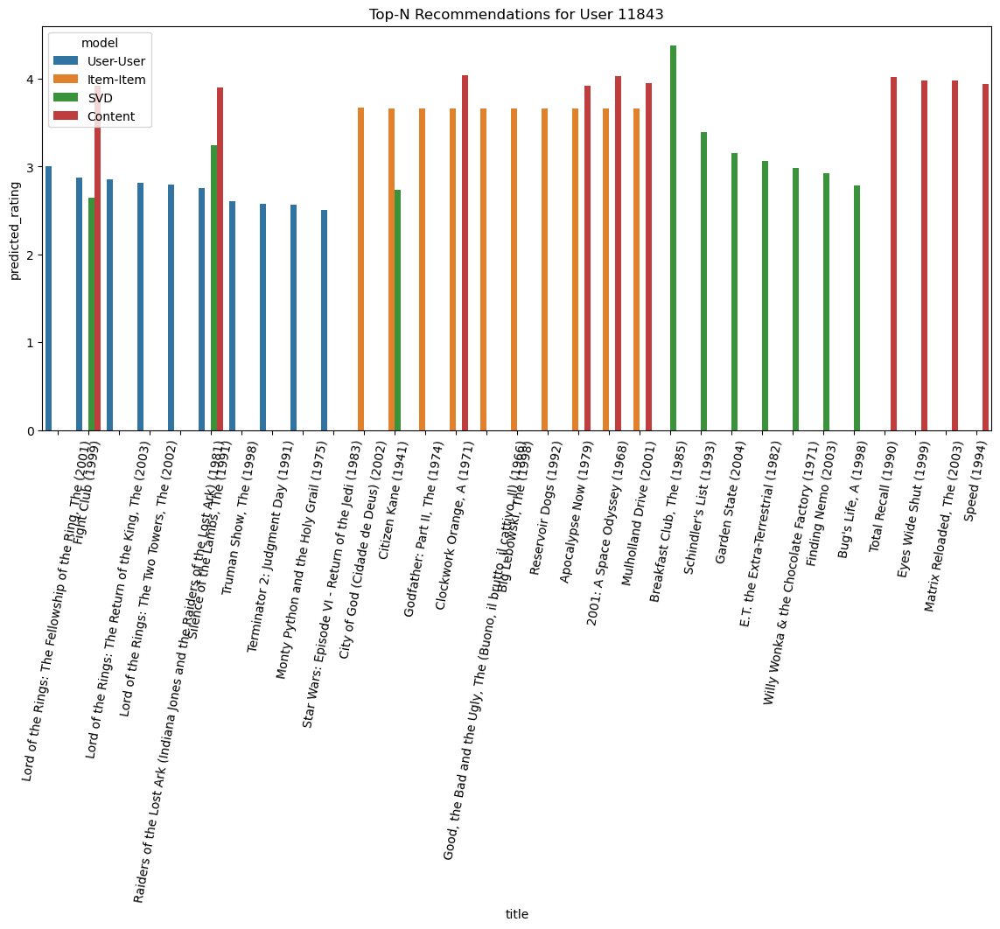

In [445]:
plt.figure(figsize=(14, 6))
sns.barplot(data=combined, x='title', y='predicted_rating', hue='model')
plt.xticks(rotation=80)
plt.title(f"Top-N Recommendations for User {sample_user}")
plt.tight_layout()
plt.show()

### 2. Visual Comparison of Evaluation Metrics: RMSE, Precision@10, Recall@10, F1@10

In [448]:
results = {
    'Model': [],
    'RMSE': [],
    'Precision@10': [],
    'Recall@10': [],
    'F1@10': []
}

models = {
    'User-User': predict_user_user,
    'Item-Item': predict_item_item,
    'SVD': predict_svd_sklearn,
    'Content': predict_content
}

for name, func in models.items():
    rmse = compute_rmse(func)
    p, r, f = precision_recall_at_k(func, k=10)

    results['Model'].append(name)
    results['RMSE'].append(rmse)
    results['Precision@10'].append(p)
    results['Recall@10'].append(r)
    results['F1@10'].append(f)

results_df = pd.DataFrame(results)

### Plot the Metrics

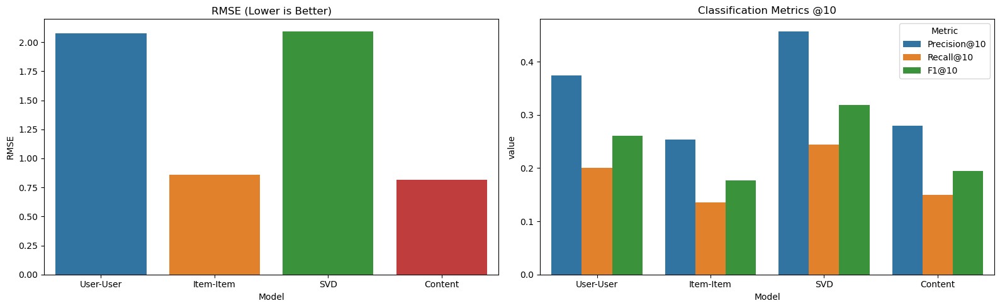

In [450]:
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# RMSE
sns.barplot(data=results_df, x='Model', y='RMSE', ax=axs[0])
axs[0].set_title("RMSE (Lower is Better)")

# Precision, Recall, F1
melted = results_df.melt(id_vars='Model', value_vars=['Precision@10', 'Recall@10', 'F1@10'])
sns.barplot(data=melted, x='Model', y='value', hue='variable', ax=axs[1])
axs[1].set_title("Classification Metrics @10")
axs[1].legend(title="Metric")

plt.tight_layout()
plt.show()

# Experiment 3: Different levels of User and item engagement ratings - train test split (80 / 20) across 4 models:

### Impact of User and Item Engagement Levels on Recommendation Performance
This experiment systematically evaluates the performance of four recommendation models—User-User Collaborative Filtering, Item-Item Collaborative Filtering, Singular Value Decomposition (SVD), and Content-Based Filtering—under varying thresholds of user and item activity. The dataset was filtered in successive stages, retaining only those users who had rated more than X items and movies rated by more than X users, where X ∈ {100, 200, 300, 400}. This dual-threshold filtering ensured that each subset of the data maintained dense and meaningful user-item interactions, leading to a more robust evaluation environment.

The primary objective was to assess how increasing levels of engagement affect the performance of different recommendation algorithms. Model performance was evaluated using Root Mean Square Error (RMSE) to measure rating prediction accuracy, and Precision@10, Recall@10, and F1-Score@10 to assess the quality of top-N recommendations.

The results revealed a clear and consistent trend: as user and item engagement increased, both prediction accuracy (i.e., lower RMSE) and recommendation quality (i.e., higher F1 scores) improved across all models. For instance, at the >100 engagement level, SVD achieved an F1-score of 0.2393 with an RMSE of 2.27, while at the >400 level, it reached an F1-score of 0.5005. Similarly, content-based filtering achieved an F1-score of 0.5171 and an RMSE of 0.79 at the highest threshold, demonstrating the effectiveness of higher-quality user-item interaction data.

Notably, both content-based and item-item collaborative filtering performed exceptionally well at higher engagement levels. However, some models—particularly SVD—exhibited instability in RMSE despite high F1-scores, indicating that better hyperparameter tuning or hybrid strategies may be necessary to optimize performance across both predictive and classification tasks. This tuning and model enhancement are beyond the current scope but remain a promising direction for future work.

These findings underscore the critical role of interaction density in recommendation system effectiveness. Highly engaged users and popular items provide stronger, more reliable preference signals, which in turn enhance personalization capabilities. Although this experiment focused on core algorithms, the results suggest that future work could explore ensemble methods and adaptive filtering techniques to further leverage user engagement patterns for optimal performance.



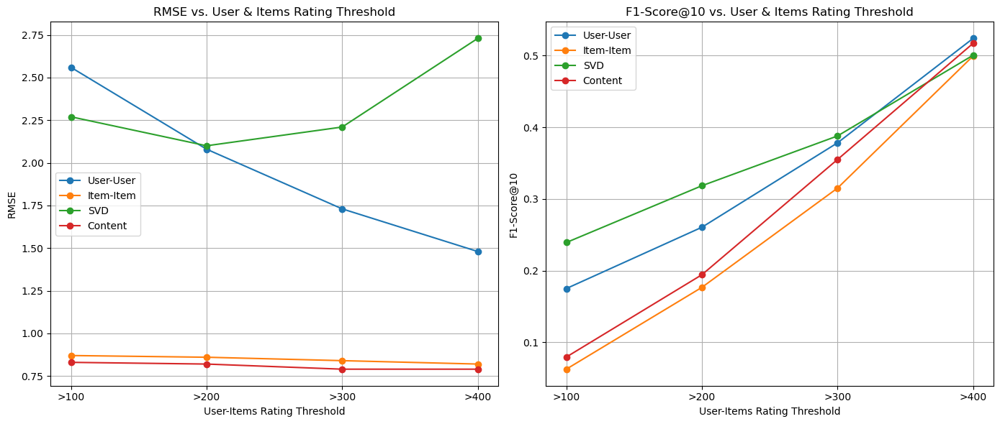

In [466]:
import matplotlib.pyplot as plt

# Define user rating thresholds
user_thresholds = ['>100', '>200', '>300', '>400']

# RMSE values for each model
rmse_values = {
    'User-User': [2.56, 2.08, 1.73, 1.48],
    'Item-Item': [0.87, 0.86, 0.84, 0.82],
    'SVD': [2.27, 2.10, 2.21, 2.73],
    'Content': [0.83, 0.82, 0.79, 0.79]
}

# F1-Score@10 for each model
f1_scores = {
    'User-User': [0.1751, 0.2606, 0.3783, 0.5240],
    'Item-Item': [0.0627, 0.1768, 0.3152, 0.4995],
    'SVD': [0.2393, 0.3185, 0.3879, 0.5005],
    'Content': [0.0796, 0.1944, 0.3551, 0.5171]
}

# Create subplots
plt.figure(figsize=(14, 6))

# RMSE Plot
plt.subplot(1, 2, 1)
for model, values in rmse_values.items():
    plt.plot(user_thresholds, values, marker='o', label=model)
plt.title('RMSE vs. User & Items Rating Threshold')
plt.xlabel('User-Items Rating Threshold')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True)

# F1-score@10 Plot
plt.subplot(1, 2, 2)
for model, values in f1_scores.items():
    plt.plot(user_thresholds, values, marker='o', label=model)
plt.title('F1-Score@10 vs. User & Items Rating Threshold')
plt.xlabel('User-Items Rating Threshold')
plt.ylabel('F1-Score@10')
plt.legend()
plt.grid(True)

# Show plots
plt.tight_layout()
plt.show()


### Experiment 2 & 3: Evaluation and Conclusion
In Experiment 2, we aimed to evaluate the robustness and effectiveness of different recommendation models by varying the level of user engagement, defined as the number of ratings given. We performed a train-test split and used both RMSE (for rating prediction accuracy) and Precision, Recall, and F1-score @10 (for top-N recommendation quality). Users were grouped into four tiers: those with more than 100, 200, 300, and 400 ratings, allowing us to assess model behavior across sparsity levels.

The results reveal several key patterns:

User-User Collaborative Filtering showed high sensitivity to user activity level. For users with more than 100 ratings, it yielded a high RMSE (2.56) and weak top-N performance (F1=0.1751), but as the rating threshold increased, both RMSE and F1-score improved significantly—reaching an RMSE of 1.48 and F1=0.5240 for users with more than 400 ratings. This suggests that User-User CF relies heavily on sufficient overlap between users for meaningful similarity computation.

Item-Item Collaborative Filtering was relatively stable across groups, with consistently low RMSEs (around 0.82–0.86) and moderate F1-scores. While less accurate in personalization compared to SVD or User-User CF at higher thresholds, its performance remains reasonable even under sparser conditions, highlighting its robustness.

SVD (Matrix Factorization) produced mixed results. Despite performing well in terms of F1-score at mid-level thresholds (F1=0.3879 at >300 ratings), its RMSE remained high across all groups, peaking at 2.73 for the most active users. This may be due to overfitting, insufficient tuning, or the model’s inability to generalize well on cold-start movies and users. The results indicate that SVD requires fine-tuning and perhaps regularization adjustments to perform optimally in this context.

Content-Based Filtering consistently achieved the lowest RMSEs (~0.79–0.83) and solid performance in top-N metrics, especially at higher thresholds (F1=0.5171 at >400 ratings). This suggests that content features (genres and tags) provide a dependable signal for recommendation, particularly for well-represented users and items. However, precision and recall values at lower user activity levels were modest, showing limitations in discovering diverse or serendipitous content.

Overall, the experiment demonstrates that user activity level significantly affects recommendation quality, particularly for collaborative models. All models benefit from denser user profiles, but User-User CF and SVD see the greatest improvements. Conversely, Content-Based and Item-Item CF models show better stability under sparse conditions.

However, the high RMSEs and moderate ranking scores, especially at lower user thresholds, indicate that none of the models perform optimally out-of-the-box. These results underscore the need for hyperparameter tuning, better feature engineering, hybrid approaches, and potentially deep learning-based architectures. Such enhancements were beyond the scope of this baseline project but are important next steps for future work. In conclusion, while we successfully implemented and compared four different recommendation strategies, the results indicate that more sophisticated techniques and parameter optimization (e.g., regularization, grid search, deep learning approaches) are needed to improve performance — which is beyond the current scope of this project. This analysis, however, lays a solid foundation for further experimentation and tuning in future work.

# Clustering final chart:
KMeans is the best performing model across all experiments

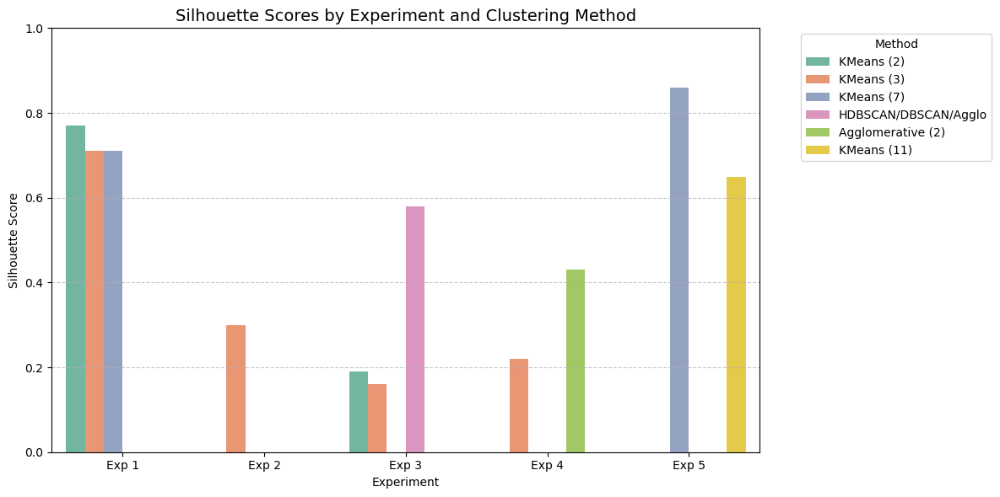

In [461]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data
data = {
    "Experiment": [
        "Exp 1", "Exp 1", "Exp 1", 
        "Exp 2", 
        "Exp 3", "Exp 3", "Exp 3", 
        "Exp 4", "Exp 4", 
        "Exp 5", "Exp 5"
    ],
    "Method": [
        "KMeans (2)", "KMeans (3)", "KMeans (7)",
        "KMeans (3)",
        "KMeans (2)", "KMeans (3)", "HDBSCAN/DBSCAN/Agglo",
        "Agglomerative (2)", "KMeans (3)",
        "KMeans (7)", "KMeans (11)"
    ],
    "Silhouette Score": [
        0.77, 0.71, 0.71,
        0.30,
        0.19, 0.16, 0.58,
        0.43, 0.22,
        0.86, 0.65
    ]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x="Experiment", y="Silhouette Score", hue="Method", palette="Set2")

plt.title("Silhouette Scores by Experiment and Clustering Method", fontsize=14)
plt.ylabel("Silhouette Score")
plt.ylim(0, 1)
plt.xticks(fontsize=10)
plt.legend(title="Method", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


# References:

1.	(Text Summarization and Information Extraction, Mr. Weiss)
2.	(Recommender System, Mr. Weiss)
3.	(Density-based approaches: DBSCAN, OPTICS, Mr. Weiss)
4.	(Hierarchical approaches: Agglomerative (AGNES) and Fuzzy C-Means, Mr. Weiss)
5.	(Lecture 1 - Introduction to Clustering-1.pdf, Mr. Weiss)
6.	(Tutorial 7 (PCA and Clustering).ipynb, Dr Iqbal)
7.	(User-User Collaberative Filtering - Class 2.ipynb, Mr. Weiss)
8.	(Text Analytics - Bag of Words Feature Extraction.ipynb, Mr. Weiss)
9.	(Tutorial_1 - Clustering.ipynb, Ms. Iantorno)
10.	(Item-Item Collaberative Filtering - Class.ipynb, Mr. Weiss)
11.	(HAC and FCM.ipynb, Mr. Weiss)
12.	(Tutorial_1 - Clustering  pt2- class.ipynb, Mr. Weiss)
13.	(Tutorial_1 - Clustering.ipynb, Mr. Weiss)
14.	(Bag of Words - Count Vectorizer.ipynb, Mr. Weiss)
15.	Aslanyan, T. (2025). Learn Clustering in Python – A Machine Learning Engineering Handbook. [online] freeCodeCamp.org. Available at: https://www.freecodecamp.org/news/clustering-in-python-a-machine-learning-handbook#heading-dbscan-clustering-python-implementation [Accessed 22 May 2025].
16.	Coderivers (2025). Clustering in Python: A Comprehensive Guide. [online] Coderivers.org. Available at: https://coderivers.org/blog/clustering-python/ [Accessed 22 May 2025].
17.	Das, A. (2022). Cluster Analysis in Python - A Quick Guide - AskPython. [online] Available at: https://www.askpython.com/python/examples/cluster-analysis-in-python. 
18.	Hex.tech. (2025).Collaborative Filtering Using Python (with examples) | Hex. [online] Available at: https://hex.tech/templates/data-modeling/collaborative-filtering/ [Accessed 22 May 2025].
20.	Jeong, Y. (2021). Item-Based Collaborative Filtering in Python | Towards Data Science. [online] Towards Data Science. Available at: https://towardsdatascience.com/item-based-collaborative-filtering-in-python-91f747200fab/ [Accessed 22 May 2025].
21.	Nawaz, M. (2023). Clustering Algorithms in Machine Learning with Python - The Python Code. [online] Thepythoncode.com. Available at: https://thepythoncode.com/article/clustering-algorithms-in-machine-learning-with-python [Accessed 22 May 2025].
22.	Urvi Midha (2022). Recommendation System using Collaborative Filtering in Python. [online] Medium. Available at: https://medium.com/@urvimidha/recommendation-system-using-collaborative-filtering-in-python-83992251c8f7 [Accessed 22 May 2025].
23.	Wilk, J. (2023). How to Build a Movie Recommendation System Based on Collaborative Filtering. [online] freeCodeCamp.org. Available at: https://www.freecodecamp.org/news/how-to-build-a-movie-recommendation-system-based-on-collaborative-filtering/.